In [71]:
import os
import re
import aocd
import string
import pprint
import numpy as np
import pandas as pd
from functools import reduce  # forward compatibility for Python 3
import operator
from aocd import submit
from tqdm import tqdm
pp = pprint.PrettyPrinter(indent=4)

data = aocd.get_data(day=12, year=2022).split('\n')
#data = """Sabqponm
#abcryxxl
#accszExk
#acctuvwj
#abdefghi""".split('\n')
data = np.array([[y for y in x] for x in data])
start_loc = np.where(data=='S')
end_loc = np.where(data=='E')

start_loc = (start_loc[0][0], start_loc[1][0])
end_loc = (end_loc[0][0], end_loc[1][0])

data[start_loc] = 'a'
data[end_loc] = 'z'

char_to_int = np.vectorize(ord)
data = char_to_int(data) - 97

<AxesSubplot:>

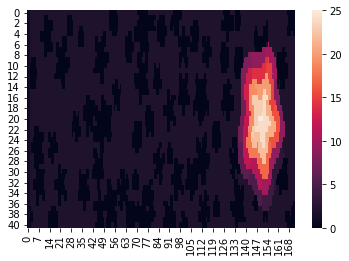

In [88]:
sns.heatmap(data)

In [87]:
import math
from astar import AStar

from typing import Iterable, Union
from heapq import heappush, heappop

class AStarSolver(AStar):

    """sample use of the astar algorithm. In this exemple we work on a maze made of ascii characters,
    and a 'node' is just a (x,y) tuple that represents a reachable position"""

    def __init__(self, data):
        self.data = data

    def heuristic_cost_estimate(self, n1, n2):
        """computes the 'direct' distance between two (x,y) tuples"""
        (x1, y1) = n1
        (x2, y2) = n2
        return (x2 - x1) + (y2 - y1)

    def distance_between(self, n1, n2):
        """this method always returns 1, as two 'neighbors' are always adajcent"""
        return 1

    def neighbors(self, node):
        """ for a given coordinate in the maze, returns up to 4 adjacent(north,east,south,west)
            nodes that can be reached (=any adjacent coordinate that is not a wall)
        """
        y, x = node
        neighbours = [(y-1,x),(y+1,x),(y,x+1), (y,x-1)]

        out = []
        for pos in neighbours:
            if pos[0] < 0 or pos[1] < 0:
                continue
            elif pos[1] >= self.data.shape[1] or pos[0] >= self.data.shape[0]:
                continue
            
            if abs(self.data[pos] - self.data[node]) > 1:
                continue
            out += [pos]
        #print(out)
        return out
    
    def astar(self, start, goal, reversePath: bool = False) -> Union[Iterable, None]:
        if self.is_goal_reached(start, goal):
            return [start]
        searchNodes = AStar.SearchNodeDict()
        startNode = searchNodes[start] = AStar.SearchNode(
            start, gscore=0.0, fscore=self.heuristic_cost_estimate(start, goal)
        )
        openSet:list = []
        heappush(openSet, startNode)
        while openSet:
            current = heappop(openSet)
            #print('Current:', current.data, 'len, options:',len(openSet))
            if self.is_goal_reached(current.data, goal):
                print('REACHED GOAL MFAAAA')
                return self.reconstruct_path(current, reversePath)
            current.out_openset = True
            current.closed = True
            for neighbor in map(lambda n: searchNodes[n], self.neighbors(current.data)):
                if neighbor.closed:
                    continue
                tentative_gscore = current.gscore + self.distance_between(
                    current.data, neighbor.data
                )
                if tentative_gscore >= neighbor.gscore:
                    continue
                neighbor.came_from = current
                neighbor.gscore = tentative_gscore
                neighbor.fscore = tentative_gscore + self.heuristic_cost_estimate(
                    neighbor.data, goal
                )
                if neighbor.out_openset:
                    neighbor.out_openset = False
                    heappush(openSet, neighbor)
                else:
                    # re-add the node in order to re-sort the heap
                    openSet.remove(neighbor)
                    heappush(openSet, neighbor)
    
solver = AStarSolver(data)
path = list(solver.astar(start_loc, end_loc))
len(path) - 1

TypeError: 'NoneType' object is not iterable

In [68]:
path

[(0, 0), (0, 1), (0, 2), (0, 3), (1, 3), (1, 4), (2, 4), (2, 5)]

In [46]:
# check if can go anywhere
# if can, add to paths_to_check
# if cannot, finish
# if longer than current best path length, skip
debug = False

def get_order_of_next_steps(loc, end_loc, data):
    diff = [end_loc[0] - loc[0], end_loc[1] - loc[1]]
    
    if diff[0] == 0:
        diff[0] = 1
    if diff[1] == 0:
        diff[1] = 1
    if debug:
        print('Diff:',diff)
    if abs(diff[0]) > abs(diff[1]):
        if debug:
            print('Going vertical')
        first = (loc[0] + np.sign(diff[0]), loc [1])
        second = (loc[0], loc [1]+np.sign(diff[1]))
        third = (loc[0] - np.sign(diff[0]), loc [1])
        fourth = (loc[0], loc [1]-np.sign(diff[1]))
    else:
        if debug:
            print('Going horizontal')
        second = (loc[0]+np.sign(diff[0]), loc [1])
        first = (loc[0], loc [1]+np.sign(diff[1]))
        fourth = (loc[0]-np.sign(diff[0]), loc [1])
        third = (loc[0], loc [1]-np.sign(diff[1]))
        
    
    out = []
    for pos in [first,second,third,fourth]:
        if pos[0] < 0 or pos[1] < 0:
            continue
        elif pos[1] >= data.shape[1] or pos[0] >= data.shape[0]:
            continue
        out += [pos]
    
    return out


paths_to_check = [[start_loc]]
min_distance_found = 100
while len(paths_to_check):
    print(len(paths_to_check))
    path = paths_to_check.pop()
    if debug:
        print('Checking Path:',path)
    
    cursor = data[path[-1]]
    
    possible_next_steps = get_order_of_next_steps(path[-1], end_loc, data)
    
    
    
    if debug:
        print('Possible_next_steps:', possible_next_steps)
    while len(possible_next_steps):
        possible_next_step = possible_next_steps.pop()
        next_elevation = data[possible_next_step]
        if abs(next_elevation - cursor) <= 1:
            #if we can move to that spot
            if possible_next_step not in path:
                #if we haven't already been there before
                
                if possible_next_step == end_loc:
                    if len(path) < min_distance_found:
                        print('found end?, dist', len(path))
                        min_distance_found = len(path)
                
                elif len(path) < min_distance_found:
                    paths_to_check += [path + [possible_next_step]]
        if debug:
            print(len(possible_next_steps))
            print(len(paths_to_check))
    #
    if debug:
        print('Paths to check', paths_to_check)
        if len(path) > 4:
            break
                
                
            

1
3
5
7
9
11
13
15
17
19
21
23
25
27
29
31
33
35
37
39
41
43
45
47
49
51
53
55
57
59
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
122
123
125
126
127
128
130
129
128
127
128
127
126
126
127
126
125
127
128
128
127
129
128
127
126
127
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
126
127
129
128
127
126
126
125
125
127
126
125
124
125
126
128
127
126
125
125
124
124
126
125
124
123
125
127
128
128
127
129
128
127
126
126
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
125
126
127
126
125
127
126
125
124
126
127
126
125
127
126
125
124
126
125
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
126
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
126
128
129
129
128
130
129
128
127
128
129
128
127
127
126
128
130
129
128
1

125
126
128
130
129
128
127
128
127
126
128
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
123
122
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
127
126
128
130
129
128
127
128
127
126
128
127
126
125
126
128
130
129
128
127
129
128
127
126
127
126
125
126
128
127
126
125
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
125
127
127
126
128
127
126
125
127
126
125
124
126
127
126
125
127
126
125
124
126
125
124
123
125
126
128
127
126
125
127
126
125
124
126
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
127
126
125
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
125
125
126
125
124
126
127
126
125
127
126
125
124
126
125
124
123
125
126
125
124
126
125
124
123
125
124
123
122
124
126
128
127


122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
121
122
122
123
124
123
122
123
122
121
123
124
123
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
122
124
123
122
121
123
122
121
120
122
124
124
124
123
124
124
123
124
123
122
124
125
124
123
125
124
123
122
123
122
121
123
125
126
125
124
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
123
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
121
122
124
126
125
124
123
124
123
122
124
123
122
121
123
125
124
123
122
123
122
121
123
122
121
120
122
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
123
125
124
123
122
122
121
123
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
121
120
119
118
120
122
124
126
128
127


120
122
121
120
119
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
125
124
123
122
123
122
121
123
125
124
123
122
123
122
121
123
122
121
120
122
123
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
123
125
124
123
122
123
122
121
123
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
121
120
119
118
119
120
121
122
123
124
125
126
125
124
126
125
124
123
125
126
125
124
126
125
124
123
124
123
122
124
125
126
125
124
126
125
124
123
125
125
124
126
125
124
123
124
123
122
123
125
124
123
122
123
122
121
123
124
125
126
125
124
126
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
124
124
125
124
123
125
126
125
124
126
125
124
123
124
123
122
123
124
123
122
123
122
121
123
125
127
126
125
124
124
123
125
124
123
122
123
124
123
122
123
122
121
122
124
123
122
121
122
121
120
122
123
124
125
127
126
125
124
126
125
124
123
125
127


126
127
126
125
127
126
125
124
126
125
124
123
125
126
125
124
126
125
124
123
125
124
123
122
124
125
127
126
125
124
126
125
124
123
125
125
124
126
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
127
126
125
124
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
124
124
125
124
123
125
126
125
124
126
125
124
123
125
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
121
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
127
129
128
127
126
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
126
127
129
128
127
126
127
126
125
124
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
125
126
128
127
126
125
127
126
125


125
124
123
125
124
123
122
124
123
122
121
123
123
122
124
123
122
121
123
122
121
120
121
123
124
123
122
124
123
122
121
123
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
123
123
123
123
122
123
123
122
123
124
123
122
123
122
121
123
124
124
123
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
122
124
123
122
121
123
122
121
120
122
124
125
125
124
125
124
123
124
125
124
123
124
123
122
124
125
124
123
125
124
123
122
123
122
121
123
125
126
125
124
125
124
123
125
124
123
122
123
125
124
123
122
123
122
121
122
123
122
121
122
121
120
122
123
124
123
122
124
123
122
121
122
123
122
121
122
121
120
122
124
123
122
121
122
121
120
121
120
119
121
122
123
125
124
123
122
124
123
122
121
123
125
124
123
122
123
122
121
123
122
121
120
122
123
125
124
123
122
124
123
122
121
122
124
123
122
121
122
121
120
122
123
122
121
122
121
120
121
120
119
121
123
125
124
123
122
122
121
123
122
121
120
122
123
122
121
122
121
120
121
120
119
121
123
122
121
120
121


124
123
122
124
123
122
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
124
126
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
124
125
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
127
129
131
130
129
128
130
129
128
127
128
127
126
128
130
129
128
127
129
128
127
126
127
126
125
125
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
126
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
125
124
125
127
126
125
124
126
125
124
123
124


124
123
122
121
123
124
123
122
123
122
121
122
121
120
122
124
123
122
121
122
121
120
120
119
121
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
125
124
126
128
127
126
125
126
125
124
126
125
124
123
124
126
128
127
126
125
127
126
125
124
125
124
123
124
126
125
124
123
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
124
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
127
126
125
124
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
123
125
126
125
124
126
125
124
123
125
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
124
124
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
123
123
124
125
124
123
124
123
122
124
125
124
125
124
123
125
126
125
124
126
125
124
123
125
124
123
122
123
125
124
123
122
124


122
124
124
123
125
124
123
122
123
122
121
122
124
124
123
125
124
123
122
123
122
121
122
123
122
121
122
121
120
122
123
122
123
124
125
124
123
125
124
123
122
123
125
124
123
122
123
122
121
123
124
124
123
124
125
124
123
124
123
122
124
125
125
124
125
124
123
125
126
125
124
126
125
124
123
125
124
123
122
124
124
123
125
124
123
122
122
121
122
122
123
122
121
123
124
123
122
124
123
122
121
121
120
121
122
123
125
124
123
122
124
123
122
121
122
124
123
122
121
122
121
120
121
122
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
120
119
121
122
124
126
128
127
126
125
126
125
124
126
125
124
123
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
122
123
122
121
123
125
124
123
122
123
122
121
122
121
120
121
122
123
122
123
122
121
123
124
123
122
124
123
122
121
121
120
121
123
123
122
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
120
119
120
122
124
126
125
124
123
125
124
123


125
124
123
122
123
122
121
123
122
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
122
123
122
121
122
121
120
122
124
123
122
121
122
121
120
120
119
120
121
123
123
122
123
122
121
123
122
121
120
121
123
122
121
120
121
120
119
120
121
123
122
121
120
121
120
119
119
120
119
118
120
122
124
126
125
124
123
125
124
123
122
124
123
122
121
121
123
122
121
120
122
124
123
122
121
121
120
120
119
120
120
121
120
119
119
119
118
119
121
123
122
121
120
121
120
119
119
118
118
118
117
119
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
124
126
128
127
126
125
127
126
125
124
125
124
123
125
127
126
125
124
125
124
123
123
122
122
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
123
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
126
125
124
123
124
123
122
121


123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
120
122
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
128
130
129
128
127
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
127
128
130
129
128
127
128
127
126
125
125
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
126
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
127
129
128
127
126
128
127
126
125
124
125
127
126
125
124
126
125
124
123
123
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
127
126
125
127
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
123
125
126
125
124
125
124
123
125
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
125
124
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
122
123
125
126


124
123
122
121
122
121
120
122
124
123
122
121
122
121
120
122
121
120
119
121
122
123
122
121
123
122
121
120
122
124
123
122
121
122
121
120
120
119
121
122
121
120
120
119
120
119
118
120
122
124
123
122
121
122
121
120
122
121
120
119
121
122
121
120
120
119
120
119
118
120
122
121
120
119
120
119
118
120
119
118
117
119
119
120
121
122
123
124
125
124
123
125
124
123
122
124
125
124
123
125
124
123
122
123
122
121
123
124
124
123
125
124
123
122
124
124
123
125
124
123
122
123
122
121
122
124
123
122
121
122
121
120
122
122
124
125
124
123
124
123
122
124
123
122
121
123
123
124
123
122
124
125
124
123
125
124
123
122
123
122
121
122
123
122
121
122
121
120
122
124
125
124
123
122
124
123
122
121
122
123
122
121
122
121
120
121
123
122
121
120
121
120
119
120
122
122
123
124
123
122
123
122
121
123
124
123
124
123
122
124
125
124
123
125
124
123
122
123
122
121
122
123
122
121
122
121
120
122
123
124
123
122
124
123
122
121
122
123
122
121
122
121
120
121
123
122
121
120
121
120


126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
123
123
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
120
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
125
127
129
128
127
126
128
127
126
125
126
125
124
125
127
126
125
124
125
124
123
124
125
124
123
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
127
126
125
124
124
123
124
126
125
124
123
125
124
123
122
123
124
126
125
124
123
124
123
122
122
121
121
121
121
120
121
123
125
127
126
125
124
126


123
124
123
122
124
123
122
121
123
122
121
120
121
123
122
121
120
120
119
120
121
122
121
120
122
121
120
119
119
119
118
119
120
121
120
119
119
118
118
118
117
119
120
122
124
123
122
121
122
121
120
122
121
120
119
121
123
122
121
120
119
120
119
118
119
120
122
121
120
119
120
119
118
118
119
118
117
117
119
121
120
119
118
118
117
118
117
116
118
120
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
121
120
122
124
123
122
121
122
121
120
122
121
120
119
120
122
124
123
122
121
123
122
121
120
121
120
119
120
122
121
120
119
120
119
118
120
122
124
123
122
121
122
121
120
122
121
120
119
120
120
119
120
119
118
120
122
121
120
119
120
119
118
120
119
118
117
119
120
121
122
121
120
122
121
120
119
121
123
122
121
120
121
120
119
119
118
119
121
121
120
122
121
120
119
120
119
118
118
119
118
117
117
118
120
119
118
117
118
117
116
118
120
122
124
123
122
121
123
122
121
120
122
121
120
119
120
122
121
120
119
120
119
118
120
122
121
120


126
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
126
125
124
126
125
124
123
125
124
123
122
124
125
127
126
125
124
126
125
124
123
125
126
125
124
126
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
127
126
125
124
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
124
125
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
121
122
123
125
126
128
129
130
129
128
130
129
128
127
128
129
128
127
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
127
129
131
130
129
128
129
128
127
129
128
127
126
127
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
127
126
125
124
123
125
127
129
131
130
129
128


126
125
124
123
124
123
122
124
123
122
121
123
124
125
124
123
125
124
123
122
124
126
125
124
123
124
123
122
123
122
121
123
124
123
122
123
122
121
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
123
124
123
122
123
122
121
121
120
122
124
123
122
121
121
120
121
120
119
121
123
125
127
129
131
133
132
131
130
132
131
130
129
131
130
129
128
130
132
131
130
129
131
130
129
128
129
128
127
129
131
130
129
128
129
128
127
129
128
127
126
128
130
132
131
130
129
131
130
129
128
129
128
127
129
131
130
129
128
130
129
128
127
129
128
127
126
127
129
128
127
126
126
125
127
129
131
130
129
128
129
128
127
129
128
127
126
127
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
128
127
126
127
129
128
127
126
128
127
126
125
127
129
131
130
129
128
130
129
128
127
128
127
126
127
129
128
127
126
127
126
125
126
127
126
125
124
124
125
126
125
124
125
124


126
125
124
126
125
124
123
124
126
125
124
123
122
123
125
124
123
122
124
123
122
121
121
122
124
123
122
121
122
121
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
125
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
122
124
124
123
125
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
123
123
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
120
121
123
123
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
123
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
121
122
124
126
125
124
123
124
123
122
124
123
122
121
123
125
124
123
122
123
122
121
123
122
121
120
122
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119


124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
121
123
123
125
125
126
125
124
126
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
125
124
123
122
124
126
125
125
126
125
124
126
127
126
125
127
126
125
124
125
124
123
125
127
128
127
126
127
126
125
127
126
125
124
125
127
126
125
124
125
124
123
124
125
124
123
124
123
122
124
125
126
125
124
126
125
124
123
124
125
124
123
124
123
122
124
126
125
124
123
124
123
122
123
122
121
123
124
125
127
126
125
124
126
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
124
125
127
126
125
124
126
125
124
123
124
126
125
124
123
124
123
122
124
125
124
123
124
123
122
123
122
121
123
125
127
126
125
124
124
123
125
124
123
122
124
125
124
123
124
123
122
123
122
121
123
125
124
123
122
123
122
121
121
120
122
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
127
126
125
124
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
124
126
128
127
126
125
126
125
124
126


123
125
124
123
122
123
122
121
121
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
123
123
125
124
123
122
124
126
125
124
123
124
123
122
123
122
121
123
124
123
122
123
122
121
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
123
124
123
122
123
122
121
121
120
122
124
123
122
121
121
120
121
120
119
121
122
122
123
124
125
124
123
125
124
123
122
123
125
124
123
122
123
122
121
123
124
123
124
125
124
123
124
123
122
124
125
125
124
125
124
123
125
126
125
124
126
125
124
123
124
123
122
123
123
122
123
122
121
122
123
124
123
122
123
122
121
122
123
122
121
122
121
120
122
124
124
124
124
123
124
124
123
124
125
124
123
124
123
122
124
125
125
124
125
124
123
125
126
125
124
126
125
124
123
124
123
122
122
123
122
121
122
124
125
125
124
125
124
123
124
125
124
123
124
123
122
124
125
124
123
125
124
123
122
122
121
122
124
125
124
123
124
123
122
124
123
122
121
123
125
124


122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
122
124
125
124
123
125
124
123
122
123
122
121
123
125
124
125
124
123
125
124
123
122
124
126
125
124
123
124
123
122
123
122
121
123
124
123
122
123
122
121
121
120
122
123
125
124
123
122
124
123
122
121
123
124
123
122
123
122
121
121
120
122
124
123
122
121
121
120
121
120
119
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
125
124
123
122
123
122
121
123
125
124
123
122
123
122
121
123
122
121
120
122
123
123
122
124
123
122
121
123
125
124
123
122
123
122
121
121
120
122
123
122
121
121
120
121
120
119
121
123
125
124
123
122
123
122
121
123
122
121
120
122
123
122
121
121
120
121
120
119
121
123
122
121
120
121
120
119
121
120
119
118
120
120
122
122
123
124
125
124
123
125
124
123
122
123
125
124
123
122
124
123
122
121
123
124
123
124
125
124
123
124
123
122
124
125
125
124
125
124
123
125
126
125
124
126
125


119
121
123
125
124
123
122
124
123
122
121
123
122
121
120
121
123
122
121
120
121
120
119
121
123
122
121
120
120
119
121
120
119
118
118
119
120
119
118
119
118
117
118
120
122
121
120
119
120
119
118
120
119
118
117
118
120
119
118
117
119
118
117
116
117
118
119
120
121
122
123
124
125
126
125
124
126
125
124
123
125
126
125
124
126
125
124
123
125
124
123
122
124
125
126
125
124
126
125
124
123
125
125
124
126
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
124
125
126
125
124
125
124
123
125
126
125
124
125
124
123
123
122
124
124
125
124
123
125
126
125
124
126
125
124
123
125
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
125
126
125
124
124
123
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
123
122
124
123
122
121
121
120
122
123
124
125
126
125
124
126
125
124
123
124
126
125
124
123
123
122
123
124
126
125
124
123
123
122
123
125
124
123
122
122
121
123
123
124
125
124
123
124
123
122
124
125
124
125
124
123


121
122
124
123
122
121
122
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
121
122
121
120
122
124
123
122
121
122
121
120
121
120
119
120
122
124
126
125
124
123
125
124
123
122
124
123
122
121
122
124
123
122
121
121
120
122
124
123
122
121
121
120
121
120
119
120
122
124
123
122
121
122
121
120
121
120
119
119
120
119
118
119
120
121
120
121
122
121
120
121
120
119
121
122
122
121
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
120
122
121
120
119
119
118
120
122
122
123
122
121
122
123
122
121
122
121
120
122
123
122
121
123
122
121
120
121
120
119
121
123
124
123
122
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
121
120
122
121
120
119
119
118
118
120
121
120
119
121
120
119
118
118
117
119
121
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
128
130
129
128
127
129
128
127
126
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
126
128
130
129
128
127
129
128
127
126
127
126
125
126
128
127
126
125


122
121
120
120
119
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
125
124
123
122
123
122
121
123
125
124
123
122
123
122
121
123
122
121
120
122
123
123
122
124
123
122
121
123
125
124
123
122
123
122
121
122
121
120
122
123
122
121
122
121
120
120
119
121
123
125
124
123
122
123
122
121
123
122
121
120
122
123
122
121
122
121
120
120
119
121
123
122
121
120
120
119
120
119
118
120
122
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
127
129
131
130
129
128
130
129
128
127
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
126
128
127
126
125
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
126
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
128
130
129
128
127
128
127
126
127
126
125
126
128
127
126
125
127
126
125
124
126
128
130
129
128
127
128


122
123
122
121
123
125
124
123
122
122
121
121
120
121
120
120
120
119
120
122
124
123
122
121
122
121
120
120
119
119
119
118
119
120
121
120
121
122
123
122
121
123
122
121
120
121
123
122
121
120
120
119
121
122
122
121
122
123
122
121
122
121
120
122
123
123
122
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
121
123
122
121
120
120
119
119
121
122
121
120
122
121
120
119
119
118
119
121
121
122
121
121
120
121
122
121
120
121
122
121
120
121
120
119
121
122
122
121
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
120
122
121
120
119
119
118
120
122
123
123
122
123
122
121
122
123
122
121
122
121
120
122
123
122
121
123
122
121
120
121
120
119
121
123
124
123
122
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
121
120
122
121
120
119
119
118
118
120
121
120
119
121
120
119
118
118
117
118
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
124
123
122
124
126
125
124
123
124


119
121
123
125
124
123
122
124
123
122
121
123
122
121
120
121
123
122
121
120
120
119
120
122
121
120
119
120
119
118
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
123
122
124
126
125
124
123
124
123
122
124
123
122
121
122
124
126
125
124
123
125
124
123
122
123
122
121
123
125
124
123
122
124
123
122
121
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
122
123
122
121
121
120
122
124
123
122
121
121
120
121
120
119
120
121
121
122
121
120
120
120
119
120
121
123
122
121
120
120
119
119
119
118
120
122
124
126
125
124
123
125
124
123
122
124
123
122
121
122
124
123
122
121
122
121
120
122
124
123
122
121
120
121
120
119
120
120
121
120
119
119
120
119
118
118
120
122
121
120
119
120
119
118
119
118
117
118
119
120
120
121
122
121
120
121
120
119
121
122
121
122
121
120
122
123
122
121
123
122
121
120
121
120
119
119
120
119
118
119
121
121
121
120
121
121
120
121
120
119
121
122
121
120
122
121
120
119
119
118
119
121


124
123
125
124
123
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
127
126
125
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
124
125
126
125
124
126
125
124
123
125
126
125
124
126
125
124
123
125
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
125
125
124
126
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
122
123
124
126
127
129
128
127
126
128
127
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
124
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
124
126
125
124
123
125
127
126
125
124
124
123
125
124
123
122
123
125
127
126
125
124
125
124
123
125
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
121
120
120
120
120
121
122
124
123
122
121
123
122
121
120
121
123
122
121
120
121
120
119
121
123
125
127
129
131
133
132
131
130
132
131
130
129
131
130
129


122
121
120
121
122
124
125
124
123
125
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
123
125
124
123
122
124
123
122
121
123
123
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
125
124
123
122
123
122
121
123
125
124
123
122
123
122
121
123
122
121
120
122
122
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
123
125
124
123
122
123
122
121
123
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
121
120
119
118
118
119
120
121
123
124
126
125
124
123
125
124
123
122
121
123
125
124
123
122
123
122
121
123
122
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
122
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
122
124
123
122
121
123
125
124
123
122


126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
124
123
125
127
126
125
124
125
124
123
125
124
123
122
123
125
127
126
125
124
126
125
124
123
124
123
122
124
126
125
124
123
125
124
123
122
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
121
123
124
124
123
125
124
123
122
124
126
125
124
123
124
123
122
123
122
121
123
124
123
122
123
122
121
121
120
122
123
125
124
123
122
124
123
122
121
123
124
123
122
123
122
121
121
120
122
124
123
122
121
121
120
121
120
119
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
125
124
123
122
123
122
121
123
125
124
123
122
123
122
121
123
122
121
120
122
122
124
123
122
121
123
125
124
123
122
123
122
121
121
120
122
123
122
121
121
120
121
120
119
121
123
125
124
123
122
123
122
121
123
122
121
120
122
123
122
121
121
120
121
120
119
121
123
122
121
120
121
120
119
121
120
119
118
120
120
122
123
123
124
123


126
125
126
125
124
126
128
127
126
125
127
126
125
124
125
124
123
123
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
124
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
123
122
123
125
124
123
122
124
123
122
121
122
124
126
125
124
123
125
124
123
122
123
122
121
122
124
123
122
121
121
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
125
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
122
124
124
123
124
123
122
123
122
121
123
124
123
122
123
122
121
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
123
123
122
123
122
121
121
120
122
124
123
122
121
121
120
121
120
119
120
121
122
123
124
123
122
124
123
122
121
122
124
123
122
121
122
121
120
121
122
123
122
121
122
121
120
120
121
120
119
121
122
124
126
125
124
123
124
123
122
124
123
122
121
123
125
124
123
122
122
121
121
120


125
124
123
122
122
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
127
126
125
124
126
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
123
125
125
124
126
125
124
123
125
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
124
124
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
121
122
124
125
126
125
124
126
125
124
123
124
126
125
124
123
124
123
122
124
125
124
123
124
123
122
123
122
121
123
124
125
124
123
125
124
123
122
124
125
124
123
124
123
122
123
122
121
123
125
124
123
122
123
122
121
121
120
122
123
125
127
126
125
124
125
124
123
125
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
123
123
125
124
123
122
124
126
125
124
123
124
123
122
123
122
121
123
124
123
122
123
122
121
121
120
122
124
126
125
124
123
123
122
124
123
122
121
123
124
123
122
123
122
121
121
120
122
124
123
122
121
121
120
121
120
119
121
123
125
127
129
128


125
124
123
122
124
123
122
121
123
123
122
124
123
122
121
121
120
121
120
122
123
122
121
123
122
121
120
120
119
119
120
121
122
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
119
118
119
121
122
122
122
122
121
122
122
121
121
122
121
120
121
122
122
122
121
121
121
120
121
122
123
122
121
123
122
121
120
121
123
122
121
120
120
119
121
122
122
123
122
121
122
123
122
121
122
121
120
122
123
123
122
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
121
123
122
121
120
120
119
119
121
122
121
120
122
121
120
119
119
118
119
121
122
123
123
122
123
122
121
122
123
122
121
121
120
121
122
123
122
121
121
120
121
122
121
120
121
120
119
121
122
122
121
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
120
122
121
120
119
119
118
120
122
123
124
123
122
123
122
121
122
123
122
121
122
121
120
122
123
122
121
123
122
121
120
121
120
119
121
123
124
123
122
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
121
120
122
121


123
125
124
123
122
124
123
122
121
123
122
121
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
124
123
122
123
125
124
123
122
124
123
122
121
123
125
127
126
125
124
126
125
124
123
124
123
122
124
126
125
124
123
125
124
123
122
123
122
121
122
123
122
121
120
120
121
122
121
120
121
120
119
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
125
124
123
122
124
123
122
121
123
125
124
123
122
123
122
121
123
122
121
120
121
122
123
122
121
121
120
122
123
122
121
121
120
121
120
119
121
123
125
124
123
122
123
122
121
123
122
121
120
122
122
121
121
120
121
120
119
121
123
122
121
120
121
120
119
121
120
119
118
119
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
123
122
121
123
125
124
123
122
122
121
123
122
121
120
122
124
126
125
124
123
125
124
123
122
123
122
121
123
125
124
123
122
124
123
122
121
122
121
120
120
121
120
119
120
122
124
123
122
121
122
121
120
122


127
126
125
124
126
126
127
128
127
126
127
126
125
127
128
127
128
127
126
128
129
128
127
129
128
127
126
128
127
126
125
127
128
127
126
128
127
126
125
127
126
125
124
126
127
129
128
127
126
128
127
126
125
127
128
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
126
128
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
126
127
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
127
126
125
127
126
125
124
126
125
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
126
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
126
128
130
132
134
133
132
131
133
132
131
130
132
131
130
129
131
133
132
131
130
132
131
130
129
130
129
128
130
132
131
130
129
130
129
128
130
129
128
127
129
131
133
132
131
130
132
131
130
129
130
129
128
130
132
131
130
129
131
130
129
128
129
128
127
127
128
127


126
125
126
128
127
126
125
126
125
124
125
126
125
124
125
124
123
125
126
128
127
126
125
127
126
125
124
125
126
125
124
125
124
123
125
127
126
125
124
125
124
123
124
123
122
124
126
128
130
129
128
127
128
127
126
128
127
126
125
125
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
125
126
126
125
127
126
125
124
125
127
126
125
124
125
124
123
125
126
125
124
125
124
123
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
125
126
125
124
125
124
123
124
123
122
124
126
125
124
123
124
123
122
122
121
123
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
127
126
128
130
129
128
127
128
127
126
128
127
126
125
126
128
130
129
128
127
129
128
127
126
127
126
125
126
128
127
126
125
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
126
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
127
129
128
127
126
127


124
123
122
124
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
121
123
125
127
129
131
133
132
131
130
132
131
130
129
131
130
129
128
129
131
130
129
128
129
128
127
129
131
130
129
128
129
128
127
129
128
127
126
128
129
131
130
129
128
129
128
127
126
126
125
127
129
131
130
129
128
129
128
127
129
128
127
126
127
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
127
128
130
129
128
127
129
128
127
126
125
126
128
127
126
125
127
126
125
124
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
127
129
128
127
126
128
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
125
126
127
126
125
127
126
125
124
126
127
126
125
127
126
125
124
126
125
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
126
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
122
123
125
126
128


124
126
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
122
124
124
125
127
127
126
128
127
126
125
127
126
125
124
125
127
126
125
124
126
125
124
123
125
126
125
127
127
126
128
127
126
125
126
125
124
126
128
128
127
127
126
128
127
126
125
126
128
127
126
125
126
125
124
125
126
125
124
125
124
123
125
126
127
126
125
127
126
125
124
125
126
125
124
125
124
123
125
127
126
125
124
125
124
123
124
123
122
124
125
126
128
127
126
125
127
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
125
126
127
126
125
127
126
125
124
125
127
126
125
124
125
124
123
125
126
125
124
125
124
123
124
123
122
124
126
128
127
126
125
125
124
126
125
124
123
125
126
125
124
125
124
123
124
123
122
124
126
125
124
123
124
123
122
122
121
123
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
127
126
125
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
125
127
126
125
124
126
125
124


126
127
126
125
127
126
125
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
128
130
129
128
127
127
126
127
129
128
127
126
127
126
125
126
127
129
128
127
126
127
126
125
126
126
125
125
124
125
126
126
125
125
124
123
123
124
125
127
126
125
124
125
124
123
124
125
124
123
123
122
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
127
126
128
130
129
128
127
128
127
126
128
127
126
125
126
128
130
129
128
127
129
128
127
126
127
126
125
127
129
128
127
126
128
127
126
125
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
125
127
128
127
126
128
127
126
125
127
126
125
124
126
127
126
125
127
126
125
124
126
125
124
123
125
126
128
127
126
125
127
126
125
124
126
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126


122
123
122
121
123
124
123
122
123
122
121
122
121
120
122
124
124
124
124
123
124
124
123
125
125
124
126
125
124
123
124
123
122
124
126
126
125
125
124
126
125
124
123
124
126
125
124
123
124
123
122
122
123
122
121
122
124
125
125
124
125
124
123
125
126
125
124
124
123
125
124
123
122
123
125
124
123
122
123
122
121
122
123
124
123
122
123
122
121
121
122
121
120
122
123
124
126
125
124
123
125
124
123
122
124
126
125
124
123
123
122
122
121
122
122
124
123
122
121
121
121
120
121
123
125
124
123
122
122
121
121
120
120
120
119
121
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
123
124
123
122
122
121
123
125
124
123
122
122
121
122
121
120
122
123
125
125
124
125
124
123
125
124
123
122
123
125
124
123
122
122
121
122
123
123
122
124
123
122
121
121
121
120
121
122
124
123
122
121
121
120
120
120
119
121
123
125
127
126
125
124
126
125


121
123
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
121
120
119
118
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
123
122
124
126
125
124
123
124
123
122
124
123
122
121
122
124
126
125
124
123
125
124
123
122
123
122
121
122
124
123
122
121
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
121
122
121
122
123
122
121
122
121
120
122
123
123
122
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
122
124
123
122
121
123
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
121
120
119
118
120
122
124
126
125
124
123
125
124
123
122
124
123
122
121
122
124
123
122
121
122
121
120
122
124
123
122
121
122
121
120
122
121
120
119
121
122
123
122
121
123
122
121
120
122
124
123
122
121
123


123
122
121
122
121
120
122
123
124
123
122
124
123
122
121
122
123
122
121
122
121
120
121
123
122
121
120
121
120
119
121
122
123
125
124
123
122
124
123
122
121
123
125
124
123
122
123
122
121
123
122
121
120
122
123
123
122
124
123
122
121
122
124
123
122
121
122
121
120
121
122
121
120
121
120
119
121
123
125
124
123
122
122
121
123
122
121
120
121
122
121
120
121
120
119
121
123
122
121
120
121
120
119
120
119
118
120
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
125
124
123
122
123
122
121
123
125
124
123
122
123
122
121
123
122
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
121
121
123
123
122
124
123
122
121
122
121
120
122
124
123
123
122
124
123
122
121
122
124
123
122
121
122
121
120
121
122
121
120
121
120
119
121
122
124
123
122
121
123
122
121
120
121
122
121
120
121
120
119
121
123
122
121
120
121
120
119
120
119
118
120
122
124
126
125
124
123
125
124


126
125
124
123
125
124
123
122
124
123
122
121
123
125
127
129
131
133
135
134
133
132
134
133
132
131
133
132
131
130
131
133
132
131
130
131
130
129
131
133
132
131
130
131
130
129
131
130
129
128
130
131
133
132
131
130
131
130
129
128
128
128
127
129
131
133
132
131
130
131
130
129
131
130
129
128
129
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
129
128
127
126
127
129
130
132
131
130
129
131
130
129
128
127
128
130
129
128
127
129
128
127
126
126
126
127
126
125
127
129
131
133
132
131
130
132
131
130
129
131
130
129
128
129
131
130
129
128
130
129
128
127
129
131
130
129
128
129
128
127
129
128
127
126
126
128
129
128
127
128
127
126
128
127
126
125
127
129
131
130
129
128
129
128
127
129
128
127
126
128
127
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
126
128
129
131
130
129
128
130
129
128
127
126
128
130
129
128
127
127
126
128
127
126
125
126
128
130
129
128
127
128
127
126
128
127
126
125
127
129
128
127
126
126
125
127


123
124
123
122
124
123
122
121
123
124
125
124
123
125
124
123
122
124
126
125
124
123
124
123
122
122
121
123
124
123
122
122
121
122
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
123
124
123
122
122
121
122
121
120
122
124
123
122
121
122
121
120
122
121
120
119
120
122
124
126
128
130
132
134
133
132
131
133
132
131
130
132
131
130
129
130
132
131
130
129
130
129
128
130
132
131
130
129
130
129
128
130
129
128
127
129
130
132
131
130
129
130
129
128
127
127
127
126
128
130
132
131
130
129
130
129
128
130
129
128
127
128
129
128
127
129
128
127
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
129
131
130
129
128
130
129
128
127
126
127
129
128
127
126
128
127
126
125
125
125
125
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
128
130
129
128
127
129
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
126
126
128
127
126
125
127
128
127
126
128
127
126
125
127
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
127
127


122
122
121
123
124
126
128
127
126
125
126
125
124
126
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
124
125
125
124
126
125
124
123
125
127
126
125
124
125
124
123
124
123
122
124
125
124
123
124
123
122
122
121
123
125
127
126
125
124
124
123
125
124
123
122
124
125
124
123
124
123
122
122
121
123
125
124
123
122
122
121
122
121
120
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
125
124
126
128
127
126
125
126
125
124
126
125
124
123
124
126
128
127
126
125
127
126
125
124
125
124
123
124
126
125
124
123
125
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
124
126
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
123
125
125
124
126
125
124
123
124
123
122
124
126
125
125
124
126
125
124
123
125
127
126
125
124
125
124
123
124
123
122
124
125
124
123
124
123
122
122
121
123
124
126
125
124
123
125
124
123
122
124
125
124
123
124
123
122
122
121
123
125
124
123
122
122


123
122
124
124
123
125
124
123
122
122
121
123
123
123
124
123
122
124
125
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
123
125
124
123
122
122
121
121
123
124
123
122
124
123
122
121
121
120
121
121
122
123
124
123
122
124
123
122
121
122
124
123
122
121
122
121
120
122
123
124
124
123
124
123
122
124
125
124
123
125
124
123
122
123
122
121
123
125
125
124
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
122
124
123
122
121
121
120
120
122
123
122
121
123
122
121
120
120
119
120
121
122
123
125
127
126
125
124
125
124
123
125
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
123
125
127
126
125
124
124
123
125
124
123
122
122
123
122
121
123
125
124
123
122
123
122
121
122
121
120
121
123
125
127
126
125
124
125
124
123
125
124
123
122
122
123
122
121
123
125
124
123
122
122
121
122
121
120
121
123
125
124
123
122
123
122
121
122
121
120
120
121
120
119
120
121
122
122
121
122
123
122
121
122
121
120


123
122
123
124
125
124
123
124
123
122
124
125
124
123
124
123
122
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
124
124
123
124
123
122
122
121
123
125
124
123
122
122
121
122
121
120
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
123
122
124
126
125
124
123
123
122
124
123
122
121
122
124
126
125
124
123
125
124
123
122
123
122
121
122
124
123
122
121
122
121
120
121
123
125
124
123
122
123
122
121
123
122
121
120
122
124
123
122
121
122
121
120
122
121
120
119
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
124
123
125
127
126
125
124
125
124
123
125
124
123
122
123
125
127
126
125
124
126
125
124
123
124
123
122
124
126
125
124
123
124
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
123
124
123
122
122
121
123
125
124
123
122
122
121
122
121
120
121
122
122
123
122
121
121
121
120
121
122
124
123
122
121
121
120
120
120
119
121
123
125
127
126
125


124
123
125
124
123
122
123
125
127
126
125
124
126
125
124
123
124
123
122
124
126
125
124
123
124
123
122
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
123
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
122
123
125
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
123
123
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
120
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
127
126
125
125
124
126
128
127
126
125
126
125
124
126
125
124
123
124
125
127
126
125
124
125
124
123
123
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
122
123
124
126
125
124
123
125
124
123
122
123
125
124
123


127
126
125
124
126
125
124
123
125
124
123
122
123
125
124
123
122
123
122
121
123
125
124
123
122
121
122
121
120
121
121
122
121
120
120
121
120
119
119
121
123
122
121
120
121
120
119
120
119
118
119
120
122
121
121
122
123
122
121
122
121
120
122
123
122
123
122
121
123
124
123
122
124
123
122
121
122
121
120
120
121
120
119
120
122
123
122
122
121
122
122
121
122
121
120
122
123
122
121
123
122
121
120
120
119
120
122
123
122
121
122
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
119
118
119
120
122
124
126
125
124
123
125
124
123
122
124
123
122
121
121
123
122
121
120
122
124
123
122
121
121
120
120
119
120
122
124
123
122
121
122
121
120
120
119
118
118
119
121
123
122
121
120
122
121
120
119
119
118
118
120
119
118
117
119
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
124
126
128
127
126
125
127
126
125
124
125
124
123
124
126
125
124
123
124
123
122


119
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
124
123
122
124
126
125
124
123
123
122
124
123
122
121
123
125
127
126
125
124
126
125
124
123
124
123
122
124
126
125
124
123
125
124
123
122
123
122
121
121
122
121
120
121
123
125
124
123
122
123
122
121
123
122
121
120
122
124
123
122
121
122
121
120
122
121
120
119
120
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
121
120
121
123
122
121
120
121
120
119
120
122
124
123
122
121
123
122
121
120
121
120
119
120
122
121
120
119
120
119
118
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
123
122
124
126
125
124
123
124
123
122
124
123
122
121
122
124
126
125
124
123
125
124
123
122
123
122
121
123
125
124
123
122
124
123
122
121
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
122
122
121
122
121
120
122
124
123
122
121
122
121
120
122
121
120
119
120
121
122
123
122
121
122


124
123
125
124
123
122
124
123
122
121
123
123
125
124
123
122
124
124
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
121
123
123
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
123
123
122
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
122
121
123
122
121
120
120
119
121
122
121
122
123
124
125
124
123
125
124
123
122
124
124
123
125
124
123
122
124
123
122
121
122
124
124
123
125
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
123
123
122
123
124
125
124
123
125
124
123
122
123
125
124
123
122
124
123
122
121
123
124
124
124
123
124
125
124
123
124
123
122
124
125
125
124
125
124
123
125
126
125
124
126
125
124
123
125
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
124
125
124
123
125
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
122
121
120
122
123
124
124
123
123
122


121
122
121
120
122
124
125
124
123
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
121
123
122
121
120
120
119
119
121
122
121
120
122
121
120
119
119
118
119
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
124
126
128
127
126
125
127
126
125
124
125
124
123
125
127
126
125
124
125
124
123
123
122
122
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
123
123
122
123
122
121
123
125
124
123
122
123
122
121
121
120
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
126
125
124
123
124
123
122
121
122
124
123
122
121
123
122
121
120
120
122
124
123
122
121
122
121
120
121
120
119
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
125
124
123
122
124
123
122
121
123
125
124
123
122
122
121
121
120
120
120
120
119
120
122
124
123
122
121
122
121
120
120
119
119
118
119
121
123
125
127
126
125
124
126
125
124


121
120
119
121
122
121
120
122
121
120
119
121
120
119
118
120
120
120
119
121
122
121
120
122
121
120
119
121
120
119
118
120
120
119
121
120
119
118
118
117
118
120
121
122
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
121
120
119
118
120
119
121
120
119
118
118
117
117
119
120
119
118
120
119
118
117
117
116
118
120
120
120
120
121
120
119
120
120
119
120
121
122
121
120
122
121
120
119
120
122
121
120
119
120
119
118
120
121
121
121
120
121
122
121
120
121
120
119
121
122
122
121
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
121
120
122
121
120
119
121
120
119
118
119
121
122
121
120
122
121
120
119
121
120
119
118
120
119
121
120
119
118
118
117
119
121
122
122
122
121
122
122
121
121
120
121
122
122
121
121
120
121
122
121
120
121
120
119
121
122
122
121
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
120
122
121
120
119
121
120
119
118
120
122
123
124
123
122
123
122
121
122
123
122
121
122
121
120
122
123
122
121
123
122
121
120
121


124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
123
123
125
124
123
122
124
126
125
124
123
124
123
122
123
122
121
123
124
123
122
123
122
121
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
123
124
123
122
123
122
121
121
120
122
124
123
122
121
121
120
121
120
119
120
121
122
123
123
124
123
122
124
125
124
123
125
124
123
122
122
121
122
124
124
123
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
121
120
121
122
123
125
124
123
122
124
123
122
121
123
125
124
123
122
122
121
122
121
120
121
123
125
124
123
122
122
121
122
121
120
120
121
120
119
121
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
123
124
123
122
123
122
121
123
125
124
123
122
123
122
121
121
120
121
121
122
123
122
121
122
121
120
121
122
124
123
122
121
122
121
120
120
121
120
119
121
123
125
127
126
125
124
126
125
124
123
125
124


123
123
122
124
126
125
124
123
124
123
122
124
123
122
121
122
124
126
125
124
123
125
124
123
122
123
122
121
122
124
123
122
121
122
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
122
122
121
122
121
120
122
124
123
122
121
122
121
120
120
119
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
125
124
123
122
123
122
121
123
125
124
123
122
122
121
121
120
120
120
120
119
120
122
124
123
122
121
122
121
120
120
119
119
118
119
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
126
125
124
123
124
123
122
121
123
125
124
123
122
122
121
121
120
120
122
124
123
122
121
122
121
120
121
120
119
120
122
124
123
122
121
122
121
120
120
119
118
118
119
121
123
122
121
120
122
121
120
119
119
118
119
121
120
119
118
118
117
119
121
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
128
130
129
128
127
129
128
127
126
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
126
128
130
129
128
127
129
128
127
126
127
126
125
127
129
128


123
125
124
123
122
123
122
121
123
122
121
120
120
121
120
119
121
123
122
121
120
121
120
119
120
119
118
119
121
123
125
124
123
122
124
123
122
121
123
122
121
120
121
123
122
121
120
120
119
121
123
122
121
120
120
119
120
119
118
119
121
123
122
121
120
121
120
119
120
119
118
118
119
118
117
119
120
121
121
120
121
122
123
122
121
123
122
121
120
121
123
122
121
120
121
120
119
121
122
122
122
121
122
123
122
121
122
121
120
122
123
123
122
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
122
121
123
122
121
120
122
121
120
119
120
122
123
122
121
123
122
121
120
122
121
120
119
121
120
122
121
120
119
119
118
120
122
122
123
123
122
122
121
122
123
123
122
121
122
123
122
121
122
121
120
122
123
123
122
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
121
123
122
121
120
122
121
120
119
121
123
124
124
123
124
123
122
123
124
123
122
123
122
121
123
124
123
122
124
123
122
121
122
121
120
122
124
125
124
123
124
123
122
124
123
122
121
123
125
124
123


124
123
122
124
126
128
127
126
125
127
126
125
124
125
124
123
125
127
126
125
124
125
124
123
124
123
122
123
124
123
122
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
127
126
125
124
126
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
123
125
125
124
125
124
123
124
123
122
124
125
124
123
124
123
122
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
124
124
123
124
123
122
122
121
123
125
124
123
122
122
121
122
121
120
121
121
122
123
124
123
122
123
122
121
121
122
121
120
122
123
125
127
126
125
124
125
124
123
125
124
123
122
124
126
125
124
123
123
122
122
121
122
121
121
121
120
121
123
125
124
123
122
122
121
121
120
120
120
119
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
124
123
125
127
126
125
124
125
124
123
125
124
123
122
123
125
127
126
125
124
126
125
124
123
124
123
122
123
125
124
123
122
124
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
123
124
123


120
122
121
120
119
121
122
121
120
122
121
120
119
120
119
118
120
121
120
120
119
121
122
121
120
122
121
120
119
120
119
118
119
119
118
119
118
117
119
118
120
121
123
122
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
120
119
118
119
118
119
118
117
117
118
119
118
117
118
117
116
116
118
119
121
122
121
120
121
120
119
121
120
119
118
120
122
121
120
119
121
120
119
118
119
118
117
119
121
121
120
122
121
120
119
121
120
119
118
120
122
121
120
119
121
120
119
118
119
118
117
118
117
118
117
116
116
117
118
117
116
117
116
115
116
118
120
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
125
127
129
128
127
126
128
127
126
125
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
124
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123


127
129
128
127
126
126
125
127
126
125
124
126
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
127
126
128
130
129
128
127
128
127
126
128
127
126
125
126
128
130
129
128
127
129
128
127
126
127
126
125
126
128
127
126
125
127
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
125
126
127
126
125
126
125
124
126
127
126
127
126
125
127
128
127
126
128
127
126
125
127
126
125
124
126
127
126
125
127
126
125
124
126
125
124
123
125
126
128
127
126
125
127
126
125
124
126
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
127
126
125
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
125
126
126
125
127
126
125
124
126


126
126
125
126
125
124
126
125
124
123
125
127
126
125
124
125
124
123
124
123
122
124
125
124
123
124
123
122
122
121
123
124
126
125
124
123
125
124
123
122
124
125
124
123
124
123
122
122
121
123
125
124
123
122
122
121
122
121
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
123
124
125
124
123
125
124
123
122
124
126
125
124
123
124
123
122
122
121
123
124
123
122
122
121
122
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
123
124
123
122
122
121
122
121
120
122
124
123
122
121
122
121
120
122
121
120
119
121
123
125
127
129
131
133
135
134
133
132
134
133
132
131
133
132
131
130
131
133
132
131
130
131
130
129
131
133
132
131
130
131
130
129
131
130
129
128
130
131
133
132
131
130
131
130
129
128
128
128
127
129
131
133
132
131
130
131
130
129
131
130
129
128
129
130
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
129
128
127
126
127
129
130
132
131
130
129
131


131
130
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
127
129
131
130
129
128
130
129
128
127
128
127
126
127
129
128
127
126
127
126
125
126
127
126
125
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
127
129
128
127
126
126
125
126
128
127
126
125
127
126
125
124
125
126
128
127
126
125
126
125
124
125
126
125
124
124
123
124
125
125
124
125
124
123
124
125
124
123
123
122
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
127
126
125
124
126
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
124
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
127
129
128
127
126
126
125
127
129
128
127
126
126
125


123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
124
126
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
122
124
125
125
124
126
125
124
123
125
127
126
125
124
125
124
123
124
123
122
124
125
124
123
124
123
122
122
121
123
124
126
125
124
123
125
124
123
122
124
125
124
123
124
123
122
122
121
123
125
124
123
122
122
121
122
121
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
123
123
125
124
123
122
124
126
125
124
123
124
123
122
122
121
123
124
123
122
122
121
122
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
123
124
123
122
122
121
122
121
120
122
124
123
122
121
122
121
120
122
121
120
119
121
121
122
124
125
125
124
126
125
124
123
124
126
125
124
123
124
123
122
123
123
122
123
122
121
122
123
124
123
122
123
122
121
123
124
123
122
123
122
121
122
121
120
122
123
122
124
125
125
124
126
125
124
123
124
126
125
124
123
124
123


124
126
125
124
123
123
122
124
126
125
124
123
124
123
122
124
123
122
121
121
123
124
123
122
123
122
121
123
122
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
123
122
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
118
119
121
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
128
130
129
128
127
129
128
127
126
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
126
128
130
129
128
127
129
128
127
126
127
126
125
126
128
127
126
125
126
125
124
125
126
125
124
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
125
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
127
126
125
125
124
125
127
126
125
124
126
125
124
123
124
125
127
126
125
124
125
124
123
124
124
123
122
122
123
123
122
122
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
127
126
125
124
126
125
124
123
125
127
126
125
124
125


125
124
123
125
126
125
124
126
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
125
127
129
131
133
132
131
130
132
131
130
129
131
130
129
128
130
132
131
130
129
131
130
129
128
129
128
127
129
131
130
129
128
129
128
127
129
128
127
126
128
130
132
131
130
129
131
130
129
128
129
128
127
128
130
129
128
127
128
127
126
127
128
127
126
127
126
125
127
129
131
130
129
128
129
128
127
129
128
127
126
126
128
127
126
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
128
130
129
128
127
127
126
127
129
128
127
126
128
127
126
125
126
127
129
128
127
126
127
126
125
126
127
126
125
125
124
125
126
126
125
126
125
124
126
127
126
125
125
124
123
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
127
126
125
127
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
125
126
125
124
126
125
124
123
125
127
126
125
124


123
122
122
121
122
121
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
123
123
125
124
123
122
124
126
125
124
123
124
123
122
122
121
123
124
123
122
122
121
122
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
123
124
123
122
122
121
122
121
120
122
124
123
122
121
122
121
120
122
121
120
119
120
122
122
124
125
125
124
126
125
124
123
124
126
125
124
123
124
123
122
122
123
122
121
122
124
123
124
124
123
125
124
123
122
123
125
124
123
122
123
122
121
122
123
124
123
122
123
122
121
121
122
121
120
122
123
124
126
125
124
123
125
124
123
122
124
126
125
124
123
123
122
122
121
122
122
124
123
122
121
121
121
120
121
123
125
124
123
122
122
121
121
120
120
120
119
121
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
123
124
123
122
122


125
124
125
124
123
125
127
126
125
124
126
125
124
123
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
124
126
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
122
123
125
126
125
124
125
124
123
124
123
122
124
125
124
123
124
123
122
122
121
123
124
126
125
124
123
125
124
123
122
124
124
123
124
123
122
122
121
123
125
124
123
122
122
121
122
121
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
123
123
124
123
122
124
125
124
123
124
123
122
122
121
123
124
123
122
122
121
122
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
123
124
123
122
122
121
122
121
120
122
124
123
122
121
122
121
120
122
121
120
119
120
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
125
127
129
128
127
126
128
127
126
125
126
125
124
126
128
127


124
123
122
124
123
122
121
123
124
125
124
123
125
124
123
122
124
124
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
123
123
124
123
122
124
125
124
123
124
123
122
122
121
123
123
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
124
125
124
123
123
122
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
122
121
123
122
121
120
120
119
121
121
122
122
123
122
121
122
124
123
122
121
121
120
122
122
123
124
123
122
123
122
121
123
124
123
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
123
124
123
122
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
122
121
123
122
121
120
120
119
121
122
122
123
122
121
120
122
123
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
121
123
122
121
120
120
119
119
121
122
121
120
122
121
120
119
119
118
119
121
121
122
123
124
123
122


121
120
122
121
120
119
120
122
121
120
119
121
120
119
118
120
122
123
124
123
122
123
122
121
122
123
122
121
122
121
120
122
123
122
121
123
122
121
120
121
120
119
121
123
124
123
122
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
121
122
121
120
122
121
120
119
120
119
118
120
121
120
120
119
121
122
121
120
122
121
120
119
120
119
118
119
119
118
119
118
117
119
118
120
121
123
122
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
120
119
118
119
118
119
118
117
117
118
119
118
117
118
117
116
116
118
119
121
122
121
120
121
120
119
121
120
119
118
120
122
121
120
119
121
120
119
118
119
118
117
119
121
121
120
122
121
120
119
121
120
119
118
120
122
121
120
119
121
120
119
118
119
118
117
118
117
118
117
116
116
117
118
117
116
117
116
115
117
118
120
122
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
127
129
131
130
129
128


121
122
123
122
121
123
122
121
120
121
123
122
121
120
122
121
120
119
121
122
122
122
121
122
123
122
121
122
121
120
122
123
123
122
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
122
121
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
121
120
122
121
120
119
119
118
120
119
121
122
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
121
120
122
121
120
119
119
118
118
120
121
120
119
121
120
119
118
118
117
117
119
120
121
121
120
121
120
119
121
122
121
120
122
121
120
119
120
119
118
120
122
122
121
122
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
121
120
119
118
120
119
121
120
119
118
118
117
117
119
120
119
118
120
119
118
117
117
116
117
119
119
120
119
119
120
121
120
119
120
119
118
119
120
119
118
119
120
121
122
121
120
122
121
120
119
121
121
120
122
121
120
119
121
120
119
118
119
121
121
120
122
121
120
119
121
120
119
118
119
121
120
119
118
118
117


128
127
128
130
129
128
127
128
127
126
128
129
128
127
129
128
127
126
126
125
126
128
129
128
127
128
127
126
128
127
126
125
126
128
127
126
125
126
125
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
128
130
129
128
127
129
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
126
127
128
127
126
128
127
126
125
127
128
127
126
128
127
126
125
127
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
127
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
129
131
133
132
131
130
132
131
130
129
131
130
129
128
130
132
131
130
129
131
130
129
128
129
128
127
129
131
130
129
128
128
127
129
128
127
126
128
130
132
131
130
129
131
130
129
128
129
128
127
128
130
129
128
127
128
127
126
127
128
127
126
128
127
126
125
126
128
130
129
128
127
128
127
126
128
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
128
130
129
128
127
127
126
127


128
127
126
125
127
126
125
124
126
125
124
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
128
130
129
128
127
129
128
127
126
127
126
125
126
128
127
126
125
127
126
125
124
126
128
130
129
128
127
129
128
127
126
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
126
128
127
126
125
126
125
124
123
123
125
126
125
124
126
125
124
123
124
123
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
127
126
125
127
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
124
125
127
126
125
124
126
125
124
123
125
126
125
124
126
125
124
123
125
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
125
125
124
126
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
126
125
124
126
128
127
126
125
125
124
126
125
124
123
125
127
129
128
127
126
128
127
126
125
126
125
124
126
128
127
126
125
126
125
124
126


126
125
124
123
124
123
122
124
123
122
121
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
120
121
122
123
122
121
122
121
120
122
123
122
121
122
121
120
121
120
119
121
122
124
123
122
121
123
122
121
120
122
122
121
122
121
120
121
120
119
121
123
122
121
120
121
120
119
119
118
120
122
124
126
125
124
123
125
124
123
122
124
123
122
121
122
124
123
122
121
122
121
120
122
124
123
122
121
122
121
120
122
121
120
119
121
121
122
121
120
122
123
122
121
122
121
120
121
120
119
121
122
121
120
121
120
119
119
118
120
122
124
123
122
121
122
121
120
122
121
120
119
121
122
121
120
121
120
119
119
118
120
122
121
120
119
119
118
119
118
117
118
120
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
127
126
125
125
124
126
128
127
126
125
126
125
124
126
125
124
123
124
125
127
126
125
124
125
124
123
123
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
124
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122


120
122
122
122
121
122
122
121
122
121
120
122
123
122
121
123
122
121
120
120
119
120
122
123
122
121
122
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
119
118
119
120
121
123
125
124
123
122
123
122
121
123
122
121
120
122
124
123
122
121
121
120
120
119
120
122
124
123
122
121
121
120
120
119
118
118
119
121
123
122
121
120
121
120
119
119
118
118
119
118
117
119
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
123
122
124
126
125
124
123
124
123
122
124
123
122
121
122
124
126
125
124
123
125
124
123
122
123
122
121
122
124
123
122
121
123
122
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
122
122
121
121
120
122
124
123
122
121
121
120
121
120
119
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
125
124
123
122
123
122
121
123
125
124
123
122
121
122
121
120
120
120
120
119
119
121
123
122
121
120
121
120
119
120
119
118
119
119
120
121
121
120
122
121
120
119
120
122
121
120
119
120
119


120
121
120
119
120
122
121
120
119
120
119
118
120
122
124
126
125
124
123
125
124
123
122
124
123
122
121
122
124
123
122
121
123
122
121
120
122
124
123
122
121
120
121
120
119
119
119
118
118
120
122
121
120
119
120
119
118
119
118
117
117
117
117
119
121
120
119
118
119
118
117
117
116
117
119
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
120
119
121
123
122
121
120
119
120
119
118
119
121
123
122
121
120
122
121
120
119
120
119
118
119
121
120
119
118
119
118
117
117
119
121
120
119
118
119
118
117
118
117
116
116
115
116
118
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
123
125
127
126
125
124
126
125
124
123
124
123
122
124
126
125
124
123
125
124
123
122
123
122
121
122
123
122
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
122
122
121
121
120
122
124
123
122
121
121
120
121
120
119
121
123
125
127
126
125


124
123
122
121
123
125
127
126
125
124
126
125
124
123
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
122
124
123
122
121
121
120
121
123
125
124
123
122
123
122
121
123
122
121
120
122
124
123
122
121
122
121
120
122
121
120
119
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
123
122
121
122
124
123
122
121
122
121
120
122
124
126
125
124
123
125
124
123
122
123
122
121
123
125
124
123
122
123
122
121
122
121
120
121
122
121
120
119
119
120
121
120
119
120
119
118
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
123
122
124
126
125
124
123
124
123
122
124
123
122
121
122
124
126
125
124
123
125
124
123
122
123
122
121
123
125
124
123
122
124
123
122
121
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
122
122
121
122
121
120
122
124
123
122
121
122
121
120
122
121
120
119
120
121
121
122
121
120
120
121
120
119
119
120
122
121
120
119
120
119
118
120
122
124


134
136
135
134
133
135
134
133
132
133
135
134
133
132
134
133
132
131
133
135
134
133
132
133
132
131
133
132
131
130
131
132
133
132
131
133
132
131
130
132
133
132
131
133
132
131
130
132
131
130
129
131
133
135
134
133
132
133
132
131
133
132
131
130
132
132
131
133
132
131
130
132
131
130
129
131
133
132
131
130
132
131
130
129
131
130
129
128
130
131
133
134
135
134
133
135
134
133
132
133
134
133
132
133
132
131
133
135
134
133
132
132
131
133
132
131
130
131
133
135
134
133
132
133
132
131
133
132
131
130
132
134
133
132
131
132
131
130
132
131
130
129
128
128
128
128
128
127
129
131
133
135
137
136
135
134
136
135
134
133
135
134
133
132
134
136
135
134
133
135
134
133
132
132
131
133
135
134
133
132
133
132
131
133
132
131
130
131
133
135
134
133
132
134
133
132
131
132
131
130
131
133
132
131
130
131
130
129
131
133
135
134
133
132
133
132
131
133
132
131
130
131
133
132
131
130
132
131
130
129
131
133
132
131
130
132
131
130
129
131
130
129
128
129
130
131
132
131
130
132


128
130
132
131
130
129
131
130
129
128
128
127
129
131
130
129
128
129
128
127
129
128
127
126
127
129
131
130
129
128
130
129
128
127
128
127
126
127
129
128
127
126
127
126
125
127
129
131
130
129
128
129
128
127
129
128
127
126
127
129
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
127
127
128
127
126
128
129
128
127
129
128
127
126
127
126
125
127
129
129
128
129
128
127
129
128
127
126
128
130
129
128
127
129
128
127
126
128
127
126
125
127
128
127
126
128
127
126
125
127
126
125
124
126
127
129
128
127
126
128
127
126
125
127
128
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
127
129
128
127
126
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
126
127
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
127
126
125
127
126
125
124
126
125
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124


133
132
131
130
132
131
130
129
131
130
129
128
130
132
131
130
129
131
130
129
128
128
127
129
131
130
129
128
129
128
127
129
128
127
126
127
129
131
130
129
128
130
129
128
127
128
127
126
127
129
128
127
126
127
126
125
127
129
131
130
129
128
129
128
127
129
128
127
126
127
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
128
130
129
128
127
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
126
128
129
128
127
129
128
127
126
128
127
126
125
127
128
127
126
128
127
126
125
127
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
127
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
125
126
127
129
128
127
126
128
127
126
125
126
128
127
126
125
127
126
125
124
126
127
126
127
129
128
127
126
127
126
125
127
128
128
127
129
128
127
126
127
129
128
127
126
127
126
125
126
127
126
125
126
125
124
126
127
128
127
126
128
127
126


130
132
131
130
129
131
130
129
128
130
129
128
127
128
130
129
128
127
129
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
126
127
128
127
126
128
127
126
125
127
128
127
126
128
127
126
125
127
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
127
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
123
124
126
127
129
128
127
126
128
127
126
125
124
126
128
127
126
125
125
124
126
125
124
123
124
126
128
127
126
125
126
125
124
126
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
127
126
128
130
129
128
127
128
127
126
128
127
126
125
126
128
130
129
128
127
129
128
127
126
127
126
125
126
128
127
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
125
126
127
126
125
127
126
125
124
126
127
126
125
127
126


127
129
128
127
126
127
126
125
127
126
125
124
125
126
128
127
126
125
127
126
125
124
126
127
126
125
127
126
125
124
126
125
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
126
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
124
125
127
128
130
129
128
127
129
128
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
125
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
125
127
126
125
124
126
128
127
126
125
125
124
126
125
124
123
124
126
128
127
126
125
126
125
124
126
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
122
122
121
123
125
127
129
131
133
135
134
133
132
134
133
132
131
133
132
131
130
132
134
133
132
131
133
132
131
130
131
130
129
131
133
132
131
130
131
130
129
131
130
129
128
130
132
134
133
132
131
133
132
131
130
131
130
129
131
133
132
131
130
132
131
130
129
131


126
126
127
126
125
127
128
127
126
128
127
126
125
126
125
124
125
125
124
125
124
123
124
125
126
125
124
125
124
123
124
125
124
123
124
123
122
124
125
124
126
126
127
126
125
127
128
127
126
128
127
126
125
126
125
124
124
125
124
123
124
126
126
125
125
126
125
124
126
127
126
125
127
126
125
124
124
123
124
126
127
126
125
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
123
122
123
124
125
127
126
125
124
126
125
124
123
125
127
126
125
124
124
123
124
123
122
123
125
127
126
125
124
124
123
124
123
122
122
123
122
121
123
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
125
127
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
125
126
125
124
125
124
123
125
127
126
125
124
125
124
123
123
122
123
124
125
124
126
125
124
123
124
126
125
124
123
124
123
122
123
124
126
125
124
123
124
123
122
122
123
122
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
124
126
125
124
123
125


123
125
126
127
126
125
127
126
125
124
126
128
127
126
125
126
125
124
125
124
123
125
126
125
124
125
124
123
123
122
124
125
127
126
125
124
126
125
124
123
125
126
125
124
125
124
123
123
122
124
126
125
124
123
123
122
123
122
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
127
126
125
124
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
124
124
126
125
124
123
125
127
126
125
124
125
124
123
123
122
124
125
124
123
123
122
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
124
125
124
123
123
122
123
122
121
123
125
124
123
122
123
122
121
123
122
121
120
122
123
123
124
125
127
126
125
124
126
125
124
123
124
126
125
124
123
124
123
122
124
125
124
125
127
126
125
124
125
124
123
125
126
126
125
127
126
125
124
125
127
126
125
124
125
124
123
124
124
123
124
123
122
123
124
125
124
123
124
123
122
124
125
124
123
124
123
122
123
122
121
123
125
125
125
125
124
125
125
124
125
127
126
125
124
125
124
123
125
126
126
125
127
126
125
124


127
127
126
128
130
132
131
130
129
130
129
128
130
129
128
127
128
129
128
127
129
128
127
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
129
131
130
129
128
130
129
128
127
126
127
129
128
127
126
128
127
126
125
125
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
128
130
129
128
127
129
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
126
127
128
127
126
128
127
126
125
127
128
127
126
128
127
126
125
127
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
127
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
125
127
128
130
129
128
127
129
128
127
126
125
127
129
128
127
126
126
125
127
126
125
124
125
127
129
128
127
126
127
126
125
127
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
122
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
127
126
128
130
129
128
127
128
127
126
128
127
126
125
126
128
130
129
128
127
129


131
132
131
130
131
133
132
131
130
132
131
130
129
131
132
134
133
132
131
132
131
130
129
130
131
130
129
129
128
129
130
131
130
129
130
129
128
129
130
129
128
129
128
127
129
131
133
135
134
133
132
134
133
132
131
133
132
131
130
131
133
132
131
130
132
131
130
129
131
133
132
131
130
131
130
129
131
130
129
128
129
130
131
130
129
131
130
129
128
130
131
130
129
131
130
129
128
130
129
128
127
129
131
133
132
131
130
131
130
129
131
130
129
128
130
130
129
131
130
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
129
128
127
126
128
130
132
134
136
135
134
133
135
134
133
132
134
133
132
131
132
134
133
132
131
132
131
130
132
134
133
132
131
131
130
132
131
130
129
131
132
134
133
132
131
132
131
130
129
129
130
129
128
129
131
133
132
131
130
131
130
129
131
130
129
128
130
132
131
130
129
130
129
128
130
129
128
127
128
130
131
133
132
131
130
132
131
130
129
128
129
131
130
129
128
129
128
127
128
129
130
129
128
129
128
127
127
128
127
126
127
128
128
130
129
128


126
125
124
125
124
123
125
126
128
127
126
125
127
126
125
124
126
127
126
125
126
125
124
125
124
123
125
127
126
125
124
125
124
123
123
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
125
127
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
125
126
126
125
127
126
125
124
126
128
127
126
125
126
125
124
125
124
123
125
126
125
124
125
124
123
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
125
126
125
124
125
124
123
123
122
124
126
125
124
123
123
122
123
122
121
123
125
127
129
131
133
132
131
130
132
131
130
129
131
130
129
128
130
132
131
130
129
131
130
129
128
129
128
127
129
131
130
129
128
129
128
127
129
128
127
126
128
130
132
131
130
129
131
130
129
128
129
128
127
129
131
130
129
128
130
129
128
127
128
127
126
126
127
126
125
127
129
131
130
129
128
129
128
127
129
128
127
126
127
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
128
130
129


126
125
124
126
125
124
123
125
124
123
122
123
125
125
127
127
126
128
127
126
125
126
125
124
126
128
127
127
126
128
127
126
125
126
128
127
126
125
126
125
124
126
127
126
125
126
125
124
125
124
123
125
126
127
126
125
127
126
125
124
126
127
126
125
126
125
124
125
124
123
125
127
126
125
124
125
124
123
123
122
124
125
127
129
128
127
126
127
126
125
127
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
125
126
126
125
127
126
125
124
126
128
127
126
125
126
125
124
125
124
123
125
126
125
124
125
124
123
123
122
124
126
128
127
126
125
125
124
126
125
124
123
125
126
125
124
125
124
123
123
122
124
126
125
124
123
123
122
123
122
121
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
128
130
129
128
127
129
128
127
126
126
125
127
129
128
127
126
127
126
125
127
126
125
124
125
127
129
128
127
126
128
127
126
125
126
125
124
125
127
126
125
124
126
125
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
125
127
126
125
124
126
125
124
123
125
127


124
126
125
124
123
124
126
125
124
123
124
123
122
124
126
125
124
123
123
122
122
121
121
121
121
120
121
123
125
124
123
122
123
122
121
121
120
120
119
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
125
124
123
123
122
124
126
125
124
123
123
122
122
121
122
124
126
125
124
123
124
123
122
123
122
121
121
122
121
120
121
123
125
124
123
122
123
122
121
121
120
119
119
120
122
124
123
122
121
123
122
121
120
120
119
120
122
121
120
119
120
119
118
120
121
123
125
127
129
131
133
132
131
130
132
131
130
129
131
130
129
128
130
132
131
130
129
131
130
129
128
129
128
127
129
131
130
129
128
129
128
127
129
128
127
126
128
130
132
131
130
129
131
130
129
128
129
128
127
129
131
130
129
128
129
128
127
129
128
127
126
127
129
128
127
126
126
125
127
129
131
130
129
128
129
128
127
129
128
127
126
127
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
130


129
128
127
126
128
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
126
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
129
131
133
132
131
130
132
131
130
129
131
130
129
128
129
131
130
129
128
128
127
129
131
130
129
128
128
127
129
128
127
126
127
128
130
129
128
127
128
127
126
126
127
126
125
126
128
130
129
128
127
128
127
126
128
127
126
125
126
128
127
126
125
127
126
125
124
125
126
127
129
128
127
126
128
127
126
125
126
128
127
126
125
126
125
124
125
125
124
124
123
124
125
125
126
125
124
124
123
122
122
123
124
126
128
127
126
125
126
125
124
125
124
123
124
125
124
123
123
122
123
124
125
124
123
123
122
122
121
123
125
127
129
131
133
132
131
130
132
131
130
129
131
130
129
128
130
132
131
130
129
131
130
129
128
129
128
127
129
131
130
129
128
129
128
127
129
128
127
126
128
130
132
131
130
129
131
130
129
128
129
128
127
129
131
130
129
128
130
129
128
127
129
128


120
120
122
123
122
121
123
122
121
120
120
119
120
121
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
123
123
122
123
122
121
123
125
124
123
122
123
122
121
121
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
123
125
124
123
122
124
126
125
124
123
123
122
122
121
121
121
121
120
121
123
125
124
123
122
123
122
121
121
120
120
119
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
122
124
126
125
124
123
123
122
122
121
121
122
124
123
122
121
122
121
120
121
123
125
124
123
122
123
122
121
121
120
119
119
120
122
124
123
122
121
123
122
121
120
120
119
120
122
121
120
119
119
118
120
121
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
128
130
129
128
127
129
128
127
126
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
126
128
130
129
128
127
129
128
127
126
127
126


121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
124
123
125
127
126
125
124
125
124
123
125
124
123
122
123
125
127
126
125
124
126
125
124
123
124
123
122
124
126
125
124
123
125
124
123
122
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
123
123
122
123
122
121
123
125
124
123
122
123
122
121
123
122
121
120
121
122
123
124
123
122
123
122
121
121
122
121
120
120
121
123
122
121
120
121
120
119
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
125
124
123
122
123
122
121
123
125
124
123
122
122
121
123
122
121
120
120
120
121
120
119
120
122
124
123
122
121
122
121
120
122
121
120
119
120
122
121
120
119
121
120
119
118
120
121
122
122
123
125
124
123
122
123
122
121
123
124
123
125
124
123
122
123
125
124
123
122
123
122
121
121
121
120
121
123
123
123
122
123
123
122
124
123
122
121
122
124
123
122
121
122
121
120
120
120
120
119
120
121
121
122
122
121
122
121
120
122
123
123
122
121
122
122
121
123
122


124
123
122
124
123
122
121
123
122
121
120
121
123
122
123
124
126
125
124
123
125
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
124
125
124
123
125
124
123
122
124
124
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
123
125
127
126
125
124
125
124
123
125
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
123
124
123
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
124
126
125
124
123
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
124
123
125
127
126
125
124
125
124
123
125
124
123
122
123
125
127
126
125
124
126
125
124
123
124
123
122
123
125
124
123
122
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124


124
123
122
123
125
127
126
125
124
126
125
124
123
124
123
122
123
125
124
123
122
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
122
123
124
123
122
123
122
121
123
124
123
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
123
125
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
125
124
123
122
123
122
121
123
125
124
123
122
123
122
121
123
122
121
120
122
123
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
123
125
124
123
122
123
122
121
123
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
121
120
119
118
118
119
120
121
123
124
126
125
124
123
125


124
123
122
124
123
122
121
123
123
122
124
123
122
121
121
120
121
121
122
121
120
122
123
122
121
123
122
121
120
120
119
120
121
122
123
122
121
123
122
121
120
121
123
122
121
120
121
120
119
120
121
122
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
119
118
120
121
122
124
126
125
124
123
124
123
122
124
123
122
121
123
125
124
123
122
123
122
121
123
122
121
120
122
124
126
125
124
123
123
122
124
123
122
121
121
122
121
120
122
124
123
122
121
122
121
120
121
120
119
120
121
121
122
121
120
122
123
122
121
123
122
121
120
120
119
120
122
122
121
122
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
119
118
119
121
123
125
124
123
122
123
122
121
123
122
121
120
120
121
120
119
121
123
122
121
120
120
119
120
119
118
119
121
123
122
121
120
121
120
119
120
119
118
118
119
118
117
119
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
123
122
124
126
125
124
123
124
123
122
124
123
122
121
122
124
126
125
124


127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
127
129
128
127
126
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
126
127
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
127
126
125
127
126
125
124
126
125
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
126
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
126
128
130
132
134
136
135
134
133
135
134
133
132
134
133
132
131
132
134
133
132
131
132
131
130
132
134
133
132
131
132
131
130
132
131
130
129
131
132
134
133
132
131
132
131
130
129
129
129
128
130
132
134
133
132
131
132
131
130
132
131
130
129
130
130
129
131
130
129
128
130
132
131
130
129
131
130
129
128
130
129
128
127
128
130
131
133
132
131
130
132
131
130
129
128
129
131
130
129
128
130
129
128
127
127
127
128
127
126
128
130
132
134
133
132
131
133
132
131
130
132
131
130
129
130
132


123
123
122
124
123
122
121
122
124
123
122
121
123
122
121
120
119
121
123
125
127
129
131
133
135
134
133
132
134
133
132
131
133
132
131
130
132
134
133
132
131
133
132
131
130
131
130
129
131
133
132
131
130
131
130
129
131
130
129
128
130
132
134
133
132
131
133
132
131
130
131
130
129
131
133
132
131
130
132
131
130
129
131
130
129
128
129
131
130
129
128
129
128
127
129
131
133
132
131
130
131
130
129
131
130
129
128
129
130
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
129
128
127
126
128
130
132
134
133
132
131
133
132
131
130
132
131
130
129
131
133
132
131
130
132
131
130
129
130
129
128
129
131
130
129
128
130
129
128
127
129
131
133
132
131
130
132
131
130
129
130
129
128
129
131
130
129
128
129
128
127
129
130
129
128
130
129
128
127
127
126
127
129
130
129
128
129
128
127
129
128
127
126
126
128
127
126
125
127
129
131
133
132
131
130
132
131
130
129
131
130
129
128
129
131
130
129
128
130
129
128
127
129
131
130
129
128
129
128
127
129
128
127
126
127
128


129
128
130
132
131
130
129
131
130
129
128
129
128
127
129
131
130
129
128
129
128
127
129
128
127
126
128
130
132
131
130
129
131
130
129
128
129
128
127
129
131
130
129
128
130
129
128
127
129
128
127
126
127
129
128
127
126
126
125
127
129
131
130
129
128
129
128
127
129
128
127
126
127
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
128
127
126
127
129
128
127
126
128
127
126
125
127
129
131
130
129
128
130
129
128
127
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
126
128
127
126
125
124
124
125
126
125
124
126
125
124
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
127
129
128
127
126
128
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
125
126
128
127
126
125
127
126
125
124
126
127
126
125
127
126
125
124
126
125
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
126
126
125
127
126
125
124
126
125
124


125
124
126
125
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
125
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
125
127
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
123
125
126
125
124
124
123
125
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
125
124
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
127
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
123
124
126
125
124
123
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
124
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
127
126
125
124
124
123
125
127
126
125
124
125
124
123
125
124
123
122
122
124
125
124
123
124
123
122
124
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123


130
132
134
133
132
131
133
132
131
130
132
131
130
129
131
133
132
131
130
132
131
130
129
130
129
128
130
132
131
130
129
129
128
130
129
128
127
129
131
133
132
131
130
132
131
130
129
130
129
128
129
131
130
129
128
129
128
127
128
129
128
127
129
128
127
126
127
129
131
130
129
128
129
128
127
129
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
127
129
131
133
132
131
130
132
131
130
129
131
130
129
128
129
131
130
129
128
128
127
128
130
129
128
127
128
127
126
127
128
130
129
128
127
128
127
126
127
128
127
126
127
126
125
127
128
128
127
128
127
126
128
129
128
127
127
126
126
125
125
125
124
125
127
128
130
129
128
127
128
127
126
127
128
127
126
127
126
125
127
128
127
126
126
125
124
124
126
127
126
125
126
125
124
124
123
125
127
129
131
133
132
131
130
132
131
130
129
131
130
129
128
130
132
131
130
129
131
130
129
128
128
127
129
131
130
129
128
129
128
127
129
128
127
126
127
129
131
130
129
128
130
129
128
127
128
127
126
128
130
129
128
127
129
128
127
126


126
125
124
125
127
126
125
124
125
124
123
125
127
129
128
127
126
127
126
125
126
125
124
125
126
125
124
125
124
123
125
126
125
124
124
123
122
122
124
125
124
123
124
123
122
122
121
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
128
130
129
128
127
129
128
127
126
126
125
127
129
128
127
126
127
126
125
127
126
125
124
125
127
129
128
127
126
128
127
126
125
126
125
124
126
128
127
126
125
127
126
125
124
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
125
125
127
126
125
124
126
128
127
126
125
126
125
124
125
124
123
125
126
125
124
125
124
123
123
122
124
125
127
126
125
124
126
125
124
123
125
126
125
124
125
124
123
123
122
124
126
125
124
123
123
122
123
122
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
127
126
125
124
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
124
124
126
125
124
123
125
127
126
125
124
125
124
123


127
126
125
126
125
124
126
128
130
129
128
127
128
127
126
127
126
125
126
127
126
125
126
125
124
126
127
126
125
125
124
124
123
124
126
127
126
125
126
125
124
124
123
122
122
123
124
126
125
124
123
125
124
123
122
124
126
125
124
123
124
123
122
122
121
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
128
130
129
128
127
129
128
127
126
126
125
127
129
128
127
126
127
126
125
127
126
125
124
125
127
129
128
127
126
128
127
126
125
126
125
124
126
128
127
126
125
127
126
125
124
125
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
124
126
127
126
125
126
125
124
125
124
123
125
126
125
124
125
124
123
123
122
124
125
127
126
125
124
126
125
124
123
125
125
124
125
124
123
123
122
124
126
125
124
123
123
122
123
122
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
127
126
125
124
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
124
124


123
122
124
123
122
121
123
123
122
124
123
122
121
121
120
122
123
123
123
122
123
124
125
126
125
124
126
125
124
123
125
125
124
126
125
124
123
125
124
123
122
123
125
125
124
126
125
124
123
125
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
124
124
124
124
123
124
125
126
125
124
126
125
124
123
124
126
125
124
123
125
124
123
122
124
125
125
125
124
125
126
125
124
125
124
123
125
126
126
125
126
125
124
126
127
126
125
127
126
125
124
126
125
124
123
125
126
125
124
126
125
124
123
125
124
123
122
124
125
126
125
124
126
125
124
123
125
126
125
124
126
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
123
122
121
123
124
125
125
124
124
123
125
125
124
125
124
123
123
122
124
125
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
125
124
123
125
124
123
122
123
122
121
123
125
125
124
124
123
123
122
124
125
124
123
125
124
123
122
123
122
121
122
122
121
122
121
120
122
123
123
123
124
123
122
122
123
125
124
123


125
124
124
123
125
127
126
125
124
125
124
123
125
124
123
122
123
125
127
126
125
124
126
125
124
123
124
123
122
123
125
124
123
122
124
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
123
124
123
122
122
121
123
125
124
123
122
122
121
122
121
120
122
122
122
122
121
122
122
121
121
121
120
121
122
124
123
122
121
121
120
120
120
119
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
125
124
123
122
123
122
121
123
125
124
123
122
121
122
121
120
121
122
122
121
122
121
120
120
121
120
119
119
121
123
122
121
120
121
120
119
120
119
118
120
122
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
127
129
131
130
129
128
130
129
128
127
128
127
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
127
126
125
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
126
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126


118
120
122
121
120
119
121
120
119
118
118
117
118
120
119
118
117
117
116
117
119
121
120
119
118
120
119
118
117
118
117
116
116
118
117
116
115
117
119
121
123
125
127
129
131
133
135
134
133
132
134
133
132
131
133
132
131
130
132
134
133
132
131
133
132
131
130
131
130
129
131
133
132
131
130
131
130
129
131
130
129
128
130
132
134
133
132
131
133
132
131
130
131
130
129
131
133
132
131
130
132
131
130
129
131
130
129
128
129
131
130
129
128
129
128
127
129
131
133
132
131
130
131
130
129
131
130
129
128
129
130
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
129
128
127
126
128
130
132
134
133
132
131
133
132
131
130
132
131
130
129
131
133
132
131
130
132
131
130
129
130
129
128
129
131
130
129
128
130
129
128
127
129
131
133
132
131
130
132
131
130
129
130
129
128
129
131
130
129
128
129
128
127
129
130
129
128
130
129
128
127
127
126
127
129
130
129
128
129
128
127
129
128
127
126
127
129
128
127
126
127
126
125
127
129
131
133
132
131
130
132
131
130
129
131
130


125
124
123
124
125
124
123
123
122
124
126
125
124
123
123
122
123
122
121
123
123
124
125
124
123
123
122
123
124
123
124
123
122
122
122
121
122
123
125
124
123
122
122
121
121
121
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
123
125
124
123
122
124
126
125
124
123
122
123
122
121
122
123
123
122
123
122
121
121
122
121
120
120
122
124
123
122
121
122
121
120
121
120
119
121
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
128
130
129
128
127
129
128
127
126
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
126
128
130
129
128
127
129
128
127
126
127
126
125
127
129
128
127
126
128
127
126
125
126
125
124
124
125
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
125
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
124
123
124
126
125
124
123
125
124
123
122
123
125
127
126
125
124
126
125
124
123
124
123


125
124
123
125
124
123
122
123
125
124
123
122
124
123
122
121
123
125
127
129
128
127
126
127
126
125
127
126
125
124
125
126
125
124
124
123
124
126
125
124
123
124
123
122
123
124
125
124
123
124
123
122
123
122
122
121
122
123
123
122
121
120
120
121
122
124
123
122
121
122
121
120
121
122
121
120
119
121
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
128
130
129
128
127
129
128
127
126
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
126
128
130
129
128
127
129
128
127
126
127
126
125
127
129
128
127
126
128
127
126
125
127
126
125
124
124
126
125
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
125
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
125
124
123
124
126
125
124
123
125
124
123
122
124
126
128
127
126
125
127
126
125
124
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
122
124
123
122
121


122
121
123
122
121
120
120
119
119
121
122
121
120
122
121
120
119
119
118
118
120
121
122
122
121
122
121
120
122
123
122
121
123
122
121
120
121
120
119
121
123
123
122
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
121
120
122
121
120
119
119
118
118
120
121
120
119
121
120
119
118
118
117
118
120
121
120
120
120
121
122
121
120
121
120
119
120
120
120
119
120
121
122
123
122
121
123
122
121
120
122
122
121
123
122
121
120
122
121
120
119
120
122
122
121
123
122
121
120
122
121
120
119
120
122
121
120
119
119
118
120
121
121
121
121
120
121
122
123
122
121
123
122
121
120
121
123
122
121
120
122
121
120
119
121
122
122
122
121
122
123
122
121
122
121
120
122
123
123
122
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
121
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
121
120
122
121
120
119
119
118
119
121
122
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120


124
123
125
127
126
125
124
125
124
123
125
124
123
122
123
125
125
124
125
124
123
123
122
124
125
124
123
123
122
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
124
124
123
123
122
123
122
121
123
125
124
123
122
123
122
121
123
122
121
120
121
122
123
123
124
123
122
122
122
121
122
123
124
123
122
122
121
121
121
120
122
123
125
127
126
125
124
125
124
123
125
124
123
122
124
126
125
124
123
122
123
122
121
122
122
123
122
121
121
122
121
120
120
122
124
123
122
121
121
120
121
120
119
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
124
123
125
127
126
125
124
125
124
123
125
124
123
122
123
125
127
126
125
124
126
125
124
123
124
123
122
123
125
124
123
122
124
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
123
123
122
123
122
121
123
125
124
123
122
123
122
121
123
122
121
120
122
122
123
124
123
122
122
121
122
123
122
123
122
121
121
122
121
120
120
121
123
122
121
120
121
120
119
121
123
125


126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
124
126
128
127
126
125
127
126
125
124
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
125
124
123
122
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
124
123
122
123
125
124
123
122
124
123
122
121
123
125
127
126
125
124
126
125
124
123
124
123
122
124
126
125
124
123
124
123
122
123
122
121
122
123
122
121
120
120
121
122
121
120
121
120
119
120
122
124
126
125
124
123
125
124
123
122
124
123
122
121
122
124
123
122
121
123
122
121
120
122
124
123
122
121
122
121
120
122
121
120
119
121
123
125
124
123
122
123
122
121
123
122
121
120
121
121
120
120
119
121
123
122
121
120
120
119
120
119
118
119
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122


120
122
121
123
124
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
123
122
121
122
121
122
121
120
120
121
122
121
120
121
120
119
119
121
121
123
124
123
122
124
123
122
121
122
121
120
122
124
123
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
122
121
120
121
120
121
120
119
119
120
121
120
119
120
119
118
120
120
121
122
123
124
125
124
123
125
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
123
125
124
123
122
124
124
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
121
123
123
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
123
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
121
120
119
121
122
121
122
123
124
125
124
123
125
124
123
122
124
124
123
125
124
123
122
124
123
122
121
122
124
124
123
125
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122


123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
121
120
119
121
122
122
121
122
123
124
125
124
123
125
124
123
122
124
124
123
125
124
123
122
124
123
122
121
122
124
124
123
125
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
123
123
123
122
123
124
125
124
123
125
124
123
122
123
125
124
123
122
124
123
122
121
123
124
124
124
123
124
125
124
123
124
123
122
124
125
125
124
125
124
123
125
126
125
124
126
125
124
123
125
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
124
125
124
123
125
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
123
124
125
124
123
125
124
123
122
124
126
125
124
123
124
123
122
123
122
121
123
124
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
124
126
125
124
123
123
122
123
122
121
123
124
123
122
124


121
120
122
123
122
121
123
122
121
120
121
120
119
121
123
124
123
122
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
121
121
120
122
121
120
119
120
119
118
119
121
122
121
120
122
121
120
119
120
119
118
119
118
119
118
117
119
121
121
122
122
121
122
121
120
122
123
123
122
121
122
122
121
122
121
120
122
123
122
121
123
122
121
120
121
120
119
121
123
124
123
122
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
120
122
121
120
119
120
119
118
120
122
123
123
122
124
123
122
121
123
125
124
123
122
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
121
120
119
121
123
124
123
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
120
120
119
121
120
119
118
119
119
118
119
120
119
118
120
119
118
117
118
117
118
119
121
120
119
118
120
119
118
117
118
120
119
118
117
119
118
117
116
116
117
118
120
120
119
121
120
119
118
120
119
118
117
119
121
120
119
118
120
119
118
117


128
127
126
125
126
125
124
126
125
124
123
125
125
124
125
124
123
124
123
122
124
126
125
124
123
124
123
122
122
121
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
128
130
129
128
127
128
127
126
127
126
125
127
129
128
127
126
126
125
127
126
125
124
126
128
130
129
128
127
128
127
126
127
126
125
126
127
126
125
125
124
124
124
123
124
126
128
127
126
125
126
125
124
126
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
123
125
127
129
128
127
126
127
126
125
127
126
125
124
125
126
125
124
123
124
126
125
124
123
124
123
122
122
123
124
123
122
123
122
121
120
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
125
124
126
128
127
126
125
126
125
124
126
125
124
123
124
126
128
127
126
125
127
126
125
124
125
124
123
125
127
126
125
124
126
125
124
123
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
124
125
124
123
124
123
122
124
126
125
124
123
124
123
122
122
121
121
122
123
125
124
123


120
120
121
123
122
121
120
121
120
119
119
120
122
123
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
122
121
120
121
120
121
120
119
119
120
121
120
119
120
119
118
120
121
122
122
121
122
123
124
123
122
124
123
122
121
122
124
123
122
121
122
121
120
122
123
123
123
122
123
124
123
122
123
122
121
123
124
124
123
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
123
122
124
123
122
121
123
122
121
120
121
123
124
123
122
124
123
122
121
123
122
121
120
122
123
122
121
123
122
121
120
121
120
119
121
123
123
124
124
123
123
122
123
124
124
123
122
123
124
123
122
123
122
121
123
124
124
123
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
122
124
123
122
121
123
122
121
120
122
124
125
125
124
125
124
123
124
125
124
123
124
123
122
124
125
124
123
125
124
123
122
123
122
121
123
125
126
125
124
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
123
124
123
122


119
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
126
125
124
123
124
123
122
123
122
121
123
125
124
123
122
123
122
121
123
122
121
120
122
124
126
125
124
123
124
123
122
123
122
121
122
123
122
121
121
120
120
120
119
121
123
125
124
123
122
123
122
121
123
122
121
120
121
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
121
120
119
118
119
121
123
125
124
123
122
123
122
121
123
122
121
120
121
122
121
120
119
120
122
121
120
119
121
120
119
118
118
119
120
119
118
119
118
117
119
121
123
125
124
123
122
124
123
122
121
123
122
121
120
121
123
122
121
120
122
121
120
119
121
123
122
121
120
121
120
119
121
120
119
118
118
119
120
119
118
119
118
117
119
121
123
122
121
120
121
120
119
121
120
119
118
119
118
119
118
117
119
121
120
119
118
119
118
117
118
117
116
117
119
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
120
119
121
123
122
121
120
121
120
119
121
120
119
118
119
121
123
122
121
120
122
121
120


127
129
128
127
126
127
126
125
127
126
125
124
125
127
129
128
127
126
128
127
126
125
126
125
124
125
127
126
125
124
126
125
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
124
125
126
125
124
125
124
123
125
126
125
126
125
124
125
126
125
124
125
124
123
125
126
125
124
125
124
123
124
123
122
124
125
127
126
125
124
126
125
124
123
125
126
125
124
125
124
123
124
123
122
124
126
125
124
123
124
123
122
122
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
127
126
125
124
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
124
125
125
124
126
125
124
123
125
127
126
125
124
125
124
123
124
123
122
124
125
124
123
124
123
122
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
124
125
124
123
124
123
122
122
121
123
125
124
123
122
122
121
122
121
120
122
124
126
128
130
132
134
133
132
131
133
132
131
130
132
131
130
129
130
132
131
130
129
129


127
126
127
129
128
127
126
127
126
125
127
129
131
130
129
128
129
128
127
129
128
127
126
127
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
130
129
128
129
128
127
128
127
126
127
129
128
127
126
128
127
126
125
127
129
131
130
129
128
129
128
127
128
127
126
127
128
127
126
127
126
125
127
128
127
126
128
127
126
125
125
124
125
127
128
127
126
127
126
125
127
126
125
124
124
126
125
124
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
127
129
128
127
126
128
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
125
126
127
126
125
127
126
125
124
126
127
126
125
127
126
125
124
126
125
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
126
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
130
129
128
129
128
127
128
127
126
128
130
129
128


130
129
130
129
128
130
129
128
127
128
129
128
127
127
126
127
129
128
127
126
128
127
126
125
126
127
128
127
126
127
126
125
126
126
125
125
124
125
126
126
125
125
124
125
125
124
123
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
127
126
125
127
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
125
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
126
128
130
132
131
130
129
130
129
128
130
129
128
127
128
129
128
127
127
126
128
130
129
128
127
127
126
128
127
126
125
126
127
128
127
126
127
126
125
125
125
124
125
127
129
128
127
126
127
126
125
127
126
125
124
125
127
126
125
124
126
125
124
123
124
125
126
127
126
125
127
126
125
124
125
127
126
125
124
125
124
123
123
123
122
123
123
123
124
123
122
121
121
122
123
125
127
126
125
124
125
124
123
124
123
122
123
124
123
122
121
121
122
123
122
121
121
120
122
124
126
128
130
132
131
130
129
131
130
129
128
130


120
120
121
120
119
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
125
124
123
122
124
123
122
121
123
125
124
123
122
121
122
121
120
120
120
119
119
121
123
122
121
120
121
120
119
120
119
118
118
118
118
120
122
121
120
119
120
119
118
118
117
118
120
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
121
120
122
124
123
122
121
120
121
120
119
120
122
124
123
122
121
123
122
121
120
121
120
119
120
122
121
120
119
121
120
119
118
118
120
122
121
120
119
120
119
118
119
118
117
117
116
117
119
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
124
126
128
127
126
125
127
126
125
124
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
125
124
123
122
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
123
123
122
122
121
123
125
124
123
122
122
121
122
121
120
122
124
126
128
127
126
125
127
126


121
122
123
124
125
124
123
125
124
123
122
124
124
123
125
124
123
122
124
123
122
121
122
124
124
123
125
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
123
123
123
123
122
123
124
125
124
123
125
124
123
122
123
125
124
123
122
124
123
122
121
123
124
124
124
123
124
125
124
123
124
123
122
124
125
125
124
125
124
123
125
126
125
124
126
125
124
123
125
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
124
125
124
123
125
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
123
124
125
124
123
125
124
123
122
124
126
125
124
123
124
123
122
123
122
121
123
124
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
124
126
125
124
123
123
122
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
121
122
121
120
122
121
120
119
121
122
123
124
124
123
123
122
124
124
123
124
123
122
122
121
123


122
124
123
122
121
123
122
121
120
120
122
121
120
119
121
123
125
124
123
122
123
122
121
123
122
121
120
121
121
120
121
120
119
121
123
122
121
120
121
120
119
119
118
119
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
121
120
119
120
122
121
120
119
121
120
119
118
120
122
124
123
122
121
123
122
121
120
121
120
119
120
122
121
120
119
119
118
117
119
121
123
125
124
123
122
124
123
122
121
123
122
121
120
121
123
122
121
120
122
121
120
119
121
123
122
121
120
120
119
119
118
118
118
118
117
118
120
122
121
120
119
120
119
118
118
117
117
116
117
119
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
120
119
121
123
122
121
120
120
119
119
118
119
121
123
122
121
120
122
121
120
119
120
119
118
119
121
120
119
118
120
119
118
117
118
120
122
121
120
119
120
119
118
118
117
116
116
117
119
121
120
119
118
120
119
118
117
117
116
117
119
118
117
116
117
116
115
117
118
119
118
119
120
121
122
123


124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
122
122
123
122
121
123
124
123
122
123
122
121
122
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
123
123
122
123
122
121
122
121
120
122
124
123
122
121
122
121
120
120
119
120
122
124
126
128
130
129
128
127
128
127
126
128
127
126
125
126
127
126
125
125
124
126
128
127
126
125
126
125
124
126
125
124
123
124
125
126
125
124
125
124
123
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
122
123
124
125
124
123
125
124
123
122
123
125
124
123
122
124
123
122
121
120
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
125
124
123
122
123
122
121
123
125
124
123
122
122
121
123
122
121
120
121
123
125
124
123
122
123
122
121
123
122
121
120
122
124
123
122
121
122
121
120
122
121
120
119
119
120
121
122
123
122
121
123
122
121
120
122
124
123
122
121
121
120
122
121
120
119
120
122
124
123
122
121
121
120
122
121
120
119
120
122


125
124
123
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
122
124
123
122
121
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
122
122
121
121
120
122
124
123
122
121
121
120
121
120
119
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
123
122
121
122
124
123
122
121
123
122
121
120
122
124
126
125
124
123
125
124
123
122
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
121
123
122
121
120
119
119
120
121
120
119
121
120
119
118
120
122
124
126
125
124
123
125
124
123
122
124
123
122
121
122
124
123
122
121
123
122
121
120
122
124
123
122
121
120
121
120
119
119
118
118
120
122
121
120
119
120
119
118
119
118
117
118
120
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
122
121
120
122
124
123
122
121
121
120
122
121
120
119
121
123
125
124
123
122
124
123
122
121
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
119
121
120
119
118
119
121


127
127
126
127
126
125
125
126
125
124
125
126
126
126
125
126
126
125
125
124
125
126
126
125
125
124
124
124
123
125
127
129
131
133
135
134
133
132
134
133
132
131
133
132
131
130
132
134
133
132
131
133
132
131
130
131
130
129
131
133
132
131
130
131
130
129
131
130
129
128
130
132
134
133
132
131
133
132
131
130
131
130
129
131
133
132
131
130
132
131
130
129
131
130
129
128
128
130
129
128
127
129
131
133
132
131
130
131
130
129
131
130
129
128
129
130
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
129
128
127
126
127
129
131
133
132
131
130
132
131
130
129
131
130
129
128
130
132
131
130
129
131
130
129
128
129
128
127
128
130
129
128
127
129
128
127
126
128
130
132
131
130
129
131
130
129
128
129
128
127
128
130
129
128
127
128
127
126
127
128
127
126
127
126
125
127
129
131
133
132
131
130
132
131
130
129
131
130
129
128
129
131
130
129
128
130
129
128
127
129
131
130
129
128
129
128
127
129
128
127
126
127
129
129
128
130
129
128
127
129
128
127
126
128
129
128


129
128
130
129
128
127
128
130
129
128
127
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
127
126
127
128
127
126
128
127
126
125
127
128
127
126
128
127
126
125
127
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
127
128
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
125
126
128
129
131
130
129
128
130
129
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
127
129
131
130
129
128
129
128
127
129
128
127
126
126
128
127
126
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
126
128
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
123
124
124
124
123
123
123
122
123
125
127
129
131
133
132
131
130
132
131
130
129
131
130
129
128
130
132
131
130
129
131
130
129
128
129
128
127
129
131
130
129
128
129
128


127
126
125
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
128
127
126
127
129
128
127
126
128
127
126
125
127
129
131
130
129
128
130
129
128
127
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
126
128
127
126
125
124
124
125
126
125
124
126
125
124
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
127
129
128
127
126
128
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
125
126
128
127
126
125
127
126
125
124
126
127
126
125
127
126
125
124
126
125
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
126
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
128
130
129
128
127
129
128
127
126
127
126
125
127
129
128
127
126
126
125
127
126
125
124
126
128
130
129
128
127
129
128
127
126
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
124
126
125
124
123
124
126
128
127
126
125


122
121
123
124
126
125
124
123
125
124
123
122
124
125
124
123
124
123
122
123
122
121
123
125
124
123
122
123
122
121
121
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
123
124
124
123
125
124
123
122
124
126
125
124
123
124
123
122
123
122
121
123
124
123
122
123
122
121
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
123
124
123
122
123
122
121
121
120
122
124
123
122
121
121
120
121
120
119
120
121
122
123
124
126
127
129
128
127
126
128
127
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
125
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
125
127
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
124
124
125
124
123
125
126
125
124
125
124
123
125
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123


123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
127
126
125
124
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
123
124
126
125
124
123
125
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
124
124
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
128
130
129
128
127
127
126
128
130
129
128
127
128
127
126
128
127
126
125
126
127
129
128
127
126
127
126
125
125
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
125
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
124
125
126
128
127
126
125
127
126
125
124
125
127
126
125
124
126
125
124
123
123
124
124
123
123
122
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
127
126
125
124
125
124
123
125
127
126
125
124
124
123
125
124
123
122
123
125
127
126
125
124
125
124
123
125
124
123
122
124
126
125
124
123
124


122
122
122
121
122
123
125
124
123
122
122
121
121
121
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
124
123
122
124
126
125
124
123
122
123
122
121
122
122
123
122
121
121
122
121
120
120
122
124
123
122
121
122
121
120
121
120
119
120
120
121
122
122
123
122
121
123
124
123
122
124
123
122
121
121
120
121
123
123
122
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
120
119
120
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
122
124
123
122
121
123
125
124
123
122
122
121
121
120
121
123
125
124
123
122
123
122
121
121
120
119
119
120
122
124
123
122
121
123
122
121
120
120
119
119
121
120
119
118
120
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
125
127
129
128
127
126
128
127
126
125
126
125
124
125
127
126
125
124
125
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
124
124
123
123
122
124


124
123
125
124
123
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
126
125
124
125
127
126
125
124
126
125
124
123
125
127
129
128
127
126
128
127
126
125
126
125
124
126
128
127
126
125
127
126
125
124
125
124
123
124
125
124
123
122
122
123
124
123
122
123
122
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
127
126
125
124
126
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
123
124
125
124
123
123
122
124
125
124
123
123
122
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
124
124
123
123
122
123
122
121
123
125
124
123
122
123
122
121
123
122
121
120
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
125
124
123
125
127
126
125
124
124
123
125
124
123
122
124
126
128
127
126
125
127
126
125
124
125
124
123
125
127
126
125
124
126
125
124
123
124
123
122
122
123
122
121
122
124
126
125
124
123
124
123
122
124
123
122
121
123
125
124
123


128
127
126
126
125
127
129
128
127
126
126
125
127
126
125
124
125
126
128
127
126
125
126
125
124
124
124
123
124
126
128
127
126
125
126
125
124
126
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
123
124
125
127
126
125
124
126
125
124
123
124
126
125
124
123
124
123
122
122
122
121
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
128
130
129
128
127
129
128
127
126
126
125
127
129
128
127
126
127
126
125
127
126
125
124
125
127
129
128
127
126
128
127
126
125
126
125
124
126
128
127
126
125
126
125
124
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
125
124
125
126
125
124
126
125
124
123
125
126
125
124
126
125
124
123
125
124
123
122
124
125
127
126
125
124
126
125
124
123
125
126
125
124
126
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
127
126
125
124


123
122
124
123
122
121
123
122
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
123
123
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
120
121
122
123
124
123
122
123
122
121
122
123
122
121
122
121
120
122
123
124
123
122
124
123
122
121
122
122
121
122
121
120
122
124
123
122
121
122
121
120
121
120
119
121
122
124
126
125
124
123
124
123
122
124
123
122
121
123
125
124
123
122
123
122
121
123
122
121
120
122
122
123
122
121
122
123
122
121
122
121
120
122
123
122
121
122
121
120
121
120
119
121
123
125
124
123
122
122
121
123
122
121
120
122
123
122
121
122
121
120
121
120
119
121
123
122
121
120
121
120
119
119
118
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
123
122
124
126
125
124
123
124
123
122
124
123
122
121
122
124
126
125
124
123
125
124
123
122
123
122
121
122
124
123
122
121
123
122
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
122
124
123
122
121
123


119
121
123
122
121
120
121
120
119
121
120
119
118
120
121
120
119
121
120
119
118
120
119
118
117
119
121
120
119
118
120
119
118
117
119
118
117
116
117
119
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
126
125
124
123
124
123
122
123
122
121
123
125
124
123
122
123
122
121
123
122
121
120
122
124
126
125
124
123
124
123
122
123
122
121
122
123
122
121
121
120
120
120
119
121
123
125
124
123
122
123
122
121
123
122
121
120
121
122
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
121
120
119
118
119
121
123
125
124
123
122
123
122
121
123
122
121
120
121
122
121
120
119
120
122
121
120
119
121
120
119
118
118
119
120
119
118
119
118
117
119
121
123
125
124
123
122
124
123
122
121
123
122
121
120
121
123
122
121
120
122
121
120
119
121
123
122
121
120
121
120
119
121
120
119
118
119
120
121
120
119
121
120
119
118
120
121
120
119
121
120
119
118
120
119
118
117
119
121
123
122
121
120
121
120
119
121
120
119
118
120
120
119
121
120
119
118
120
119
118
117


126
125
124
123
125
126
125
124
126
125
124
123
125
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
125
125
124
126
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
125
127
129
131
133
132
131
130
132
131
130
129
131
130
129
128
129
131
130
129
128
128
127
129
131
130
129
128
129
128
127
129
128
127
126
127
128
130
129
128
127
128
127
126
126
126
125
127
129
131
130
129
128
129
128
127
129
128
127
126
126
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
125
126
127
129
128
127
126
128
127
126
125
126
128
127
126
125
127
126
125
124
124
125
125
124
125
124
123
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
127
126
125
126
125
124
126
128
127
126
125
125
124
126
125
124
123
124
126
128
127
126
125
126
125
124
126
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
123
124
125
126
128
127
126
125
127
126
125
124
126
128
127
126
125
125
124
126
125
124
123
124
126
128
127
126
125
125
124
126
125
124


127
126
125
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
125
127
129
128
127
126
128
127
126
125
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
123
125
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
124
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
125
124
123
124
123
122
123
125
124
123
122
124
123
122
121
123
125
127
126
125
124
125
124
123
124
123
122
123
124
123
122
123
122
121
122
123
122
121
122
121
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
125
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
122
123
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
123
123
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
121
123
125
127
129
128
127
126
128
127
126
125
127


119
119
120
119
118
120
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
124
123
125
127
126
125
124
125
124
123
125
124
123
122
123
125
127
126
125
124
126
125
124
123
124
123
122
123
125
124
123
122
124
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
123
123
122
122
121
123
125
124
123
122
122
121
122
121
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
124
123
122
124
126
125
124
123
122
123
122
121
121
121
121
120
120
122
124
123
122
121
122
121
120
121
120
119
120
120
120
121
122
121
120
121
120
119
119
119
121
123
122
121
120
120
119
119
118
119
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
126
125
124
123
124
123
122
121
123
125
124
123
122
121
122
121
120
120
122
124
123
122
121
122
121
120
121
120
119
119
121
123
122
121
120
121
120
119
120
119
118
118
118
118
118
117
119
121
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
128
130
129
128
127


127
129
131
130
129
128
130
129
128
127
128
127
126
128
130
129
128
127
127
126
128
127
126
125
127
129
131
130
129
128
130
129
128
127
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
126
128
127
126
125
127
126
125
124
125
127
129
128
127
126
127
126
125
127
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
128
130
129
128
127
128
127
126
127
126
125
126
128
127
126
125
126
125
124
126
128
130
129
128
127
128
127
126
127
126
125
126
127
126
125
126
125
124
126
127
126
125
127
126
125
124
125
124
123
125
127
128
127
126
127
126
125
127
126
125
124
125
127
126
125
124
124
123
123
123
122
123
125
126
128
127
126
125
127
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
124
126
125
124
123
122
122
123
124
123
122
124
123
122
121
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
128
130
129
128
127
129
128
127
126
126
125
127
129
128
127
126
127
126
125
127
126
125
124
125
127
129
128


119
118
117
117
116
117
118
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
123
125
127
126
125
124
126
125
124
123
124
123
122
124
126
125
124
123
125
124
123
122
123
122
121
121
122
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
122
122
121
121
120
122
124
123
122
121
121
120
121
120
119
120
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
121
120
121
123
122
121
120
122
121
120
119
120
122
124
123
122
121
123
122
121
120
121
120
119
120
122
121
120
119
121
120
119
118
120
122
124
126
125
124
123
125
124
123
122
124
123
122
121
122
124
123
122
121
123
122
121
120
122
124
123
122
121
120
121
120
119
119
118
118
120
122
121
120
119
120
119
118
119
118
117
118
120
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
121
120
122
124
123
122
121
120
121
120
119
120
122
124
123
122
121


123
122
122
121
121
120
122
123
122
121
123
122
121
120
121
120
119
120
120
119
120
119
118
120
122
123
123
124
123
122
122
121
121
121
121
120
120
121
123
122
121
120
120
119
121
122
122
123
122
121
123
124
123
122
124
123
122
121
122
121
120
122
124
124
123
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
123
122
121
123
122
121
120
121
120
119
121
122
122
121
121
120
122
123
122
121
123
122
121
120
121
120
119
120
120
119
120
119
118
120
120
121
122
121
120
120
119
121
122
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
121
120
119
120
119
120
119
118
118
119
120
119
118
119
118
117
119
119
120
120
121
123
125
124
123
122
123
122
121
123
122
121
120
121
123
122
121
120
121
120
119
120
122
123
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
121
123
122
121
120
120
119
119
121
122
121
120
122
121
120
119
119
118
120
120
121
122
123
124
123
122
124
123
122
121
123
123
122
124
123
122
121
123
122
121
120


124
123
122
121
123
123
122
124
123
122
121
123
122
121
120
121
123
123
122
124
123
122
121
123
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
122
121
122
123
124
123
122
124
123
122
121
122
124
123
122
121
123
122
121
120
122
123
123
122
123
124
123
122
123
122
121
123
124
124
123
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
123
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
121
120
119
121
122
123
123
122
122
121
123
123
122
123
122
121
121
120
122
123
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
123
122
121
123
122
121
120
121
120
119
121
123
123
122
122
121
121
120
122
123
122
121
123
122
121
120
121
120
119
120
120
119
120
119
118
120
121
121
121
122
121
120
120
121
123
122
121
120
120
119
121
122
123
122
123
122
121
123
124
123
122
124
123
122
121
122
121
120
122
124
124
123
124
123
122
124
123


118
120
121
122
123
123
122
123
122
121
123
124
123
122
124
123
122
121
122
121
120
122
124
124
123
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
121
123
122
121
120
121
120
119
121
123
123
124
123
122
124
125
124
123
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
122
121
120
122
124
125
124
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
121
121
120
122
121
120
119
120
120
119
120
121
120
119
121
120
119
118
119
118
119
120
122
121
120
119
121
120
119
118
119
121
120
119
118
120
119
118
117
117
118
119
120
121
120
119
121
120
119
118
120
122
121
120
119
121
120
119
118
118
117
118
120
120
119
121
120
119
118
120
119
118
117
118
120
119
118
117
119
118
117
116
118
118
118
119
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
122
121
123
125
124
123
122
123
122
121
123
122
121
120
121
123
125
124
123
122
124
123
122
121
122
121
120
121
123
122
121
120


119
121
120
119
118
119
121
122
121
120
122
121
120
119
121
120
119
118
120
119
121
120
119
118
118
117
119
120
120
120
119
120
121
122
123
122
121
123
122
121
120
122
122
121
123
122
121
120
122
121
120
119
120
122
122
121
123
122
121
120
122
121
120
119
121
121
120
122
121
120
119
121
120
119
118
120
121
121
121
121
120
121
122
123
122
121
123
122
121
120
121
123
122
121
120
122
121
120
119
121
122
122
122
121
122
123
122
121
122
121
120
122
123
123
122
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
122
122
121
123
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
120
119
118
120
120
122
121
122
121
120
120
119
121
122
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
121
122
121
120
122
121
120
119
120
119
118
120
122
121
120
120
119
121
122
121
120
122
121
120
119
120
119
118
119
119
118
119
118
117
118
120
121
122
122
121
122
121
120
122
123


129
128
127
128
127
126
127
126
125
126
127
126
125
126
125
124
125
126
125
124
125
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
126
128
130
129
128
127
128
127
126
128
127
126
125
126
127
126
125
125
124
125
127
126
125
124
126
125
124
123
124
125
126
125
124
125
124
123
124
124
123
123
122
123
124
124
123
123
122
123
123
122
121
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
125
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
123
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
124
126
128
130
129
128
127
128
127
126
128
127
126
125
126
127
126
125
125
124
126
128
127
126
125
125
124
126
125
124
123
124
125
126
125
124
125
124
123
123
123
122
123
125
127
126
125
124
125
124
123
125
124
123
122
123
125
124
123
122
124
123
122
121
122
123
124
125
124
123
125
124
123


123
123
122
123
122
121
121
120
122
124
123
122
121
121
120
121
120
119
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
125
124
123
125
127
126
125
124
124
123
125
124
123
122
124
126
128
127
126
125
127
126
125
124
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
123
125
124
123
122
123
122
121
122
124
126
125
124
123
124
123
122
124
123
122
121
123
125
124
123
122
123
122
121
123
122
121
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
125
124
123
124
123
122
123
125
124
123
122
123
122
121
123
125
127
126
125
124
125
124
123
124
123
122
123
124
123
122
122
121
122
122
121
121
120
121
122
123
122
121
121
120
119
119
120
121
123
122
121
120
122
121
120
119
120
122
121
120
119
119
118
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
123
122
124
126
125
124
123
124
123
122
124
123
122
121
122
124
126
125
124
123
125
124
123
122
123
122
121


120
119
118
120
122
122
121
122
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
121
120
119
118
120
121
120
119
121
120
119
118
119
118
117
119
120
119
119
118
120
121
120
119
121
120
119
118
119
118
117
118
118
117
118
117
116
118
117
119
120
121
120
119
121
120
119
118
120
122
121
120
119
121
120
119
118
119
118
117
118
117
118
117
116
116
117
118
117
116
117
116
115
117
119
120
120
121
120
120
120
119
120
121
120
119
119
120
121
120
119
120
119
118
119
120
121
120
120
119
119
119
119
118
119
120
121
122
121
120
122
121
120
119
121
121
120
122
121
120
119
121
120
119
118
119
121
121
120
122
121
120
119
121
120
119
118
119
121
120
119
118
120
119
118
117
119
120
120
121
122
121
120
120
119
120
121
122
121
120
122
121
120
119
120
122
121
120
119
121
120
119
118
120
121
121
121
120
121
122
121
120
121
120
119
121
122
122
121
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
122
121
120
122
121
120
119
121
120
119
118
120
120
122
121
120
119
121
122
121
120
122


126
126
125
126
126
125
125
124
125
124
124
123
123
124
125
124
123
123
122
123
125
126
128
130
129
128
127
128
127
126
127
126
125
126
127
126
125
125
124
125
126
127
126
125
125
124
125
125
124
125
124
123
125
126
126
125
125
124
125
125
124
124
123
123
123
122
123
125
126
127
126
125
126
125
124
125
126
125
124
124
123
124
124
123
122
122
123
124
123
122
122
121
123
125
127
129
131
133
132
131
130
132
131
130
129
131
130
129
128
130
132
131
130
129
131
130
129
128
129
128
127
129
131
130
129
128
129
128
127
129
128
127
126
128
130
132
131
130
129
131
130
129
128
129
128
127
129
131
130
129
128
130
129
128
127
129
128
127
126
126
128
127
126
125
127
129
131
130
129
128
129
128
127
129
128
127
126
127
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
128
130
129
128
127
129
128
127
126
127
126
125
126
128
127
126
125
127
126
125
124
126
128
130
129
128
127
129
128
127
126
127
126
125
127
129
128


126
127
126
125
127
126
125
124
126
128
130
129
128
127
129
128
127
126
127
126
125
127
129
128
127
126
128
127
126
125
126
125
124
124
125
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
125
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
124
123
124
126
125
124
123
125
124
123
122
123
125
127
126
125
124
126
125
124
123
124
123
122
124
126
125
124
123
125
124
123
122
123
122
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
127
126
125
124
126
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
123
125
126
125
124
125
124
123
123
122
124
125
124
123
123
122
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
124
124
123
123
122
123
122
121
123
125
124
123
122
123
122
121
123
122
121
120
122
122
123
123
124
123
122
123
124
123
122
123
122
121
123
124
123
123
123
122
123
123
123
122
122
122
121
122
123
124
123


126
125
127
126
125
124
125
126
127
126
125
127
126
125
124
126
127
126
125
127
126
125
124
126
125
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
126
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
128
127
126
128
130
129
128
127
127
126
128
127
126
125
127
129
131
130
129
128
130
129
128
127
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
126
128
127
126
125
127
126
125
124
125
127
129
128
127
126
127
126
125
127
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
128
130
129
128
127
128
127
126
127
126
125
126
128
127
126
125
126
125
124
126
128
130
129
128
127
128
127
126
127
126
125
126
127
126
125
126
125
124
126
127
126
125
127
126
125
124
125
124
123
125
127
128
127
126
127
126
125
127
126
125
124
125
127
126
125
124
124
123
122
122
124
125
127


131
130
129
131
130
129
128
130
129
128
127
128
130
129
128
127
127
126
128
130
129
128
127
127
126
128
127
126
125
126
127
129
128
127
126
127
126
125
125
126
125
124
125
127
129
128
127
126
127
126
125
127
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
124
125
126
128
127
126
125
127
126
125
124
125
127
126
125
124
125
124
123
124
125
125
124
125
124
123
123
124
123
122
123
124
124
125
124
123
124
124
123
123
122
123
124
124
123
123
122
122
122
121
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
128
130
129
128
127
129
128
127
126
126
125
127
129
128
127
126
127
126
125
127
126
125
124
125
127
129
128
127
126
128
127
126
125
126
125
124
126
128
127
126
125
126
125
124
125
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
123
125
126
125
124
125
124
123
125
124
123
122
124
125
127
126
125
124
126
125
124
123
125
124
125
124
123
125
124
123
122
124
126
125


124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
124
125
127
126
125
124
126
125
124
123
124
126
125
124
123
125
124
123
122
122
122
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
127
126
125
124
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
123
123
124
123
122
124
125
124
123
124
123
122
124
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
124
124
123
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
121
122
123
124
126
125
124
123
125
124
123
122
124
126
125
124
123
123
122
124
123
122
121
122
124
126
125
124
123
123
122
124
123
122
121
123
125
124
123
122
123
122
121
123
122
121
120
120
119
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
126
125
124
124
123
125
127
126
125
124
125
124
123
125
124
123
122
123
125
127
126
125
124
125
124
123
124
123
122
123
124
123
122
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
123
124
123
122


126
125
124
123
125
124
123
122
123
125
124
123
122
123
122
121
123
125
124
123
122
123
122
121
123
122
121
120
121
122
123
122
121
122
121
120
122
123
122
121
122
121
120
120
119
121
123
125
124
123
122
123
122
121
123
122
121
120
122
122
121
122
121
120
120
119
121
123
122
121
120
120
119
120
119
118
120
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
127
129
128
127
126
127
126
125
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
125
127
129
128
127
126
127
126
125
126
125
124
125
126
125
124
125
124
123
124
125
124
123
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
123
125
127
129
128
127
126
127
126
125
127
126
125
124
125
126
125
124
124
123
124
126
125
124
123
125
124
123
122
123
124
125
124
123
124
123
122
123
123
122
122
121
122
123
123
122
122
121
122
122
121
120
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
125
124
123
122
124
123
122
121
123
125
124


120
122
124
123
122
121
123
122
121
120
121
120
119
119
120
119
118
119
121
123
122
121
120
121
120
119
121
120
119
118
120
122
121
120
119
118
119
118
117
118
120
122
124
123
122
121
123
122
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
119
118
119
121
120
119
118
119
118
117
118
120
122
121
120
119
121
120
119
118
119
118
117
119
121
120
119
118
120
119
118
117
117
116
116
118
120
122
124
123
122
121
123
122
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
119
118
120
122
121
120
119
119
118
120
119
118
117
118
120
122
121
120
119
121
120
119
118
119
118
117
119
121
120
119
118
120
119
118
117
117
116
117
119
121
120
119
118
119
118
117
119
118
117
116
117
119
118
117
116
118
117
116
115
115
115
114
115
116
116
117
118
119
120
121
122
123
122
121
123
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
122
123
122
121
123
122
121
120
122
122
121
123
122
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
121
120
119
118
120
121
121
121
120


121
120
119
118
119
118
117
119
120
119
119
118
120
121
120
119
121
120
119
118
119
118
117
118
118
117
118
117
116
118
120
121
122
123
123
122
123
122
121
122
123
122
121
121
120
121
122
123
122
121
121
120
120
121
120
119
120
121
122
123
122
121
122
121
120
120
121
120
119
120
121
122
121
120
122
121
120
119
120
122
121
120
119
120
119
118
120
121
121
122
121
120
121
122
121
120
121
120
119
121
122
122
121
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
121
120
122
121
120
119
121
120
119
118
119
121
122
121
120
122
121
120
119
121
120
119
118
120
121
120
119
121
120
119
118
119
118
117
119
121
122
123
124
123
122
123
122
121
122
123
122
121
121
120
121
122
123
122
121
121
120
121
122
121
120
121
120
119
121
122
122
121
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
120
122
121
120
119
121
120
119
118
120
122
123
124
123
122
123
122
121
122
123
122
121
122
121
120
122
123
122
121
123
122
121
120
121
120
119
121
123
124
123
122
123
122
121
123
122
121
120


124
125
127
126
125
124
126
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
122
124
125
124
123
124
123
122
124
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
124
123
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
127
129
128
127
126
127
126
125
126
125
124
126
128
127
126
125
125
124
126
125
124
123
125
127
129
128
127
126
127
126
125
126
125
124
125
126
125
124
125
124
123
124
125
124
123
125
124
123
122
123
125
127
126
125
124
125
124
123
125
124
123
122
124
126
125
124
123
123
122
124
123
122
121
123
125
127
129
128
127
126
127
126
125
127
126
125
124
125
126
125
124
124
123
124
126
125
124
123
124
123
122
123
124
125
124
123
124
123
122
123
123
122
123
122
121
123
124
124
123
123
122
123
123
122
123
122
121
121
122
121
120
121
123
124
126
125
124
123
124
123
122
123
124
123
122
122
121
122
122
121
121
120
121
122
123
122
121
121
120
119
120
122
124
126
128


124
123
125
124
123
122
123
124
123
122
122
121
123
125
124
123
122
122
121
123
122
121
120
121
122
123
122
121
122
121
120
120
120
119
120
122
124
123
122
121
122
121
120
122
121
120
119
121
123
122
121
120
120
119
121
120
119
118
119
120
121
122
121
120
122
121
120
119
120
122
121
120
119
120
119
118
118
117
117
117
117
118
117
116
117
119
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
120
119
121
123
122
121
120
121
120
119
121
120
119
118
119
121
123
122
121
120
122
121
120
119
120
119
118
120
122
121
120
119
120
119
118
119
118
117
119
121
123
122
121
120
121
120
119
121
120
119
118
118
120
119
118
117
119
121
120
119
118
120
119
118
117
119
118
117
116
117
119
121
123
122
121
120
122
121
120
119
121
120
119
118
119
121
120
119
118
119
118
117
119
121
120
119
118
119
118
117
119
118
117
116
118
120
122
121
120
119
120
119
118
120
119
118
117
118
118
117
118
117
116
118
120
119
118
117
118
117
116
116
115
116
118
120
122
124
126
125
124


119
118
119
120
121
123
122
121
120
122
121
120
119
120
122
121
120
119
119
118
117
117
118
119
121
123
122
121
120
122
121
120
119
120
119
118
120
122
121
120
119
121
120
119
118
118
117
118
120
122
121
120
119
121
120
119
118
118
117
118
120
119
118
117
117
116
118
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
123
125
127
126
125
124
126
125
124
123
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
121
123
122
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
122
121
122
121
120
122
124
123
122
121
122
121
120
122
121
120
119
120
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
122
121
120
121
123
122
121
120
122
121
120
119
121
123
125
124
123
122
124
123
122
121
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
120
122
121
120
119
119
118
120
122
124
126
125
124
123
125
124
123
122
124
123


130
129
128
127
129
128
127
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
127
129
130
132
133
134
133
132
134
133
132
131
132
133
132
131
132
131
130
132
134
133
132
131
132
131
130
132
131
130
129
131
133
135
134
133
132
133
132
131
133
132
131
130
131
131
130
132
131
130
129
131
133
132
131
130
132
131
130
129
131
130
129
128
127
129
131
133
135
134
133
132
134
133
132
131
133
132
131
130
130
132
131
130
129
131
133
132
131
130
131
130
129
131
130
129
128
128
130
131
130
129
130
129
128
130
129
128
127
129
131
133
132
131
130
131
130
129
131
130
129
128
130
129
130
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
129
128
127
126
127
129
131
133
135
134
133
132
134
133
132
131
133
132
131
130
131
133
132
131
130
130
129
131
133
132
131
130
131
130
129
131
130
129
128
129
130
132
131
130
129
130
129
128
127
129
131
133
132
131
130
131
130
129
131
130
129
128
129
130
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
129
128
127
126
128
130
132
134
133


132
131
130
129
130
129
128
130
129
128
127
129
130
129
128
130
129
128
127
129
128
127
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
130
132
134
136
135
134
133
135
134
133
132
134
133
132
131
132
134
133
132
131
132
131
130
132
134
133
132
131
132
131
130
132
131
130
129
131
132
134
133
132
131
132
131
130
129
129
129
128
130
132
134
133
132
131
132
131
130
132
131
130
129
129
131
130
129
128
130
132
131
130
129
131
130
129
128
130
129
128
127
128
130
131
133
132
131
130
132
131
130
129
128
129
131
130
129
128
130
129
128
127
127
127
127
126
127
129
131
133
132
131
130
132
131
130
129
131
130
129
128
129
131
130
129
128
130
129
128
127
129
131
130
129
128
129
128
127
129
128
127
126
128
130
132
131
130
129
130
129
128
130
129
128
127
128
129
128
127
129
128
127
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
127
129
130
132
131
130
129
131
130
129
128
127
129
131
130
129
128
128
127
129
128
127
126
127
129
131
130
129
128
129
128
127
129
128
127
126
127


123
122
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
127
126
128
130
129
128
127
128
127
126
128
127
126
125
126
128
130
129
128
127
129
128
127
126
127
126
125
126
128
127
126
125
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
126
127
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
126
125
124
126
128
128
127
129
128
127
126
128
127
126
125
127
129
128
127
126
127
126
125
126
125
124
126
127
126
125
126
125
124
124
123
125
126
128
127
126
125
127
126
125
124
126
127
126
125
126
125
124
124
123
125
127
126
125
124
124
123
124
123
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
127
126
125
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
125
126
127
126
125
127
126
125
124
126
128
127
126
125
126
125
124
124
123
125
126
125
124
124
123
124
123
122
124
126
128
127
126
125
126
125


130
132
131
130
129
131
132
131
130
132
131
130
129
131
130
129
128
130
132
134
133
132
131
132
131
130
132
131
130
129
131
131
130
132
131
130
129
131
130
129
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
133
135
137
136
135
134
136
135
134
133
135
134
133
132
133
135
134
133
132
133
132
131
133
135
134
133
132
132
131
133
132
131
130
132
133
135
134
133
132
133
132
131
130
130
131
130
129
130
132
134
133
132
131
132
131
130
132
131
130
129
131
133
132
131
130
131
130
129
131
130
129
128
129
131
132
134
133
132
131
133
132
131
130
129
130
132
131
130
129
130
129
128
129
130
130
129
129
128
128
128
127
128
129
129
131
130
129
128
129
129
128
127
127
128
128
127
127
126
128
130
132
134
136
135
134
133
135
134
133
132
134
133
132
131
133
135
134
133
132
134
133
132
131
131
130
132
134
133
132
131
132
131
130
132
131
130
129
130
132
134
133
132
131
133
132
131
130
131
130
129
131
133
132
131
130
132
131
130
129
130
129
128
130
132
134
133
132
131
132
131
130
132
131
130


127
129
131
133
132
131
130
132
131
130
129
130
129
128
130
132
131
130
129
131
130
129
128
129
128
127
127
128
127
126
128
130
132
131
130
129
130
129
128
130
129
128
127
128
129
128
127
129
128
127
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
127
126
127
129
128
127
126
128
127
126
125
126
128
130
129
128
127
129
128
127
126
127
126
125
127
129
128
127
126
127
126
125
125
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
128
130
129
128
127
129
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
126
128
129
128
127
129
128
127
126
128
127
126
125
127
128
127
126
128
127
126
125
127
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
127
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
125
127
127
128
127
126
128
129
128
127
129
128
127
126
128
127
126
125
126
128
127
126
125
127
126
125
124
126
128


127
129
128
127
126
127
128
130
129
128
127
128
127
126
127
127
126
125
125
126
126
125
125
124
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
127
129
128
127
126
128
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
126
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
128
130
129
128
127
127
126
128
130
129
128
127
127
126
128
127
126
125
126
127
129
128
127
126
127
126
125
125
125
124
125
127
129
128
127
126
127
126
125
127
126
125
124
125
127
126
125
124
126
125
124
123
124
125
126
128
127
126
125
127
126
125
124
125
127
126
125
124
125
124
123
123
123
123
122
124
126
128
130
132
134
133
132
131
133
132
131
130
132
131
130
129
131
133
132
131
130
132
131
130
129
130
129
128
130
132
131
130
129
130
129
128
130
129
128
127
129
131
133
132
131
130
132
131
130
129
130
129
128
130
132
131
130
129
131
130
129
128
130
129


128
127
126
125
127
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
127
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
124
126
127
128
127
126
128
127
126
125
126
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
126
128
130
129
128
127
128
127
126
128
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
126
125
126
127
126
125
127
126
125
124
126
127
126
125
127
126
125
124
126
125
124
123
125
127
129
128
127
126
126
125
127
126
125
124
126
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
127
126
128
130
129
128
127
128
127
126
128
127
126
125
126
128
130
129
128
127
129
128
127
126
127
126
125
125
127
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124


125
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
126
127
126
125
127
128
127
126
128
127
126
125
127
126
125
124
126
127
126
125
127
126
125
124
126
125
124
123
125
126
128
127
126
125
127
126
125
124
126
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
127
126
125
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
125
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
126
125
124
126
125
124
123
125
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
125
126
125
124
126
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
122
123
124
125
127
127
126
128
127
126
125
126
125
124
125
126
125
124
125
124
123
125
126
127
126
125
127
126
125
124
125
125
124
125
124
123
124
126
125
124
123
124
123
122
124
125
126
128
127
126
125
127
126
125
124
126
128
127


128
127
126
128
127
126
125
126
128
130
132
134
133
132
131
133
132
131
130
132
131
130
129
131
133
132
131
130
132
131
130
129
130
129
128
130
132
131
130
129
129
128
130
129
128
127
129
131
133
132
131
130
132
131
130
129
130
129
128
129
131
130
129
128
129
128
127
128
129
128
127
128
127
126
127
129
131
130
129
128
129
128
127
129
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
127
129
131
133
132
131
130
132
131
130
129
131
130
129
128
129
131
130
129
128
128
127
128
130
129
128
127
128
127
126
127
128
130
129
128
127
128
127
126
127
128
127
126
126
125
126
127
127
126
127
126
125
125
126
125
124
126
128
130
132
134
133
132
131
133
132
131
130
132
131
130
129
131
133
132
131
130
132
131
130
129
129
128
130
132
131
130
129
130
129
128
130
129
128
127
128
130
132
131
130
129
131
130
129
128
129
128
127
129
131
130
129
128
130
129
128
127
127
126
128
130
132
131
130
129
130
129
128
130
129
128
127
128
130
129
128
127
129
128
127
126
128
130
129
128
127
129
128
127
126
128


133
132
131
130
132
131
130
129
131
130
129
128
129
131
130
129
128
128
127
128
130
129
128
127
129
128
127
126
127
128
130
129
128
127
128
127
126
127
128
127
126
126
125
126
127
127
126
127
126
125
125
126
125
124
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
127
129
128
127
126
128
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
126
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
129
131
133
132
131
130
132
131
130
129
131
130
129
128
129
131
130
129
128
128
127
129
131
130
129
128
128
127
129
128
127
126
127
128
130
129
128
127
128
127
126
126
127
126
125
126
128
130
129
128
127
128
127
126
128
127
126
125
126
128
127
126
125
127
126
125
124
125
126
127
129
128
127
126
128
127
126
125
126
128
127
126
125
126
125
124
125
125
125
124
123
123
124
124
125
124
123
123
123
122
124
126
128
130
132
134
133
132
131
133
132
131
130
132
131
130
129
131
133
132
131
130
132
131


125
124
125
124
123
124
123
122
123
125
127
129
128
127
126
127
126
125
127
126
125
124
124
125
124
123
125
127
126
125
124
124
123
124
123
122
123
125
127
126
125
124
125
124
123
124
123
122
122
123
122
121
122
123
123
124
125
124
123
124
123
122
124
125
124
125
124
123
125
126
125
124
126
125
124
123
125
124
123
122
123
125
124
123
122
122
121
123
125
125
125
124
125
125
124
125
124
123
125
126
125
124
126
125
124
123
124
123
122
124
126
127
126
125
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
123
125
124
123
122
122
121
121
123
124
123
122
124
123
122
121
121
120
122
123
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
127
126
128
130
129
128
127
128
127
126
128
127
126
125
126
128
130
129
128
127
129
128
127
126
127
126
125
126
128
127
126
125
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
126
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125


128
127
127
128
127
126
127
129
131
130
129
128
129
128
127
129
128
127
126
127
129
128
127
126
128
127
126
125
126
127
128
130
129
128
127
129
128
127
126
127
129
128
127
126
127
126
125
126
126
126
125
125
124
125
126
126
127
126
125
125
125
124
123
123
124
125
127
129
128
127
126
127
126
125
126
125
124
125
126
125
124
124
123
124
125
126
125
124
124
123
123
123
122
124
126
128
130
132
134
133
132
131
133
132
131
130
132
131
130
129
131
133
132
131
130
132
131
130
129
130
129
128
130
132
131
130
129
130
129
128
130
129
128
127
129
131
133
132
131
130
132
131
130
129
130
129
128
130
132
131
130
129
131
130
129
128
130
129
128
127
127
129
128
127
126
128
130
132
131
130
129
130
129
128
130
129
128
127
128
129
128
127
129
128
127
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
128
127
126
127
129
128
127
126
128
127
126
125
127
129
131
130
129
128
130
129
128
127
128
127
126
128
130


131
130
129
128
130
129
128
127
128
127
126
128
130
129
128
127
129
128
127
126
127
126
125
125
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
126
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
125
124
125
127
126
125
124
126
125
124
123
124
126
128
127
126
125
127
126
125
124
125
124
123
125
127
126
125
124
126
125
124
123
123
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
127
126
125
127
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
124
126
127
126
125
126
125
124
124
123
125
126
125
124
124
123
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
125
125
124
124
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
123
123
125
126
126
125
127
126
125
124
125
127
126
125
124
125
124
123
124
125
124
123
124
123
122
124
126
125
126
126
125
127
126
125
124
125
127
126
125
124
124
123


124
123
124
123
122
122
123
122
121
123
124
123
124
126
126
125
127
126
125
124
125
124
123
123
124
123
122
123
124
124
123
125
125
124
126
125
124
123
123
122
123
125
125
124
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
122
121
121
122
123
124
123
122
123
122
121
121
122
121
120
121
123
123
123
123
124
123
122
123
123
122
123
125
125
124
126
125
124
123
124
123
122
122
123
122
121
122
123
123
123
122
124
124
123
125
124
123
122
122
121
122
124
124
123
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
121
120
121
122
123
125
127
126
125
124
125
124
123
125
124
123
122
124
126
125
124
123
123
122
122
121
122
124
126
125
124
123
123
122
122
121
120
120
121
123
125
124
123
122
123
122
121
121
120
120
121
120
119
121
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
125
124
126
128
127
126
125
126
125
124
126
125
124
123
124
126
128
127
126
125
127
126
125
124
125
124
123
124
126
125
124
123
124
123
122
124
126
128


123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
125
125
124
126
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
123
123
124
125
124
123
125
124
123
122
124
124
123
124
125
126
125
124
126
125
124
123
125
126
125
124
126
125
124
123
125
124
123
122
124
125
126
125
124
126
125
124
123
125
125
124
126
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
124
126
128
127
126
125
126
125
124
126
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
124
125
125
124
125
124
123
125
126
125
124
126
125
124
123
125
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
125
127
126
125
124
124
123
125
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
125
124
126
128
127
126
125
126
125
124
126
125
124
123
124
126
128
127
126
125
127
126
125
124


120
122
123
122
123
124
125
124
123
125
124
123
122
123
125
124
123
122
124
123
122
121
123
124
124
123
124
125
124
123
124
123
122
124
125
125
124
125
124
123
124
125
124
123
124
123
122
123
124
123
122
123
122
121
123
124
125
124
123
125
124
123
122
123
124
123
122
123
122
121
123
125
124
123
122
123
122
121
122
121
120
122
123
125
127
126
125
124
125
124
123
125
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
123
124
125
124
123
125
124
123
122
123
125
124
123
122
123
122
121
123
124
123
122
123
122
121
122
121
120
122
124
126
125
124
123
123
122
124
123
122
121
123
124
123
122
123
122
121
122
121
120
122
124
123
122
121
122
121
120
120
119
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
124
123
125
127
126
125
124
125
124
123
125
124
123
122
123
125
127
126
125
124
126
125
124
123
124
123
122
123
125
124
123
122
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
123
125
124
123
122
124
123
122
121
123
125


133
132
131
133
132
131
130
132
131
130
129
131
133
132
131
130
132
131
130
129
130
129
128
130
132
131
130
129
130
129
128
130
129
128
127
129
131
133
132
131
130
132
131
130
129
130
129
128
129
131
130
129
128
129
128
127
128
129
128
127
128
127
126
128
130
132
131
130
129
130
129
128
130
129
128
127
128
129
128
127
129
128
127
126
128
130
129
128
127
129
128
127
126
128
127
126
125
127
129
131
133
132
131
130
132
131
130
129
131
130
129
128
129
131
130
129
128
128
127
128
130
129
128
127
129
128
127
126
127
128
130
129
128
127
128
127
126
127
127
126
126
125
126
127
127
126
126
125
125
125
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
128
130
129
128
127
129
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
126
127
128
127
126
128
127
126
125
127
128
127
126
128
127
126
125
127
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
127
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
129
131
133


133
132
133
132
131
133
135
134
133
132
132
131
133
132
131
130
132
133
135
134
133
132
133
132
131
130
130
131
130
129
130
132
134
133
132
131
132
131
130
132
131
130
129
131
133
132
131
130
131
130
129
131
130
129
128
129
131
132
134
133
132
131
133
132
131
130
129
130
132
131
130
129
130
129
128
129
130
131
130
129
130
129
128
128
129
128
127
128
129
129
131
130
129
128
129
130
129
128
128
127
128
129
129
128
129
128
127
128
129
128
127
127
126
128
130
132
134
136
135
134
133
135
134
133
132
134
133
132
131
133
135
134
133
132
134
133
132
131
131
130
132
134
133
132
131
132
131
130
132
131
130
129
130
132
134
133
132
131
133
132
131
130
131
130
129
131
133
132
131
130
132
131
130
129
130
129
128
130
132
134
133
132
131
132
131
130
132
131
130
129
130
132
131
130
129
131
130
129
128
130
132
131
130
129
131
130
129
128
130
129
128
127
128
129
130
131
130
129
131
130
129
128
130
131
130
129
131
130
129
128
130
129
128
127
129
130
132
131
130
129
131
130
129
128
130
130
129
131
130
129


132
133
132
131
133
132
131
130
132
133
135
134
133
132
133
132
131
130
130
130
129
131
133
135
134
133
132
133
132
131
133
132
131
130
131
132
131
130
132
131
130
129
131
133
132
131
130
132
131
130
129
131
130
129
128
129
131
132
134
133
132
131
133
132
131
130
129
130
132
131
130
129
131
130
129
128
128
128
128
127
129
131
133
135
134
133
132
134
133
132
131
133
132
131
130
131
133
132
131
130
132
131
130
129
131
133
132
131
130
131
130
129
131
130
129
128
129
129
131
130
129
128
130
131
130
129
131
130
129
128
130
129
128
127
129
131
133
132
131
130
131
130
129
131
130
129
128
130
130
129
131
130
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
129
128
127
126
127
128
130
131
133
132
131
130
132
131
130
129
128
130
132
131
130
129
129
128
130
129
128
127
128
130
132
131
130
129
130
129
128
130
129
128
127
129
131
130
129
128
129
128
127
129
128
127
126
126
126
127
127
126
125
127
129
131
133
135
134
133
132
134
133
132
131
133
132
131
130
132
134
133
132
131
133
132
131


126
125
124
124
123
124
123
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
127
126
125
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
125
126
126
125
127
126
125
124
126
128
127
126
125
126
125
124
124
123
125
126
125
124
124
123
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
125
126
125
124
124
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
122
123
125
125
126
128
128
127
129
128
127
126
127
126
125
125
126
125
124
125
126
125
127
127
126
128
127
126
125
125
124
125
127
127
126
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
124
123
124
125
126
127
126
125
127
126
125
124
126
128
127
126
125
125
124
125
124
123
124
126
128
127
126
125
125
124
125
124
123
123
124
123
122
124
125
126
128
130
129
128
127
128
127
126
128
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
126
128
130
129
128
127
127
126
128
127
126
125
126
127
126
125
126
125
124
126
128
127
126
125
126
125
124
124
123
124
125
125


126
125
124
123
125
124
123
122
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
127
126
128
130
129
128
127
128
127
126
128
127
126
125
126
128
130
129
128
127
129
128
127
126
127
126
125
126
128
127
126
125
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
124
125
126
128
127
126
125
127
126
125
124
126
127
126
125
127
126
125
124
126
125
124
123
125
126
128
127
126
125
127
126
125
124
126
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
127
126
125
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
125
126
125
126
125
124
126
127
126
125
127
126
125
124
126
125
124
123
125
126
125
124
126
125
124
123
125
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
125
126
125
124
126
125
124
123
125
124
123


124
123
122
124
123
122
121
123
122
121
120
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
126
125
124
124
123
125
127
126
125
124
125
124
123
125
124
123
122
123
125
127
126
125
124
125
124
123
124
123
122
122
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
123
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
122
123
125
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
123
123
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
119
118
120
122
124
126
128
130
132
134
136
135
134
133
135
134
133
132
134
133
132
131
133
135
134
133
132
134
133
132
131
132
131
130
132
134
133
132
131
132
131
130
132
131
130
129
131
133
135
134
133
132
134
133
132
131
132


124
123
124
126
128
127
126
125
125
124
126
125
124
123
124
126
125
124
123
124
123
122
123
123
122
121
121
122
122
123
124
123
122
123
122
121
121
120
122
124
126
128
130
132
134
133
132
131
133
132
131
130
132
131
130
129
131
133
132
131
130
132
131
130
129
130
129
128
130
132
131
130
129
130
129
128
130
129
128
127
129
131
133
132
131
130
132
131
130
129
130
129
128
130
132
131
130
129
131
130
129
128
130
129
128
127
128
130
129
128
127
127
126
128
130
132
131
130
129
130
129
128
130
129
128
127
128
129
128
127
129
128
127
126
128
130
129
128
127
129
128
127
126
128
127
126
125
127
129
131
133
132
131
130
132
131
130
129
131
130
129
128
130
132
131
130
129
131
130
129
128
129
128
127
128
130
129
128
127
129
128
127
126
128
130
132
131
130
129
131
130
129
128
129
128
127
129
131
130
129
128
129
128
127
129
128
127
126
128
130
129
128
127
127
126
125
125
127
128
127
126
128
127
126
125
125
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
128
130
129
128
127
129
128
127


124
124
123
125
124
123
122
122
121
122
124
124
123
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
121
120
121
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
123
125
124
123
122
124
126
125
124
123
123
122
122
121
122
124
126
125
124
123
124
123
122
122
121
120
120
121
123
125
124
123
122
124
123
122
121
121
120
120
122
121
120
119
121
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
128
130
129
128
127
129
128
127
126
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
126
128
130
129
128
127
129
128
127
126
127
126
125
126
128
127
126
125
126
125
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
125
125
124
124
123
125
127
126
125
124
124
123
124
123
122
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
124
123
122
123
125
124
123
122
124
123
122
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
127
126
125
124
126
125
124
123
125
127
126
125
124
123
124
123
122
122
122
122
121


125
124
123
125
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
123
122
123
125
124
123
122
123
122
121
122
124
126
125
124
123
125
124
123
122
123
122
121
123
125
124
123
122
123
122
121
121
120
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
125
124
126
128
127
126
125
126
125
124
126
125
124
123
124
126
128
127
126
125
127
126
125
124
125
124
123
125
127
126
125
124
126
125
124
123
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
124
124
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
122
123
124
125
124
123
124
123
122
122
123
122
121
121
122
124
123
122
121
122
121
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
124
123
122
124
126
125
124
123
123
122
124
123
122
121
121
121
122
121
120
121
123
125
124
123
122
123
122
121
123
122
121
120
121
123
122
121
120
122


122
121
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
124
123
122
124
126
125
124
123
123
122
122
121
122
121
121
121
120
121
123
125
124
123
122
123
122
121
121
120
120
120
119
120
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
125
127
129
128
127
126
128
127
126
125
126
125
124
125
127
126
125
124
125
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
124
124
123
124
123
122
124
126
125
124
123
124
123
122
122
121
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
125
124
123
122
123
122
121
122
124
123
122
121
123
122
121
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
125
124
123
122
124
126
125
124
123
123
122
122
121
121
121
121
120
121
123
125
124
123
122
123
122
121
121
120
120
119
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126


126
125
124
124
123
125
127
126
125
124
124
123
124
123
122
123
124
123
123
123
122
123
124
126
125
124
123
123
122
122
122
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
127
126
125
124
125
124
123
125
127
126
125
124
123
124
123
122
123
123
124
123
122
122
123
122
121
121
123
125
124
123
122
123
122
121
122
121
120
120
121
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
124
123
122
124
126
125
124
123
123
122
122
121
122
124
126
125
124
123
124
123
122
122
121
120
120
121
123
125
124
123
122
124
123
122
121
121
120
120
122
121
120
119
121
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
128
130
129
128
127
129
128
127
126
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
126
128
130
129
128
127
129
128
127
126
127
126
125
127
129
128
127
126
128
127
126
125
126
125
124
124
125
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
125
125
124
124
123
125
127
126
125
124
124
123
124
123
122
123
125
127


125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
124
124
123
123
122
124
126
125
124
123
123
122
123
122
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
125
124
123
124
126
125
124
123
125
124
123
122
124
126
128
127
126
125
127
126
125
124
125
124
123
124
126
125
124
123
124
123
122
122
121
121
121
122
121
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
125
124
123
122
124
126
125
124
123
122
123
122
121
121
120
120
122
124
123
122
121
122
121
120
121
120
119
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
124
123
122
124
126
125
124
123
123
122
124
123
122
121
123
125
127
126
125
124
126
125
124
123
124
123
122
123
125
124
123
122
123
122
121
120
121
123
125
124
123
122
123
122
121
123
122
121
120
122
124
123
122
121
121
120
120
119
119
121
123
125
124
123


127
126
128
127
126
125
126
127
128
130
129
128
127
129
128
127
126
127
129
128
127
126
128
127
126
125
125
126
126
125
125
124
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
127
129
128
127
126
127
126
125
127
129
128
127
126
126
125
127
126
125
124
125
127
129
128
127
126
127
126
125
127
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
124
125
126
127
129
128
127
126
128
127
126
125
127
129
128
127
126
126
125
127
126
125
124
125
127
129
128
127
126
126
125
127
126
125
124
125
127
126
125
124
125
124
123
124
124
123
123
122
123
124
124
125
126
125
124
125
124
123
123
122
121
121
122
123
125
127
129
128
127
126
127
126
125
127
126
125
124
125
126
125
124
124
123
124
126
125
124
123
124
123
122
123
124
125
124
123
124
123
122
122
122
121
122
123
124
125
124
123
125
124
123
122
122
124
123
122
121
121
120
122
124
126
128
130
132
134
133
132
131
133
132
131
130
132
131
130
129
131
133
132
131
130
132
131
130
129
130
129
128
130
132
131
130
129
130
129
128
130
129


124
123
122
124
123
122
121
123
125
127
129
131
133
132
131
130
132
131
130
129
131
130
129
128
129
131
130
129
128
128
127
129
131
130
129
128
129
128
127
129
128
127
126
127
128
130
129
128
127
128
127
126
126
126
125
127
129
131
130
129
128
129
128
127
129
128
127
126
126
128
127
126
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
126
127
129
128
127
126
128
127
126
125
126
128
127
126
125
127
126
125
124
124
125
125
124
123
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
127
126
125
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
124
125
126
128
127
126
125
127
126
125
124
126
128
127
126
125
125
124
126
125
124
123
124
126
128
127
126
125
125
124
126
125
124
123
124
126
125
124
123
125
124
123
122
123
123
122
121
121
122
122
123
124
123
122
123
122
121
121
120
121
123
125
127
129
131
130
129
128
130
129
128
127


125
124
125
124
123
124
126
125
124
123
125
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
124
124
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
123
123
125
125
124
125
124
123
123
122
123
125
124
124
123
124
123
122
122
123
122
121
121
122
124
123
122
121
122
121
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
124
123
122
124
126
125
124
123
123
122
124
123
122
121
121
122
122
121
122
121
120
121
123
125
124
123
122
123
122
121
123
122
121
120
121
123
122
121
120
122
121
120
119
120
121
122
122
123
125
125
124
126
125
124
123
124
123
122
122
123
122
121
122
123
122
124
124
123
125
124
123
122
122
121
122
124
124
123
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
121
120
121
122
123
125
127
126
125
124
125
124
123
125
124
123
122
124
126
125
124
123
123
122
122
121
122
124
126
125
124
123
123
122
122
121
120
120
121
123
125
124
123
122
123
122
121
121
120
120
121
120
119
121
122
124
126
128
130
129
128


123
123
122
122
122
123
122
121
122
122
122
122
121
122
123
124
123
122
124
123
122
121
122
124
123
122
121
122
121
120
122
123
123
123
122
123
124
123
122
123
122
121
123
124
124
123
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
123
122
124
123
122
121
123
122
121
120
121
123
124
123
122
124
123
122
121
123
122
121
120
122
121
123
122
121
120
120
119
121
123
124
125
125
124
124
123
124
124
123
123
122
123
124
124
123
123
122
123
124
123
122
123
122
121
123
124
124
123
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
122
124
123
122
121
123
122
121
120
122
124
125
126
125
124
125
124
123
124
125
124
123
124
123
122
124
125
124
123
125
124
123
122
123
122
121
123
125
126
125
124
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
122
121
120
122
123
122
122
121
123
124
123
122
124
123
122
121
122
121
120
121
121
120
121
120
119
121
120
122
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124


127
129
131
130
129
128
129
128
127
128
127
126
127
128
127
126
127
126
125
126
127
126
125
126
125
124
125
127
129
128
127
126
127
126
125
127
126
125
124
125
127
126
125
124
126
125
124
123
125
127
129
131
130
129
128
129
128
127
129
128
127
126
127
128
127
126
126
125
126
128
127
126
125
126
125
124
125
126
127
126
125
126
125
124
125
125
124
124
123
124
125
125
124
124
123
123
122
123
124
125
127
126
125
124
125
124
123
124
125
124
123
123
122
121
121
122
123
125
127
126
125
124
126
125
124
123
124
123
122
124
126
125
124
123
124
123
122
122
121
122
124
126
125
124
123
124
123
122
122
121
122
123
122
121
121
120
122
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
127
129
131
130
129
128
130
129
128
127
128
127
126
128
130
129
128
127
129
128
127
126
128
127
126
125
125
127
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
126
127
126
125
127
126
125
124
126


122
121
120
121
123
122
121
120
122
121
120
119
120
121
121
122
122
123
122
121
122
123
122
121
122
121
120
120
120
121
123
122
121
120
120
119
120
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
125
124
123
122
123
122
121
123
125
124
123
122
121
122
121
120
120
122
124
123
122
121
122
121
120
121
120
119
119
119
119
120
119
118
120
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
125
127
129
128
127
126
128
127
126
125
126
125
124
126
128
127
126
125
127
126
125
124
125
124
123
123
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
124
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
123
122
123
125
124
123
122
124
123
122
121
122
124
126
125
124
123
125
124
123
122
123
122
121
123
125
124
123
122
124
123
122
121
121
120
122
124
126
128


121
123
122
121
120
121
120
119
119
120
119
118
119
120
119
121
121
120
122
121
120
119
119
118
119
121
121
120
120
119
121
120
119
118
120
122
121
120
119
121
120
119
118
118
117
117
117
119
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
120
119
121
123
122
121
120
119
120
119
118
119
121
123
122
121
120
122
121
120
119
120
119
118
119
121
120
119
118
119
118
117
117
119
121
120
119
118
119
118
117
118
117
116
117
119
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
124
126
128
127
126
125
127
126
125
124
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
125
124
123
122
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
123
122
123
122
121
123
125
124
123
122
123
122
121
123
122
121
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
124
123
122
123
125
124


122
123
122
121
123
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
121
120
119
118
120
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
125
127
129
128
127
126
128
127
126
125
126
125
124
125
127
126
125
124
124
123
123
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
124
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
122
123
125
124
123
122
124
123
122
121
121
122
124
123
122
121
122
121
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
125
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
122
124
125
124
123
125
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
123
123
122
124
123
122


120
121
122
124
124
123
125
124
123
122
123
122
121
122
123
122
121
122
121
120
122
123
124
123
122
124
123
122
121
122
122
121
122
121
120
121
123
122
121
120
121
120
119
121
122
124
126
125
124
123
123
122
124
123
122
121
123
125
124
123
122
123
122
121
123
122
121
120
122
122
123
122
121
122
123
122
121
122
121
120
121
122
121
120
121
120
119
121
123
125
124
123
122
122
121
123
122
121
120
121
122
121
120
121
120
119
121
123
122
121
120
121
120
119
120
119
118
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
125
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
121
123
125
124
123
122
123
122
121
122
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
121
122
121
122
123
122
121
122
121
120
122
123
123
122
123
122
121
122
123
122
121
122
121
120
121
122
121
120
121
120
119
121
122
124
123
122
121
123
122
121
120
121
122
121
120
121
120
119
121


127
126
127
126
125
125
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
126
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
127
126
125
125
124
125
127
126
125
124
126
125
124
123
124
125
127
126
125
124
125
124
123
123
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
127
126
125
127
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
124
126
126
125
127
126
125
124
126
125
124
123
125
126
125
124
126
125
124
123
125
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
125
125
124
126
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
122
123
125
124
125
126
125
124
126
125
124
123
125
126
125
124
126
125
124
123
125
124
123
122
124
125
126
125
124
126
125
124
123
125
126
125
124
126
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
124
126
128
127
126
125
126
125
124


126
125
127
129
128
127
126
127
126
125
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
125
127
129
128
127
126
127
126
125
126
125
124
125
126
125
124
124
123
123
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
124
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
122
124
126
128
127
126
125
126
125
124
126
125
124
123
124
125
124
123
122
123
125
124
123
122
124
123
122
121
121
122
123
122
121
122
121
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
125
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
122
123
125
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
123
123
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
124
123
125
127
126
125
124
125
124
123
125
124
123
122


122
123
122
121
123
124
123
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
123
122
124
123
122
121
121
120
121
121
122
121
120
122
123
122
121
123
122
121
120
120
119
120
121
122
123
122
121
123
122
121
120
121
123
122
121
120
121
120
119
120
121
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
119
118
120
121
122
124
126
125
124
123
124
123
122
124
123
122
121
123
125
124
123
122
123
122
121
123
122
121
120
122
124
126
125
124
123
123
122
124
123
122
121
121
122
121
120
122
124
123
122
121
122
121
120
121
120
119
120
120
122
122
121
123
122
121
120
120
119
120
122
121
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
119
118
119
121
123
125
124
123
122
123
122
121
123
122
121
120
120
121
120
119
121
123
122
121
120
120
119
120
119
118
119
121
123
122
121
120
121
120
119
120
119
118
118
119
118
117
119
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
123
122
124
126
125
124
123
124
123
122
124
123


127
129
131
130
129
128
130
129
128
127
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
127
129
131
130
129
128
130
129
128
127
128
127
126
127
129
128
127
126
127
126
125
125
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
126
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
127
126
125
125
124
125
127
126
125
124
126
125
124
123
124
125
127
126
125
124
125
124
123
123
123
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
127
126
125
127
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
124
126
126
125
127
126
125
124
126
125
124
123
125
126
125
124
126
125
124
123
125
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
125
125
124
126
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
122
123
124
125
126
125
124
126
125
124
123
125
126
125
124
126
125
124
123
125
124
123
122
124
125
126


123
125
124
123
122
123
122
121
122
121
120
120
121
120
119
121
123
125
124
123
122
123
122
121
123
122
121
120
121
123
122
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
121
120
119
118
119
120
121
122
121
120
122
121
120
119
121
122
121
120
122
121
120
119
121
120
119
118
120
121
123
122
121
120
122
121
120
119
121
121
120
122
121
120
119
121
120
119
118
120
122
121
120
119
121
120
119
118
120
119
118
117
119
121
123
125
124
123
122
124
123
122
121
123
122
121
120
121
123
122
121
120
121
120
119
121
123
122
121
120
121
120
119
121
120
119
118
120
120
121
120
119
121
122
121
120
122
121
120
119
121
120
119
118
120
121
120
119
121
120
119
118
120
119
118
117
119
121
123
122
121
120
121
120
119
121
120
119
118
120
121
120
119
121
120
119
118
120
119
118
117
119
121
120
119
118
120
119
118
117
119
118
117
116
118
120
122
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
128
127
126
128
130
129
128
127
128
127
126
128
127
126


125
127
129
131
130
129
128
129
128
127
129
128
127
126
127
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
128
130
129
128
127
127
126
127
129
128
127
126
128
127
126
125
126
127
129
128
127
126
127
126
125
126
127
126
125
125
124
125
126
126
125
126
125
124
125
126
125
124
124
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
127
129
128
127
126
128
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
125
126
127
126
125
127
126
125
124
126
127
126
125
127
126
125
124
126
125
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
126
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
128
130
129
128
127
127
126
128
130
129
128
127
127
126
128
127
126
125
126
127
129
128
127
126
127
126
125
125
126
125
124
125
127
129
128
127
126
127
126
125
127
126
125
124
126
128


124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
121
123
122
121
120
120
119
119
121
122
121
120
122
121
120
119
119
118
119
119
120
121
123
122
121
120
122
121
120
119
120
122
121
120
119
120
119
118
120
121
122
121
122
121
120
122
123
122
121
123
122
121
120
121
120
119
121
123
123
122
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
121
120
122
121
120
119
119
118
118
120
121
120
119
121
120
119
118
118
117
118
119
120
122
124
126
125
124
123
125
124
123
122
124
123
122
121
122
124
123
122
121
122
121
120
122
124
123
122
121
122
121
120
122
121
120
119
121
123
125
124
123
122
123
122
121
123
122
121
120
120
121
120
119
121
123
122
121
120
121
120
119
120
119
118
119
121
123
125
124
123
122
124
123
122
121
123
122
121
120
120
122
121
120
119
121
123
122
121
120
120
119
120
119
118
119
121
123
122
121
120
121
120
119
120
119
118
118
119
118
117
118
119
119
120
121
120
119
120
119
118
120
121
120
121
120
119
121
122
121
120
122
121


121
123
122
121
120
122
124
123
122
121
123
122
121
120
120
119
120
122
121
120
119
121
120
119
118
119
121
123
122
121
120
122
121
120
119
120
119
118
119
121
120
119
118
119
118
117
119
121
123
125
124
123
122
124
123
122
121
123
122
121
120
121
123
122
121
120
122
121
120
119
121
123
122
121
120
119
120
119
118
118
118
118
117
117
119
121
120
119
118
119
118
117
118
117
116
117
117
118
118
119
118
117
118
119
118
117
118
117
116
116
116
118
120
119
118
117
118
117
116
116
115
116
118
120
122
124
123
122
121
123
122
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
119
118
120
122
121
120
119
118
119
118
117
118
120
122
121
120
119
121
120
119
118
119
118
117
118
120
119
118
117
118
117
116
116
118
120
119
118
117
118
117
116
117
116
115
115
115
115
116
115
114
116
118
120
122
124
126
128
130
132
134
136
138
137
136
135
137
136
135
134
136
135
134
133
135
137
136
135
134
136
135
134
133
134
133
132
134
136
135
134
133
134
133
132
134
133
132
131
133
135
137
136
135
134
136


134
133
132
131
133
132
131
130
132
131
130
129
130
132
131
130
129
129
128
130
132
134
133
132
131
132
131
130
132
131
130
129
130
131
130
129
131
130
129
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
133
135
134
133
132
134
133
132
131
133
132
131
130
132
134
133
132
131
133
132
131
130
131
130
129
130
132
131
130
129
131
130
129
128
130
132
134
133
132
131
133
132
131
130
131
130
129
130
132
131
130
129
130
129
128
130
131
130
129
130
129
128
127
127
129
130
129
128
129
128
127
128
127
126
128
130
132
134
133
132
131
133
132
131
130
132
131
130
129
130
132
131
130
129
131
130
129
128
130
132
131
130
129
130
129
128
130
129
128
127
128
129
131
130
129
128
130
129
128
127
129
130
129
128
130
129
128
127
129
128
127
126
128
130
132
131
130
129
130
129
128
130
129
128
127
129
129
128
130
129
128
127
129
128
127
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
130
132
134
133
132
131
133
132
131
130
132
131
130
129
131
133
132
131
130
132
131
130
129
130


132
134
133
132
131
132
131
130
132
131
130
129
131
133
135
134
133
132
134
133
132
131
132
131
130
132
134
133
132
131
133
132
131
130
132
131
130
129
130
132
131
130
129
130
129
128
130
132
134
133
132
131
132
131
130
132
131
130
129
130
131
130
129
131
130
129
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
133
135
134
133
132
134
133
132
131
133
132
131
130
132
134
133
132
131
133
132
131
130
131
130
129
130
132
131
130
129
131
130
129
128
130
132
134
133
132
131
133
132
131
130
131
130
129
130
132
131
130
129
130
129
128
130
131
130
129
131
130
129
128
128
127
128
130
131
130
129
130
129
128
130
129
128
127
127
129
128
127
126
128
130
132
134
133
132
131
133
132
131
130
132
131
130
129
130
132
131
130
129
131
130
129
128
130
132
131
130
129
130
129
128
130
129
128
127
128
129
130
129
128
130
129
128
127
129
130
129
128
130
129
128
127
129
128
127
126
128
130
132
131
130
129
130
129
128
130
129
128
127
129
129
128
130
129
128
127
129
128
127
126
128
130
129
128
127


126
125
124
124
123
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
125
125
124
124
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
123
124
124
125
126
125
124
125
124
123
125
126
125
126
125
124
125
126
125
124
125
124
123
124
125
124
123
124
123
122
124
126
126
126
125
126
126
125
126
125
124
125
126
125
124
124
123
124
125
126
125
124
125
124
123
123
123
122
123
124
125
124
123
123
122
122
122
121
123
124
126
128
127
126
125
126
125
124
126
125
124
123
125
127
126
125
124
123
124
123
122
123
124
126
125
124
123
124
123
122
122
123
122
121
121
123
125
124
123
122
122
121
122
121
120
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
125
124
126
128
127
126
125
126
125
124
126
125
124
123
124
126
128
127
126
125
127
126
125
124
125
124
123
124
126
125
124
123
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
124
124
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
123
124
125


124
123
125
124
123
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
127
126
125
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
123
125
126
125
124
125
124
123
125
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
125
124
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
127
129
128
127
126
127
126
125
125
124
126
128
127
126
125
126
125
124
126
125
124
123
124
126
128
127
126
125
126
125
124
125
124
123
123
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
124
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
127
126
125
124
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
123
124
125
124
123
125
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
124
124
123
125
124


125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
126
128
127
126
125
127
129
128
127
126
127
126
125
126
125
124
126
127
126
125
126
125
124
124
123
125
126
128
127
126
125
127
126
125
124
126
127
126
125
126
125
124
124
123
125
127
126
125
124
124
123
124
123
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
127
126
125
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
125
125
127
126
125
124
126
128
127
126
125
126
125
124
124
123
125
126
125
124
124
123
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
125
126
125
124
124
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
122
124
124
125
126
126
125
126
125
124
124
125
124
123
124
125
124
125
125
124
125
124
123
124
125
126
125
124
125
124
123
123
124
123
122
124
125
126
128
127
126
125
127
126
125
124
126
128
127
126
125
125
124
124
123
124
124
125
124
123
123
123
122


123
125
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
124
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
127
129
128
127
126
127
126
125
126
125
124
126
128
127
126
125
125
124
126
125
124
123
125
127
129
128
127
126
127
126
125
126
125
124
125
126
125
124
125
124
123
124
125
124
123
124
123
122
123
125
127
126
125
124
125
124
123
125
124
123
122
123
125
124
123
122
124
123
122
121
123
125
127
129
128
127
126
127
126
125
127
126
125
124
125
126
125
124
124
123
124
126
125
124
123
124
123
122
123
124
125
124
123
124
123
122
123
124
123
122
122
121
122
123
123
122
123
122
121
121
122
121
120
122
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
127
129
131
130
129
128
130
129
128
127
128
127
126
128
130
129
128
127
129
128
127
126
128
127
126
125
125
127
126
125
124


131
130
129
128
130
129
128
127
128
130
129
128
127
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
127
127
128
127
126
128
129
128
127
129
128
127
126
128
127
126
125
127
128
127
126
128
127
126
125
127
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
127
128
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
125
126
128
129
131
130
129
128
130
129
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
127
129
131
130
129
128
129
128
127
129
128
127
126
126
128
127
126
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
126
128
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
126
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
123
123
123
122
124
126
128
130
132
134
133
132
131
133
132
131
130
132
131
130
129
131
133
132
131
130
132
131
130
129
130
129


125
124
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
127
129
128
127
126
128
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
125
126
127
126
125
127
126
125
124
126
127
126
125
127
126
125
124
126
125
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
126
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
128
130
129
128
127
127
126
128
130
129
128
127
127
126
128
127
126
125
126
127
129
128
127
126
127
126
125
125
126
125
124
125
127
129
128
127
126
127
126
125
127
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
124
125
126
128
127
126
125
127
126
125
124
125
127
126
125
124
125
124
123
124
124
124
123
122
122
123
123
124
123
122
122
122
121
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
128
130
129
128
127
129
128
127
126
126
125
127
129
128
127
126
127
126
125
127
126
125
124
125
127
129
128
127
126
128
127
126


121
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
127
129
128
127
126
126
125
127
129
128
127
126
127
126
125
127
126
125
124
125
126
128
127
126
125
126
125
124
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
125
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
124
125
127
126
125
124
126
125
124
123
124
126
125
124
123
125
124
123
122
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
127
126
125
124
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
123
123
125
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
124
124
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
120
121
122
123
125
124
123
122
124
123
122
121
123
125
124
123
122
122
121
123
122
121
120
121
123
125
124
123
122
122
121
123
122
121
120
122
124
123
122
121
122
121
120
122
121
120
119
121
123
125
127
129
128
127
126
128
127
126


128
127
126
125
127
126
125
124
126
125
124
123
124
125
126
127
127
126
127
126
125
127
128
127
126
127
126
125
126
125
124
126
127
128
127
126
128
127
126
125
127
127
126
127
126
125
126
125
124
126
128
127
126
125
126
125
124
124
123
125
126
128
130
129
128
127
128
127
126
128
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
126
126
127
126
125
127
128
127
126
127
126
125
126
125
124
126
127
126
125
126
125
124
124
123
125
127
129
128
127
126
126
125
127
126
125
124
126
127
126
125
126
125
124
124
123
125
127
126
125
124
124
123
124
123
122
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
127
126
128
130
129
128
127
128
127
126
128
127
126
125
126
128
130
129
128
127
129
128
127
126
127
126
125
126
128
127
126
125
127
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
125
126
127
126
125
126
125
124
126
127
126
127
126


125
124
125
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
126
125
124
125
124
123
124
126
125
124
123
125
124
123
122
124
126
128
127
126
125
126
125
124
125
124
123
124
125
124
123
124
123
122
123
124
123
122
123
122
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
127
126
125
124
126
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
123
124
125
124
123
125
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
124
124
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
125
124
126
128
127
126
125
126
125
124
126
125
124
123
124
126
128
127
126
125
127
126
125
124
125
124
123
124
126
125
124
123
125
124
123
122
124
126
128
127
126
125
126
125
124
126
125


123
125
124
123
122
123
122
121
123
122
121
120
121
123
122
121
120
122
121
120
119
121
121
122
122
123
123
122
123
122
121
121
121
121
120
121
122
121
121
122
122
121
122
121
120
120
120
121
123
122
121
120
120
119
120
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
125
124
123
122
123
122
121
123
125
124
123
122
121
122
121
120
120
122
124
123
122
121
122
121
120
121
120
119
119
119
120
119
119
118
120
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
125
127
129
128
127
126
128
127
126
125
126
125
124
126
128
127
126
125
127
126
125
124
125
124
123
123
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
124
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
123
122
123
125
124
123
122
124
123
122
121
122
124
126
125
124
123
125
124
123
122


129
128
130
132
131
130
129
131
130
129
128
129
128
127
128
130
129
128
127
129
128
127
126
128
130
132
131
130
129
131
130
129
128
129
128
127
129
131
130
129
128
129
128
127
129
128
127
126
128
130
129
128
127
129
128
127
126
126
125
126
128
129
128
127
129
128
127
126
128
127
126
125
126
128
127
126
125
125
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
128
130
129
128
127
129
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
126
127
128
127
126
128
127
126
125
127
128
127
126
128
127
126
125
127
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
127
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
129
131
133
132
131
130
132
131
130
129
131
130
129
128
130
132
131
130
129
131
130
129
128
129
128
127
129
131
130
129
128
128
127
129
128
127
126
128
130
132
131
130
129
131
130
129
128
129
128
127
129
131
130
129
128
129
128
127
129
128
127
126
127
129
128
127
126
128
127
126
125
126
128
130
129


122
124
126
128
127
126
125
126
125
124
126
125
124
123
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
123
125
127
129
128
127
126
127
126
125
127
126
125
124
125
126
125
124
124
123
124
126
125
124
123
125
124
123
122
123
124
125
124
123
124
123
122
123
124
123
122
122
121
122
123
123
122
123
122
121
121
122
121
120
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
125
124
123
122
124
123
122
121
123
125
124
123
122
122
121
123
122
121
120
121
123
125
124
123
122
123
122
121
123
122
121
120
122
124
123
122
121
122
121
120
122
121
120
119
121
123
125
127
129
128
127
126
127
126
125
127
126
125
124
125
126
125
124
124
123
125
127
126
125
124
124
123
125
124
123
122
123
124
125
124
123
124
123
122
122
123
122
121
122
124
126
125
124
123
124
123
122
124
123
122
121
122
124
123
122
121
122
121
120
121
122
123
124
123
122
124
123
122
121
122
124
123
122
121
122
121
120
121
120
119
119
120
120
121
120
119
118
120
122
124
126
128
130
132
131
130
129
131
130
129


127
126
125
124
125
124
123
125
124
123
122
123
125
124
123
122
121
121
122
123
122
121
123
122
121
120
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
125
124
123
122
124
123
122
121
123
125
124
123
122
123
122
121
123
122
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
122
122
121
121
120
122
124
123
122
121
121
120
121
120
119
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
124
123
122
124
126
125
124
123
123
122
124
123
122
121
123
125
127
126
125
124
126
125
124
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
121
123
122
121
120
121
123
125
124
123
122
123
122
121
123
122
121
120
121
123
122
121
120
122
121
120
119
120
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
125
124
123
122
123
122
121
122
121
120
121
123
122
121
120
121
120
119
121
123
125
124
123
122
123
122
121
122
121
120
121
122
121
120
121
120
119
119
120
119
118
120
122
124
126
128
130
129
128
127
129
128
127


125
124
123
122
124
123
122
121
123
124
126
125
124
123
125
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
122
121
120
122
124
125
125
124
124
123
122
124
124
123
124
123
122
122
121
123
124
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
122
121
120
122
124
124
123
124
123
122
122
121
123
124
123
122
124
123
122
121
122
121
120
121
121
120
121
120
119
120
122
122
123
124
125
124
123
125
124
123
122
123
125
124
123
122
124
123
122
121
123
124
123
124
125
124
123
124
123
122
124
125
125
124
125
124
123
125
126
125
124
126
125
124
123
125
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
124
125
124
123
125
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
122
121
120
122
123
124
124
123
123
122
124
124
123
124
123
122
122
121
123
124
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
124


123
123
122
123
124
125
124
123
125
124
123
122
123
125
124
123
122
124
123
122
121
123
124
124
124
123
124
125
124
123
124
123
122
124
125
125
124
125
124
123
125
126
125
124
126
125
124
123
125
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
123
125
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
122
121
120
121
123
124
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
122
121
120
122
123
122
122
121
123
124
123
122
124
123
122
121
122
121
120
121
121
120
121
120
119
121
123
123
124
124
123
123
124
123
122
123
124
124
123
122
123
124
125
124
123
125
124
123
122
123
125
124
123
122
123
122
121
123
124
124
125
124
123
124
125
124
123
124
123
122
124
125
125
124
125
124
123
125
126
125
124
126
125
124
123
125
124
123
122
124
124
123
125
124
123
122
124
123
122
121
122
124
125
124
123
125
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
122
121
120
122


128
127
126
126
125
127
129
128
127
126
127
126
125
127
126
125
124
125
127
129
128
127
126
128
127
126
125
126
125
124
126
128
127
126
125
127
126
125
124
125
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
124
124
125
124
123
125
126
125
124
125
124
123
124
123
122
124
125
127
126
125
124
126
125
124
123
125
125
124
125
124
123
124
123
122
124
126
125
124
123
124
123
122
122
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
127
126
125
124
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
124
124
125
124
123
125
126
125
124
125
124
123
124
123
122
124
125
124
123
124
123
122
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
124
125
124
123
124
123
122
122
121
123
125
124
123
122
122
121
122
121
120
122
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
130
129
128
129
128
127
128
127
126
128
130
129
128
127
128
127
126
128


121
120
121
120
119
121
123
122
121
120
121
120
119
119
118
119
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
126
125
124
123
124
123
122
123
122
121
123
125
124
123
122
122
121
123
122
121
120
122
124
126
125
124
123
124
123
122
123
122
121
122
123
122
121
122
121
120
120
121
120
119
120
122
124
123
122
121
122
121
120
122
121
120
119
120
122
121
120
119
121
120
119
118
119
121
123
125
124
123
122
123
122
121
123
122
121
120
121
122
121
120
120
119
120
122
121
120
119
120
119
118
119
120
121
120
119
120
119
118
117
119
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
124
126
128
127
126
125
127
126
125
124
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
122
124
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
123
123
122
122
121
123
125
124
123
122
122
121
122
121
120
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122


134
133
132
131
133
132
131
130
132
131
130
129
130
132
131
130
129
129
128
129
131
130
129
128
129
128
127
128
129
131
130
129
128
129
128
127
128
129
128
127
128
127
126
128
129
129
128
129
128
127
129
130
129
128
130
129
128
127
128
127
126
126
127
126
125
126
128
129
131
130
129
128
129
128
127
128
129
128
127
128
127
126
128
129
128
127
129
128
127
126
126
125
126
128
129
128
127
128
127
126
128
127
126
125
126
128
127
126
125
125
124
126
128
130
132
134
133
132
131
133
132
131
130
132
131
130
129
131
133
132
131
130
132
131
130
129
129
128
130
132
131
130
129
130
129
128
130
129
128
127
128
130
132
131
130
129
131
130
129
128
129
128
127
129
131
130
129
128
130
129
128
127
128
127
126
128
130
132
131
130
129
130
129
128
130
129
128
127
128
130
129
128
127
129
128
127
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
127
128
129
128
127
129
128
127
126
128
129
128
127
129
128
127
126
128
127
126
125
127
128
130
129
128
127
129
128
127
126
128
128
127
129
128
127
126
128


125
124
124
123
125
126
125
124
124
123
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
125
125
124
124
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
123
123
124
124
125
124
123
124
125
124
123
124
123
122
124
125
124
124
124
123
124
124
124
123
123
123
122
123
124
125
124
123
123
122
122
122
121
123
124
126
128
127
126
125
126
125
124
126
125
124
123
125
127
126
125
124
123
124
123
122
123
124
125
124
123
124
123
122
122
123
122
121
121
123
125
124
123
122
122
121
122
121
120
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
125
124
126
128
127
126
125
126
125
124
126
125
124
123
124
126
128
127
126
125
127
126
125
124
125
124
123
124
126
125
124
123
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
124
124
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
123
124
124
125
124
123
125
126
125
124
125
124
123
123
122
123
125
125
124
125
124
123
124
123
122
122
123
122
121
121


128
127
128
127
126
128
127
126
125
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
125
127
127
126
127
126
125
126
125
124
126
127
126
125
126
125
124
124
123
125
126
128
127
126
125
127
126
125
124
126
126
125
126
125
124
124
123
125
127
126
125
124
124
123
124
123
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
127
126
125
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
125
125
126
125
124
126
127
126
125
126
125
124
124
123
125
126
125
124
124
123
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
125
126
125
124
124
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
122
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
127
129
131
130
129
128
130
129
128
127
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
126
128
127
126
125
126
125
124
126
128
130
129
128


125
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
124
126
127
126
125
126
125
124
126
125
124
123
125
126
128
127
126
125
127
126
125
124
126
125
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
127
126
125
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
125
125
125
124
126
126
125
126
125
124
126
125
124
123
125
126
125
124
126
125
124
123
125
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
125
126
125
124
126
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
125
127
129
131
133
132
131
130
132
131
130
129
131
130
129
128
129
131
130
129
128
128
127
129
131
130
129
128
129
128
127
129
128
127
126
127
128
130
129
128
127
128
127
126
126
126
125
127
129
131
130
129
128
129
128
127
129
128
127
126
126
128
127
126
125
127


129
128
127
129
128
127
126
128
127
126
125
126
128
127
126
125
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
124
124
125
124
123
125
126
125
124
125
124
123
125
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
125
125
124
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
122
123
124
125
127
126
125
124
126
125
124
123
125
127
126
125
124
124
123
125
124
123
122
123
125
127
126
125
124
124
123
125
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
121
121
120
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
127
129
128
127
126
127
126
125
125
124
126
128
127
126
125
126
125
124
126
125
124
123
124
126
128
127
126
125
126
125
124
125
124
123
124
125
124
123
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
124
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
121
122
123
125
124
123
122
124
123
122
121
123
125
124
123
122
123
122
121
123
122
121
120
122
124
126
128


129
128
127
129
131
130
129
128
130
129
128
127
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
127
129
131
130
129
128
130
129
128
127
128
127
126
128
130
129
128
127
129
128
127
126
128
127
126
125
125
127
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
126
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
126
125
124
125
127
126
125
124
126
125
124
123
125
127
129
128
127
126
128
127
126
125
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
123
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
127
126
125
127
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
124
126
126
125
126
125
124
124
123
125
126
125
124
124
123
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
125
125
124
124
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
122
123


127
128
127
126
128
127
126
125
127
129
131
130
129
128
130
129
128
127
128
127
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
127
126
125
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
126
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
128
130
129
128
127
129
128
127
126
127
126
125
126
128
127
126
125
127
126
125
124
126
128
130
129
128
127
129
128
127
126
127
126
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
126
125
124
124
123
124
126
127
126
125
127
126
125
124
125
124
123
123
124
123
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
127
126
125
127
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
124
125
125
124
124
123
125
126
125
124
124
123
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
125
125
124
124
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
123
125


123
123
122
123
124
123
122
123
122
121
123
124
124
123
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
123
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
121
120
119
121
122
123
122
122
121
123
123
122
123
122
121
121
120
122
123
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
123
122
121
123
122
121
120
121
120
119
121
123
123
122
122
121
121
120
122
123
122
121
123
122
121
120
121
120
119
120
120
119
120
119
118
120
121
120
120
121
123
122
121
120
120
119
121
122
123
123
122
123
122
121
123
124
123
122
124
123
122
121
122
121
120
122
124
124
123
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
123
122
121
123
122
121
120
121
120
119
121
122
122
121
121
120
122
123
122
121
123
122
121
120
121
120
119
120
120
119
120
119
118
120
120
120
119
121
122
123
122
121
123
122
121
120
122
124
123


129
128
130
129
128
127
128
127
126
127
129
128
127
126
128
127
126
125
127
129
131
130
129
128
130
129
128
127
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
125
124
125
127
128
127
126
128
127
126
125
127
126
125
124
125
127
126
125
124
125
124
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
127
129
128
127
126
128
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
125
126
127
126
125
127
126
125
124
126
127
126
125
127
126
125
124
126
125
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
126
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
128
127
126
128
130
129
128
127
127
126
128
127
126
125
127
129
131
130
129
128
130
129
128
127
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
126
128
127
126
125
127
126
125
124
125
127
129
128
127
126
127
126


125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
124
123
125
127
126
125
124
125
124
123
125
124
123
122
123
125
127
126
125
124
126
125
124
123
124
123
122
124
126
125
124
123
125
124
123
122
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
123
123
122
123
122
121
123
125
124
123
122
123
122
121
123
122
121
120
121
122
122
122
121
121
121
120
120
121
123
122
121
120
121
120
119
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
125
124
123
122
123
122
121
123
125
124
123
122
122
121
123
122
121
120
120
120
121
120
119
120
122
124
123
122
121
122
121
120
122
121
120
119
120
122
121
120
119
121
120
119
118
119
119
119
119
120
122
121
120
119
119
118
119
120
122
124
126
125
124
123
125
124
123
122
124
123
122
121
122
124
123
122
121
122
121
120
122
124
123
122
121
120
121
120
119
119
121
123
122
121
120
121
120
119
120
119
118
118
117
119
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125


124
123
125
124
123
122
122
124
123
122
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
127
126
125
124
126
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
123
124
124
123
123
122
124
125
124
123
123
122
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
124
124
123
123
122
123
122
121
123
125
124
123
122
123
122
121
123
122
121
120
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
126
125
124
126
128
127
126
125
125
124
126
125
124
123
125
127
129
128
127
126
128
127
126
125
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
125
124
123
122
123
125
127
126
125
124
125
124
123
125
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
125
124
123
124
126
125
124
123
124
123
122
124
126
128
127
126
125
127
126
125
124
125
124
123
125
127
126
125
124
125
124
123


123
125
124
123
122
123
125
124
123
122
124
123
122
121
123
125
124
123
122
123
122
121
123
122
121
120
120
122
123
122
121
121
120
120
119
121
123
125
124
123
122
123
122
121
123
122
121
120
122
121
121
120
120
119
121
123
122
121
120
120
119
120
119
118
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
124
123
122
124
126
125
124
123
123
122
124
123
122
121
123
125
127
126
125
124
126
125
124
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
122
124
123
122
121
122
121
120
121
123
125
124
123
122
123
122
121
123
122
121
120
122
124
123
122
121
121
120
122
121
120
119
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
126
125
124
123
124
123
122
123
122
121
122
124
123
122
121
122
121
120
122
124
126
125
124
123
124
123
122
123
122
121
122
123
122
121
122
121
120
121
122
121
120
120
119
120
121
122
121
120
121
120
119
118
118
119
120
122
121
120
119
121
120
119
118
119
121
120
119
118
119
118
117
118
120
122


128
127
126
127
126
125
127
126
125
124
125
126
125
124
123
125
127
126
125
124
125
124
123
124
123
122
122
123
124
123
122
123
122
121
123
125
127
126
125
124
125
124
123
124
123
122
123
125
124
123
122
124
123
122
121
122
123
122
121
123
122
121
120
122
123
123
124
123
122
124
125
124
123
125
124
123
122
123
122
121
123
125
125
124
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
123
125
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
121
123
125
127
126
125
124
126
125
124
123
124
123
122
123
125
124
123
122
122
121
122
123
122
121
122
121
120
122
123
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
122
123
122
121
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
120
122
121
120
119
121
120
119
118
120
121
122
123
124
125
126
125


119
118
120
121
123
125
127
128
127
126
127
126
125
125
124
125
126
125
124
123
125
125
124
125
124
123
123
122
122
123
124
123
122
123
122
121
123
125
125
124
125
124
123
123
122
123
124
123
122
123
122
121
122
122
121
122
121
120
122
124
126
126
125
127
126
125
124
124
123
124
126
125
124
123
123
122
123
123
122
122
121
122
124
125
124
123
125
124
123
122
124
123
122
121
122
122
121
123
122
121
120
121
122
122
121
122
121
120
121
121
120
122
121
120
119
121
122
123
122
123
124
123
122
123
122
121
123
124
124
123
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
122
124
123
122
121
123
122
121
120
122
124
124
125
124
123
124
125
124
123
124
123
122
124
125
124
123
125
124
123
122
123
122
121
123
125
126
125
124
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
123
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
121


122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
120
122
122
123
124
123
122
123
122
121
123
124
123
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
123
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
121
122
123
125
124
123
122
124
123
122
121
123
125
124
123
122
123
122
121
122
121
120
122
123
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
123
125
124
123
122
122
121
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
120
121
120
119
121
120
119
118
120
121
120
121
122
123
124
125
124
123
125
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
123
125
124
123
122
124
124
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
121
123
123
124
123
122
124
125
124
123
125
124


119
118
120
121
123
123
123
122
123
123
122
123
122
121
123
124
123
122
124
123
122
121
122
121
120
122
124
125
124
123
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
121
123
122
121
120
122
121
120
119
121
123
123
125
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
122
121
120
122
124
125
124
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
121
121
120
122
123
122
121
123
122
121
120
122
121
120
119
120
122
121
120
119
121
120
119
118
119
119
120
120
119
119
118
120
121
123
122
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
121
120
119
118
119
121
120
119
118
120
119
118
117
118
119
119
121
121
120
121
120
119
118
118
120
120
119
120
119
118
117
118
119
120
122
121
120
119
121
120
119
118
120
122
121
120
119
121
120
119
118
119
118
117
119
121
121
120
122
121
120
119
121
120
119
118
120
122
121
120
119


122
124
123
122
121
123
122
121
120
122
123
125
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
121
123
124
125
124
123
125
124
123
122
121
123
125
124
123
122
123
122
121
122
121
120
122
123
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
123
125
124
123
122
123
122
121
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
120
121
120
119
121
120
119
118
119
121
121
122
123
124
123
122
124
123
122
121
122
124
123
122
121
123
122
121
120
122
123
122
123
124
123
122
123
122
121
123
124
124
123
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
123
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
121
122
123
124
123
122
124
123
122
121
123
125
124
123
122
123
122
121
122
121
120
122
123


120
121
122
124
124
123
123
122
122
121
122
122
121
121
120
121
122
122
121
121
120
120
122
121
120
119
121
122
124
125
124
123
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
122
121
120
122
124
124
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
121
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
120
122
121
120
119
121
120
119
118
119
120
121
121
120
121
120
119
119
120
119
118
120
121
122
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
121
120
119
118
119
121
120
119
118
120
119
118
117
119
120
122
122
124
125
124
123
123
122
121
121
123
124
123
122
122
121
120
120
120
120
119
120
120
121
121
120
120
119
119
120
121
120
119
121
120
119
118
120
121
123
123
124
123
122
123
124
123
122
123
122
121
123
124
123
122
124
123
122
121
122
121
120
122
124
125
124
123
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
121
123
122
121


121
120
119
121
120
119
118
120
119
118
117
118
120
119
118
117
119
118
117
116
118
119
119
120
121
122
124
123
122
121
122
121
120
121
122
121
120
119
119
120
121
120
119
119
118
118
118
119
120
121
120
119
121
120
119
118
119
121
120
119
118
120
119
118
117
119
120
122
122
122
122
121
122
122
121
122
123
122
121
122
121
120
122
123
123
122
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
121
123
122
121
120
121
120
119
121
123
124
124
123
124
123
122
123
124
123
122
123
122
121
123
124
123
122
124
123
122
121
122
121
120
122
124
125
124
123
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
122
121
123
122
121
120
122
121
120
119
120
122
123
122
121
123
122
121
120
122
121
120
119
120
120
119
121
120
119
118
120
122
122
124
124
123
124
123
122
123
122
121
123
125
125
124
125
124
123
122
123
124
123
122
123
122
121
123
124
123
122
124
123
122
121
122
121
120
122
124
125
124
123
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121


123
122
121
122
121
120
122
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
127
129
131
130
129
128
130
129
128
127
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
125
127
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
126
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
127
129
128
127
126
127
126
125
126
125
124
125
127
126
125
124
126
125
124
123
125
127
129
128
127
126
127
126
125
126
125
124
125
126
125
124
125
124
123
124
125
124
123
123
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
127
126
125
127
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
124
125
125
124
125
124
123
125
126
125
124
125
124
123
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
125
125
124
125
124
123
124
123
122
124
126
125
124


120
119
118
120
122
122
121
123
122
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
120
119
118
119
118
119
118
117
117
118
119
118
117
118
117
116
117
118
120
122
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
127
129
131
130
129
128
130
129
128
127
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
126
128
127
126
125
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
126
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
128
130
129
128
127
128
127
126
127
126
125
126
128
127
126
125
127
126
125
124
126
128
130
129
128
127
128
127
126
127
126
125
126
127
126
125
126
125
124
126
127
126
125
126
125
124
124
123
124
126
127
126
125
126
125
124
125
124
123
124
125
124
123
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
127
126
125


121
122
121
120
121
120
121
120
119
119
120
120
119
120
119
118
120
121
121
122
123
122
121
122
121
120
122
123
122
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
121
123
122
121
120
122
121
120
119
121
123
123
123
122
123
123
122
123
122
121
123
124
123
122
124
123
122
121
122
121
120
122
124
125
124
123
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
122
123
122
121
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
120
121
120
119
121
120
119
118
120
121
123
123
122
122
121
121
120
121
121
120
120
119
121
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
120
120
119
121
120
119
118
119
120
120
119
119
118
119
120
119
118
120
119
118
117
119
121
121
122
123
122
121
120
120
121
122
121
120
119
119
119
120
119
118
120
121
122
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
121
120
119
121
123
123
122
124
123
122
121
123
122
121
120


126
125
124
123
124
123
122
123
122
121
120
120
121
123
125
124
123
122
123
122
121
123
122
121
120
120
122
121
120
119
119
120
121
123
124
123
122
124
123
122
121
122
121
120
121
120
121
120
119
119
120
120
119
120
119
118
120
120
120
121
122
124
123
122
121
122
121
120
120
121
120
119
120
122
123
124
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
123
122
121
123
125
125
124
126
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
122
122
121
123
122
121
120
121
121
120
121
122
121
120
122
121
120
119
120
119
120
121
122
121
120
122
121
120
119
120
122
121
120
119
121
120
119
118
118
119
119
121
122
121
120
122
121
120
119
119
118
119
121
120
121
120
119
121
120
119
118
119
121
120
119
118
120
119
118
117
119
120
121
121
120
121
122
123
124
123
122
124
123
122
121
123
123
122
124
123
122
121
123
122
121
120
121
123
123
122
124
123
122
121
123
122
121
120
121
123
122
121
120
122
121
120
119
121
122
122
122
121
122
123
124
123
122
124
123
122


121
120
119
121
122
121
120
122
121
120
119
120
119
118
120
121
121
120
121
122
123
124
123
122
124
123
122
121
123
123
122
124
123
122
121
123
122
121
120
121
123
123
122
124
123
122
121
123
122
121
120
122
122
121
123
122
121
120
122
121
120
119
121
122
122
122
121
122
123
124
123
122
124
123
122
121
122
124
123
122
121
123
122
121
120
122
123
123
123
122
123
124
123
122
123
122
121
123
124
124
123
124
123
122
124
125
124
123
125
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
123
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
121
121
123
124
123
122
123
122
121
122
121
120
122
123
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
123
124
123
122
121
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
120
121
120
119
121
120
119
118
119
121
122
123
123
122
123
122
121
123
124
123
122
124


130
129
128
127
128
127
126
127
126
125
126
127
126
125
126
125
124
125
126
125
124
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
126
128
130
129
128
127
128
127
126
128
127
126
125
126
127
126
125
125
124
125
127
126
125
124
126
125
124
123
124
125
126
125
124
125
124
123
123
122
122
122
122
121
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
125
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
122
123
122
121
123
125
124
123
122
123
122
121
122
121
120
121
123
125
127
129
128
127
126
127
126
125
127
126
125
124
125
126
125
124
124
123
125
127
126
125
124
124
123
125
124
123
122
123
124
125
124
123
124
123
122
121
122
124
126
125
124
123
124
123
122
124
123
122
121
122
124
123
122
121
123
122
121
120
120
121
122
123
122
121
123
122
121
120
121
123
122
121
120
121
120
119
119
118
119
121
123
125
127
129


124
123
122
121
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
120
121
120
119
121
120
119
118
119
121
122
123
123
122
123
122
121
123
124
123
122
124
123
122
121
122
121
120
122
124
124
123
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
122
123
122
121
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
120
121
120
119
121
120
119
118
120
121
122
121
121
120
121
121
120
120
119
121
122
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
120
120
119
121
120
119
118
119
120
120
119
119
118
119
120
119
118
120
119
118
117
119
121
122
122
122
122
122
121
122
122
121
121
122
123
122
121
122
121
120
121
122
122
122
121
121
121
120
121
122
123
124
123
122
124
123
122
121
123
123
122
124
123
122
121
123
122
121
120
121
123
123
122
124
123
122
121
123
122
121
120
121
123
122
121
120
122
121
120
119
121
122
122
123
123
122
122
121
122
123
124
123
122
124
123
122


119
118
120
121
120
119
121
120
119
118
119
118
117
118
120
121
122
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
121
120
119
118
120
120
119
121
120
119
118
119
118
117
118
120
121
120
119
121
120
119
118
119
118
117
118
117
118
117
116
118
120
120
120
120
121
120
119
120
120
119
120
121
122
121
120
122
121
120
119
120
122
121
120
119
120
119
118
120
121
121
121
120
121
122
121
120
121
120
119
121
122
122
121
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
121
120
122
121
120
119
121
120
119
118
119
121
122
121
120
122
121
120
119
121
120
119
118
120
120
119
121
120
119
118
119
118
117
119
121
122
122
122
121
122
122
121
121
120
121
122
122
121
121
120
121
122
121
120
121
120
119
121
122
122
121
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
120
122
121
120
119
121
120
119
118
120
122
123
124
123
122
123
122
121
122
123
122
121
122
121
120
122
123
122
121
123
122
121
120
121
120
119
121
123
124
123
122
123
122
121
123
122
121
120
122
124
123


132
131
130
130
129
131
133
132
131
130
131
130
129
131
130
129
128
129
130
132
131
130
129
130
129
128
128
128
127
129
131
133
132
131
130
131
130
129
131
130
129
128
129
129
128
130
129
128
127
129
131
130
129
128
130
129
128
127
129
128
127
126
127
128
129
131
130
129
128
130
129
128
127
128
130
129
128
127
129
128
127
126
126
126
127
126
125
127
129
131
133
132
131
130
132
131
130
129
131
130
129
128
129
131
130
129
128
129
128
127
129
131
130
129
128
129
128
127
129
128
127
126
126
128
129
128
127
128
127
126
128
127
126
125
127
129
131
130
129
128
129
128
127
129
128
127
126
128
127
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
126
127
128
130
129
128
127
129
128
127
126
128
130
129
128
127
127
126
128
127
126
125
126
128
130
129
128
127
127
126
128
127
126
125
127
129
128
127
126
126
125
127
126
125
124
124
125
125
125
124
124
124
123
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
130
129
128
129
128
127
127
126
128


128
130
132
131
130
129
131
130
129
128
130
129
128
127
128
130
129
128
127
129
128
127
126
128
130
129
128
127
128
127
126
128
127
126
125
126
127
128
127
126
128
127
126
125
127
128
127
126
128
127
126
125
127
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
127
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
129
131
133
132
131
130
132
131
130
129
131
130
129
128
130
132
131
130
129
130
129
128
129
128
127
129
131
130
129
128
128
127
129
128
127
126
128
130
132
131
130
129
130
129
128
129
128
127
128
129
128
127
128
127
126
127
128
127
126
128
127
126
125
126
128
130
129
128
127
128
127
126
128
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
126
128
130
132
131
130
129
130
129
128
130
129
128
127
128
129
128
127
127
126
127
129
128
127
126
127
126
125
126
127
128
127
126
127
126
125
126
127
126
125
126
125
124
126
127
127
126
127
126
125
126
127
126
125
125
124
123
123
125
126
128
127
126
125
126
125
124


121
123
125
124
123
122
123
122
121
121
120
119
119
120
122
124
123
122
121
123
122
121
120
120
119
119
121
120
119
118
120
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
125
127
129
128
127
126
128
127
126
125
126
125
124
126
128
127
126
125
127
126
125
124
125
124
123
123
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
124
124
123
123
122
124
126
125
124
123
123
122
123
122
121
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
123
122
123
125
124
123
122
124
123
122
121
122
124
126
125
124
123
125
124
123
122
123
122
121
122
124
123
122
121
123
122
121
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
125
124
123
122
124
126
125
124
123
122
123
122
121
121
121
121
120
120
122
124
123
122
121
122
121
120
121
120
119
120
120
120
120
120
119
119
119
121
123
122
121
120
121
120
119


124
123
122
122
123
122
121
123
125
124
123
122
123
122
121
123
122
121
120
121
121
122
121
120
122
123
122
121
122
121
120
122
121
120
119
121
123
125
124
123
122
123
122
121
123
122
121
120
122
122
121
122
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
121
120
119
118
120
122
124
126
128
127
126
125
126
125
124
126
125
124
123
124
125
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
121
122
123
122
121
122
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
122
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
119
120
121
123
122
121
120
122
121
120
119
121
123
122
121
120
121
120
119
121
120
119
118
120
122
124
126
125
124
123
125
124
123
122
124
123
122
121
122
124
123
122
121
121
120
122
124
123
122
121
122
121
120
122
121
120
119
120
119
121
122
121
120
121
120
119
121
120
119
118
120
122
124
123
122
121
122
121
120
122
121
120
119
121
121
120
121
120
119
121
120
119
118
120
122
121
120
119
121
120
119
118
120
119
118


125
124
123
125
127
126
125
124
124
123
125
124
123
122
123
124
125
126
125
124
126
125
124
123
124
126
125
124
123
124
123
122
123
123
123
122
122
122
121
122
123
123
124
123
122
122
121
121
121
121
120
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
124
123
125
127
126
125
124
125
124
123
125
124
123
122
123
125
127
126
125
124
126
125
124
123
124
123
122
124
126
125
124
123
124
123
122
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
123
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
122
122
123
122
121
123
124
123
122
123
122
121
122
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
123
123
122
123
122
121
122
121
120
122
124
123
122
121
122
121
120
120
119
121
123
125
127
129
131
130
129
128
129
128
127
129
128
127
126
127
128
127
126


122
121
120
121
120
119
120
119
118
118
118
118
120
122
121
120
119
120
119
118
118
117
118
120
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
121
120
122
124
123
122
121
120
121
120
119
120
122
124
123
122
121
123
122
121
120
121
120
119
120
122
121
120
119
121
120
119
118
118
120
122
121
120
119
120
119
118
119
118
117
117
116
117
119
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
124
126
128
127
126
125
127
126
125
124
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
125
124
123
122
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
123
123
122
122
121
123
125
124
123
122
122
121
122
121
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
124
123
122
123
125
124
123
122
124
123
122
121
123
125
127
126
125
124
126
125
124
123
124
123
122
124
126
125
124


124
123
122
124
126
128
130
132
131
130
129
130
129
128
130
129
128
127
128
129
128
127
127
126
128
130
129
128
127
127
126
128
127
126
125
126
127
128
127
126
127
126
125
125
126
125
124
125
127
129
128
127
126
127
126
125
127
126
125
124
126
128
127
126
125
125
124
126
125
124
123
124
125
126
127
126
125
127
126
125
124
125
127
126
125
124
125
124
123
124
124
125
124
123
123
124
123
122
123
124
124
125
124
123
123
123
122
123
123
123
122
121
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
125
124
126
128
127
126
125
126
125
124
126
125
124
123
124
126
128
127
126
125
127
126
125
124
125
124
123
125
127
126
125
124
125
124
123
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
124
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
127
126
125
124
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
123
123
124
123
122
124


121
120
120
122
121
120
119
121
123
122
121
120
122
121
120
119
121
120
119
118
119
121
123
125
124
123
122
124
123
122
121
123
122
121
120
121
123
122
121
120
121
120
119
121
123
122
121
120
121
120
119
121
120
119
118
120
122
124
123
122
121
122
121
120
122
121
120
119
119
120
119
118
120
122
121
120
119
120
119
118
119
118
117
117
118
119
120
121
122
121
120
122
121
120
119
121
123
122
121
120
121
120
119
121
120
119
118
120
122
124
123
122
121
121
120
122
121
120
119
119
120
119
118
120
122
121
120
119
120
119
118
120
119
118
117
118
120
122
124
123
122
121
122
121
120
122
121
120
119
119
120
119
118
120
122
121
120
119
119
118
120
119
118
117
118
120
122
121
120
119
120
119
118
120
119
118
117
118
120
119
118
117
119
118
117
116
117
119
121
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
128
130
129
128
127
129
128
127
126
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
126
128
130
129
128
127
129
128
127
126
127
126
125
127
129
128
127
126
128
127
126


122
122
121
121
122
121
120
121
122
122
122
121
121
121
120
121
122
123
122
121
123
122
121
120
121
123
122
121
120
121
120
119
121
122
122
123
122
121
122
123
122
121
122
121
120
122
123
123
122
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
122
121
123
122
121
120
122
121
120
119
120
122
123
122
121
123
122
121
120
122
121
120
119
121
122
121
120
122
121
120
119
120
119
118
120
122
123
124
124
123
124
123
122
123
124
123
122
122
121
122
123
124
123
122
122
121
122
123
122
121
122
121
120
122
123
123
122
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
121
123
122
121
120
122
121
120
119
121
123
124
125
124
123
124
123
122
123
124
123
122
123
122
121
123
124
123
122
124
123
122
121
122
121
120
122
124
125
124
123
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
122
123
122
121
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
120
121
120
119
121
120
119
118
120
121


123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
122
123
122
121
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
120
121
120
119
121
120
119
118
120
121
123
123
122
123
122
121
121
120
121
121
120
120
119
121
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
120
120
119
121
120
119
118
119
120
120
119
119
118
119
120
119
118
120
119
118
117
119
121
121
122
122
121
121
120
121
122
122
121
120
119
119
119
120
119
118
120
121
122
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
121
120
119
121
123
123
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
120
120
119
121
120
119
118
119
119
119
118
119
120
119
118
120
119
118
117
118
118
119
119
118
119
118
117
118
119
120
119
118
120
119
118
117
118
120
119
118
117
119
118
117
116
117
119
119
120
121
122
123
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121


122
121
123
122
121
120
122
121
120
119
120
121
120
119
121
120
119
118
120
121
122
123
123
122
122
121
123
123
122
123
122
121
121
120
122
124
124
123
123
122
122
121
122
124
123
122
121
122
121
120
121
121
120
121
120
119
121
122
123
122
123
122
121
123
124
123
122
124
123
122
121
122
121
120
122
124
124
123
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
122
124
123
122
121
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
120
121
120
119
121
120
119
118
120
122
124
124
123
124
123
122
122
121
121
122
121
120
121
121
120
120
119
121
122
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
120
120
119
121
120
119
118
119
120
120
119
120
119
118
119
120
119
118
120
119
118
117
119
120
121
121
122
124
123
122
121
121
120
120
121
122
121
120
120
119
121
121
121
121
120
121
123
124
123
122
124
123
122
121
122
121
120
121
120
121
120
119
119
120
120
119
120
119
118
120


121
120
122
124
124
125
124
123
124
125
124
123
124
123
122
124
125
124
123
125
124
123
122
123
122
121
123
125
126
125
124
125
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
123
124
123
122
124
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120
122
121
120
119
121
122
124
126
125
124
123
123
122
123
122
121
122
123
122
121
122
121
120
122
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
122
123
122
121
121
120
122
123
122
121
123
122
121
120
122
121
120
119
120
122
121
120
119
121
120
119
118
120
122
124
126
126
125
126
125
124
124
123
124
125
124
123
122
123
123
122
122
121
121
122
123
122
121
122
121
120
121
122
122
121
122
121
120
120
122
121
120
119
121
122
123
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
122
121
120
122
124
124
123
125
124
123
122


121
123
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
121
121
120
122
123
122
121
123
122
121
120
122
121
120
119
120
122
121
120
119
121
120
119
118
119
119
119
119
118
120
121
123
122
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
121
120
119
118
119
121
120
119
118
120
119
118
117
118
118
118
119
119
118
118
117
118
119
121
121
120
122
121
120
119
121
120
119
118
120
122
121
120
119
121
120
119
118
119
118
117
119
121
121
120
122
121
120
119
121
120
119
118
120
122
121
120
119
121
120
119
118
120
119
118
117
118
120
119
118
117
119
118
117
116
117
117
118
118
119
119
118
117
117
118
118
117
116
117
118
119
120
121
120
119
121
120
119
118
120
122
121
120
119
121
120
119
118
119
118
117
119
121
121
120
122
121
120
119
121
120
119
118
120
122
121
120
119
121
120
119
118
120
119
118
117
117
119
118
117
116
117
119
119
120
119
118
120
121
120
119
121
120
119
118
120
119
118
117
119
121
120
119
118
120
119
118
117
118
117
116
118
120
121
120
119
121
120
119


122
123
122
121
123
122
121
120
122
121
120
119
121
121
121
120
122
123
122
121
123
122
121
120
122
121
120
119
120
122
121
120
119
121
120
119
118
119
119
119
119
118
120
121
123
122
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
121
120
119
118
119
121
120
119
118
120
119
118
117
118
118
118
118
118
117
118
119
121
121
120
122
121
120
119
121
120
119
118
120
122
121
120
119
121
120
119
118
119
118
117
119
121
121
120
122
121
120
119
121
120
119
118
120
122
121
120
119
121
120
119
118
120
119
118
117
118
120
119
118
117
119
118
117
116
117
117
117
117
117
117
116
117
118
119
121
121
120
121
120
119
121
120
119
118
120
122
121
120
119
121
120
119
118
119
118
117
119
121
121
120
122
121
120
119
121
120
119
118
120
122
121
120
119
121
120
119
118
120
119
118
117
117
119
118
117
116
117
119
119
120
119
118
120
121
120
119
121
120
119
118
120
119
118
117
119
121
120
119
118
120
119
118
117
118
117
116
118
120
121
120
119
121
120
119
118
120
119
118
117
119
121
120
119
118
120


124
123
122
124
123
122
121
121
123
122
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
122
122
121
122
121
120
122
124
123
122
121
122
121
120
120
119
120
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
122
121
120
121
123
122
121
120
122
121
120
119
121
123
125
124
123
122
124
123
122
121
122
121
120
122
124
123
122
121
122
121
120
121
120
119
120
121
120
119
118
120
122
124
126
125
124
123
125
124
123
122
124
123
122
121
122
124
123
122
121
123
122
121
120
122
124
123
122
121
121
120
120
119
119
119
119
118
119
121
123
122
121
120
121
120
119
119
118
118
117
118
120
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
121
120
122
124
123
122
121
121
120
120
119
120
122
124
123
122
121
123
122
121
120
121
120
119
120
122
121
120
119
121
120
119
118
119
121
123
122
121
120
121
120
119
119
118
117
117
118
120
122
121
120
119
121
120
119
118
118
117
118
120
119
118
117
118
117
116
116
118
120


118
117
116
118
119
118
118
118
119
120
121
120
119
121
120
119
118
119
121
120
119
118
120
119
118
117
119
120
122
123
123
124
123
122
123
124
123
122
122
121
122
123
124
123
122
122
121
122
123
122
121
122
121
120
122
123
123
122
123
122
121
123
124
123
122
124
123
122
121
123
122
121
120
121
123
122
121
120
121
120
119
121
123
124
125
124
123
124
123
122
123
124
123
122
123
122
121
123
124
123
122
124
123
122
121
122
121
120
122
124
125
124
123
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
122
121
123
122
121
120
122
121
120
119
120
122
123
122
121
123
122
121
120
122
121
120
119
120
120
119
121
120
119
118
120
122
122
124
125
124
123
124
123
122
123
122
121
123
125
126
125
124
125
124
123
122
123
124
123
122
123
122
121
123
124
123
122
124
123
122
121
122
121
120
122
124
125
124
123
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
121
123
122
121
120
122
121
120
119
121
123
124
124
123
125
124
123
122
124
126
125


117
119
118
117
116
118
120
119
118
117
119
118
117
116
118
117
116
115
116
118
117
116
115
117
116
115
114
114
115
116
118
118
119
120
119
118
119
118
117
119
120
121
120
119
118
119
120
119
118
119
118
117
119
120
119
118
120
119
118
117
118
117
116
118
120
121
120
119
120
119
118
120
119
118
117
119
121
120
119
118
120
119
118
117
119
118
117
116
117
119
118
117
116
116
115
117
119
120
120
119
121
120
119
118
120
122
121
120
119
120
119
118
120
119
118
117
119
121
120
119
118
120
119
118
117
118
117
116
118
120
121
120
119
121
120
119
118
120
119
118
117
119
121
120
119
118
120
119
118
117
119
118
117
116
117
116
118
117
116
115
115
116
117
116
115
117
116
115
114
115
117
117
119
119
118
120
119
118
117
118
117
116
118
120
120
119
121
120
119
118
117
119
121
120
119
118
119
118
117
119
118
117
116
118
120
119
118
117
119
118
117
116
117
116
115
117
119
120
119
118
120
119
118
117
119
118
117
116
118
120
119
118
117
119
118
117
116
118
117
116
115
115
117
116
115
114
115
117
118
118


126
125
124
125
124
123
125
124
123
122
123
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
123
122
121
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
122
122
123
122
121
123
124
123
122
123
122
121
122
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
123
123
122
123
122
121
122
121
120
122
124
123
122
121
122
121
120
120
119
121
123
125
127
129
131
130
129
128
129
128
127
129
128
127
126
127
128
127
126
126
125
127
129
128
127
126
127
126
125
127
126
125
124
125
126
127
126
125
126
125
124
124
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
124
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
123
124
125
126
125
124
126
125
124
123
124
126
125
124
123
125
124
123
122
122
122
122
121
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
124
123
122
124
126
125
124
123
123
122
124
123
122
121
122
124
126
125
124
123


122
121
120
122
124
123
122
121
122
121
120
120
119
119
120
121
123
122
121
120
121
120
119
119
120
119
118
120
122
124
126
125
124
123
125
124
123
122
124
123
122
121
122
124
123
122
121
122
121
120
122
124
123
122
121
121
120
120
119
120
119
119
119
118
119
121
123
122
121
120
121
120
119
119
118
118
118
117
118
120
122
124
126
128
130
129
128
127
128
127
126
128
127
126
125
126
127
126
125
125
124
126
128
127
126
125
126
125
124
126
125
124
123
124
125
126
125
124
125
124
123
123
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
124
124
123
125
124
123
122
124
126
125
124
123
125
124
123
122
124
123
122
121
122
123
124
125
124
123
125
124
123
122
123
125
124
123
122
124
123
122
121
121
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
121
122
123
122
121
123
122
121
120
122
124
126
125
124
123
124
123
122
124
123
122
121
122
121
123
122
121
120
122
124
123
122
121
123
122
121
120


119
120
119
118
120
122
124
123
122
121
122
121
120
122
121
120
119
121
121
120
121
120
119
120
119
118
120
122
121
120
119
120
119
118
118
117
117
118
119
121
123
122
121
120
121
120
119
121
120
119
118
120
122
121
120
119
119
118
119
118
117
118
120
122
121
120
119
119
118
119
118
117
117
118
117
116
118
120
122
124
126
125
124
123
125
124
123
122
124
123
122
121
123
125
124
123
122
124
123
122
121
121
120
122
124
123
122
121
122
121
120
122
121
120
119
120
122
124
123
122
121
123
122
121
120
121
120
119
120
122
121
120
119
121
120
119
118
120
122
124
123
122
121
122
121
120
122
121
120
119
120
121
120
119
120
119
118
120
122
121
120
119
120
119
118
118
117
118
117
118
119
121
120
119
118
119
118
117
117
118
117
116
118
120
122
124
123
122
121
123
122
121
120
122
121
120
119
120
122
121
120
119
120
119
118
120
122
121
120
119
119
118
118
117
118
118
117
117
117
116
117
119
121
120
119
118
119
118
117
117
116
116
116
115
116
118
120
122
124
126
128
127
126
125
126
125
124
126
125
124


121
120
119
121
123
122
121
120
122
121
120
119
121
120
119
118
119
119
118
120
119
118
117
118
119
119
118
118
117
118
119
118
117
119
118
117
116
118
119
118
118
118
119
118
117
119
120
122
122
121
122
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
120
119
118
120
122
122
121
123
122
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
121
120
119
118
119
119
118
120
119
118
117
118
118
118
117
118
119
118
117
119
118
117
116
117
117
117
116
117
118
119
118
117
119
118
117
116
117
119
118
117
116
118
117
116
115
117
116
118
119
120
121
121
120
121
120
119
121
122
121
120
122
121
120
119
120
119
118
120
122
122
121
122
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
121
120
119
118
119
121
120
119
118
119
118
117
119
121
121
122
121
120
122
123
122
121
122
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
120
119
118
120
122
123
122
121
123
122
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
121
120
119
118
119
119
118
120
119
118


120
119
118
117
119
118
117
116
118
120
119
118
117
119
118
117
116
117
116
115
117
119
120
119
118
120
119
118
117
119
118
117
116
118
120
119
118
117
119
118
117
116
118
117
116
115
116
118
117
116
115
117
116
115
114
116
115
117
118
120
121
121
121
121
120
121
121
120
120
121
120
119
120
121
121
121
120
120
120
119
120
121
122
121
120
122
121
120
119
120
122
121
120
119
120
119
118
120
121
121
122
121
120
121
122
121
120
121
120
119
121
122
122
121
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
121
121
120
122
121
120
119
121
120
119
118
119
121
122
121
120
122
121
120
119
121
120
119
118
119
121
120
119
118
119
118
117
119
121
122
123
123
122
123
122
121
122
123
122
121
121
120
121
122
123
122
121
121
120
121
122
121
120
121
120
119
121
122
122
121
122
121
120
122
123
122
121
123
122
121
120
122
121
120
119
120
122
121
120
119
121
120
119
118
120
122
123
124
123
122
123
122
121
122
123
122
121
122
121
120
122
123
122
121
123
122
121
120
121
120
119
121
123
124
123
122


122
121
120
119
121
123
122
121
120
122
121
120
119
120
119
118
120
122
123
122
121
123
122
121
120
122
121
120
119
121
123
122
121
120
122
121
120
119
121
120
119
118
120
121
120
119
121
120
119
118
120
119
118
117
119
119
119
118
120
121
120
119
121
120
119
118
120
119
118
117
118
120
119
118
117
119
118
117
116
117
117
117
116
118
119
121
120
119
118
120
119
118
117
119
121
120
119
118
120
119
118
117
119
118
117
116
117
119
118
117
116
118
117
116
115
116
116
115
116
117
119
120
119
118
120
119
118
117
119
118
117
116
118
120
119
118
117
119
118
117
116
117
116
115
117
119
119
118
120
119
118
117
119
118
117
116
118
120
119
118
117
119
118
117
116
118
117
116
115
116
118
117
116
115
117
116
115
114
115
114
115
116
118
119
119
118
120
119
118
117
119
121
120
119
118
119
118
117
119
118
117
116
118
120
119
118
117
119
118
117
116
117
116
115
117
119
120
119
118
120
119
118
117
119
118
117
116
118
120
119
118
117
119
118
117
116
118
117
116
115
115
117
116
115
114
115
117
117
119
118


126
125
124
125
125
125
124
124
124
123
124
125
125
125
124
124
123
123
123
123
122
124
126
128
130
132
134
136
135
134
133
135
134
133
132
134
133
132
131
133
135
134
133
132
134
133
132
131
132
131
130
132
134
133
132
131
132
131
130
132
131
130
129
131
133
135
134
133
132
134
133
132
131
132
131
130
132
134
133
132
131
133
132
131
130
132
131
130
129
130
132
131
130
129
129
128
130
132
134
133
132
131
132
131
130
132
131
130
129
130
131
130
129
131
130
129
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
133
135
134
133
132
134
133
132
131
133
132
131
130
132
134
133
132
131
133
132
131
130
131
130
129
130
132
131
130
129
131
130
129
128
130
132
134
133
132
131
133
132
131
130
131
130
129
130
132
131
130
129
130
129
128
130
131
130
129
130
129
128
127
127
129
130
129
128
129
128
127
128
127
126
128
130
132
134
133
132
131
133
132
131
130
132
131
130
129
130
132
131
130
129
131
130
129
128
130
132
131
130
129
130
129
128
130
129
128
127
128
129
131
130
129
128
130
129


135
134
133
135
134
133
132
134
133
132
131
133
135
134
133
132
134
133
132
131
132
131
130
132
134
133
132
131
132
131
130
132
131
130
129
131
133
135
134
133
132
134
133
132
131
132
131
130
132
134
133
132
131
133
132
131
130
132
131
130
129
130
132
131
130
129
130
129
128
130
132
134
133
132
131
132
131
130
132
131
130
129
130
131
130
129
131
130
129
128
130
132
131
130
129
131
130
129
128
130
129
128
127
129
131
133
135
134
133
132
134
133
132
131
133
132
131
130
132
134
133
132
131
133
132
131
130
131
130
129
130
132
131
130
129
131
130
129
128
130
132
134
133
132
131
133
132
131
130
131
130
129
130
132
131
130
129
130
129
128
130
131
130
129
131
130
129
128
128
127
128
130
131
130
129
130
129
128
130
129
128
127
127
129
128
127
126
128
130
132
134
133
132
131
133
132
131
130
132
131
130
129
130
132
131
130
129
131
130
129
128
130
132
131
130
129
130
129
128
130
129
128
127
128
129
130
129
128
130
129
128
127
129
130
129
128
130
129
128
127
129
128
127
126
128
130
132
131
130
129


123
125
126
125
124
124
123
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
125
125
124
124
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
123
124
124
125
126
125
124
125
124
123
125
126
125
126
125
124
125
126
125
124
125
124
123
124
125
124
123
124
123
122
124
126
126
126
125
126
126
125
126
125
124
125
126
125
124
124
123
124
125
126
125
124
125
124
123
123
123
122
123
124
125
124
123
123
122
122
122
121
123
124
126
128
127
126
125
126
125
124
126
125
124
123
125
127
126
125
124
123
124
123
122
123
124
126
125
124
123
124
123
122
122
123
122
121
121
123
125
124
123
122
122
121
122
121
120
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
125
124
126
128
127
126
125
126
125
124
126
125
124
123
124
126
128
127
126
125
127
126
125
124
125
124
123
124
126
125
124
123
124
123
122
124
126
128
127
126
125
126
125
124
126
125
124
123
124
124
123
124
123
122
124
126
125
124
123
124
123
122
124
123
122
121
123


126
125
127
126
125
124
125
127
126
125
124
125
124
123
125
127
126
125
124
125
124
123
125
124
123
122
124
125
125
124
126
125
124
123
125
127
126
125
124
125
124
123
124
123
122
124
125
124
123
124
123
122
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
124
125
124
123
124
123
122
122
121
123
125
124
123
122
122
121
122
121
120
121
122
123
124
125
127
128
130
129
128
127
129
128
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
126
128
130
129
128
127
128
127
126
128
127
126
125
126
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
126
125
124
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
126
128
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
125
125
126
125
124
126
127
126
125
126
125
124
126
125
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
126
126
125
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
126
128
130
132
131
130
129
131
130
129
128
130
129
128
127
128
130


130
129
128
128
127
129
128
127
126
127
128
130
129
128
127
128
127
126
126
127
126
125
126
128
130
129
128
127
128
127
126
128
127
126
125
127
129
128
127
126
126
125
127
126
125
124
125
126
127
129
128
127
126
128
127
126
125
126
128
127
126
125
126
125
124
125
126
127
126
125
126
125
124
124
125
124
123
124
125
125
126
125
124
125
126
125
124
124
123
124
125
125
124
125
124
123
124
125
124
123
123
122
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
128
130
129
128
127
129
128
127
126
126
125
127
129
128
127
126
127
126
125
127
126
125
124
125
127
129
128
127
126
128
127
126
125
126
125
124
126
128
127
126
125
126
125
124
125
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
125
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
126
128
127
126
125
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
124
125
127
126
125
124
126
125
124
123
125
126
125
124
126
125


123
125
127
126
125
124
126
125
124
123
123
122
124
126
125
124
123
122
123
122
121
122
124
126
125
124
123
125
124
123
122
123
122
121
121
123
122
121
120
120
122
124
123
122
121
122
121
120
121
120
119
119
119
119
119
118
120
122
124
126
128
130
132
134
133
132
131
133
132
131
130
132
131
130
129
131
133
132
131
130
132
131
130
129
130
129
128
130
132
131
130
129
130
129
128
130
129
128
127
129
131
133
132
131
130
132
131
130
129
130
129
128
130
132
131
130
129
131
130
129
128
130
129
128
127
128
130
129
128
127
128
127
126
128
130
132
131
130
129
130
129
128
130
129
128
127
128
129
128
127
129
128
127
126
128
130
129
128
127
129
128
127
126
128
127
126
125
127
129
131
133
132
131
130
132
131
130
129
131
130
129
128
130
132
131
130
129
131
130
129
128
129
128
127
128
130
129
128
127
129
128
127
126
128
130
132
131
130
129
131
130
129
128
129
128
127
129
131
130
129
128
129
128
127
129
128
127
126
128
130
129
128
127
128
127
126
126
125
126
128
129
128
127
129
128
127
126
127
126
125


124
123
122
122
123
122
121
121
122
124
123
122
121
122
121
120
122
124
126
128
127
126
125
127
126
125
124
126
125
124
123
124
126
125
124
123
124
123
122
124
126
125
124
123
123
122
124
123
122
121
121
121
122
121
120
121
123
125
124
123
122
123
122
121
123
122
121
120
121
123
122
121
120
122
121
120
119
121
122
122
123
123
124
123
122
122
122
121
122
123
122
122
123
122
121
121
121
121
120
121
122
122
122
122
121
122
122
121
121
122
121
120
120
120
121
123
122
121
120
120
119
120
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
125
124
123
122
123
122
121
123
125
124
123
122
121
122
121
120
120
122
124
123
122
121
122
121
120
121
120
119
119
119
120
120
119
120
119
118
120
122
124
126
128
130
129
128
127
129
128
127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
125
127
129
128
127
126
128
127
126
125
126
125
124
126
128
127
126
125
127
126
125
124
125
124
123
123
124
123
122
124
126
128
127
126
125


127
126
128
127
126
125
127
129
128
127
126
128
127
126
125
127
126
125
124
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
128
130
129
128
127
128
127
126
126
125
126
128
127
126
125
127
126
125
124
125
127
129
128
127
126
127
126
125
126
125
124
125
126
125
124
124
123
125
127
129
131
130
129
128
130
129
128
127
129
128
127
126
127
129
128
127
126
128
127
126
125
127
129
128
127
126
127
126
125
127
126
125
124
125
127
128
127
126
128
127
126
125
127
126
125
124
126
127
126
125
127
126
125
124
126
125
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
126
126
125
127
126
125
124
126
125
124
123
125
127
126
125
124
126
125
124
123
125
124
123
122
124
123
124
125
125
126
125
124
125
126
125
124
125
124
123
125
126
127
126
125
127
126
125
124
125
125
124
125
124
123
125
127
126
125
124
125
124
123
124
123
122
124
125
127
129
128
127
126
127
126
125
127
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
125
125
126
125
124
125
126
125
124
125
124
123
125
126


121
121
120
121
123
125
124
123
122
122
121
121
120
120
120
119
121
123
125
127
129
128
127
126
128
127
126
125
127
126
125
124
126
128
127
126
125
127
126
125
124
124
123
125
127
126
125
124
125
124
123
125
124
123
122
123
125
127
126
125
124
126
125
124
123
124
123
122
123
125
124
123
122
123
122
121
123
125
127
126
125
124
125
124
123
125
124
123
122
123
124
123
122
122
121
123
125
124
123
122
122
121
122
121
120
122
123
123
124
123
122
123
124
123
122
122
121
122
123
123
122
123
122
121
121
121
120
121
122
124
123
122
121
121
120
120
120
119
121
123
125
127
126
125
124
126
125
124
123
125
124
123
122
123
125
124
123
122
123
122
121
123
125
124
123
122
121
122
121
120
121
122
123
122
121
122
121
120
120
121
120
119
119
121
123
122
121
120
121
120
119
120
119
118
119
120
121
122
123
124
126
127
129
128
127
126
128
127
126
125
124
126
128
127
126
125
126
125
124
126
125
124
123
125
127
129
128
127
126
127
126
125
127
126
125
124
125
126
125
124
126
125
124
123
125
127
126
125
124
126


KeyboardInterrupt: 

In [47]:
paths_to_check[-1]

[(20, 0),
 (20, 1),
 (20, 2),
 (20, 3),
 (20, 4),
 (20, 5),
 (20, 6),
 (20, 7),
 (20, 8),
 (20, 9),
 (20, 10),
 (20, 11),
 (20, 12),
 (20, 13),
 (20, 14),
 (20, 15),
 (20, 16),
 (20, 17),
 (20, 18),
 (20, 19),
 (20, 20),
 (20, 21),
 (20, 22),
 (20, 23),
 (20, 24),
 (20, 25),
 (20, 26),
 (20, 27),
 (20, 28),
 (20, 29),
 (19, 29),
 (19, 28),
 (19, 27),
 (19, 26),
 (19, 25),
 (19, 24),
 (19, 23),
 (19, 22),
 (19, 21),
 (19, 20),
 (19, 19),
 (19, 18),
 (19, 17),
 (19, 16),
 (19, 15),
 (19, 14),
 (19, 13),
 (19, 12),
 (19, 11),
 (19, 10),
 (19, 9),
 (19, 8),
 (19, 7),
 (19, 6),
 (19, 5),
 (19, 4),
 (19, 3),
 (19, 2),
 (19, 1),
 (19, 0),
 (18, 0),
 (18, 1),
 (18, 2),
 (18, 3),
 (18, 4),
 (18, 5),
 (18, 6),
 (18, 7),
 (18, 8),
 (18, 9),
 (18, 10),
 (18, 11),
 (18, 12),
 (18, 13),
 (18, 14),
 (18, 15),
 (18, 16),
 (18, 17),
 (18, 18),
 (18, 19),
 (18, 20),
 (18, 21),
 (18, 22),
 (18, 23),
 (18, 24),
 (17, 24),
 (16, 24),
 (16, 25),
 (16, 26),
 (17, 26),
 (18, 26),
 (18, 27),
 (17, 27),
 (17, 2

<AxesSubplot:>

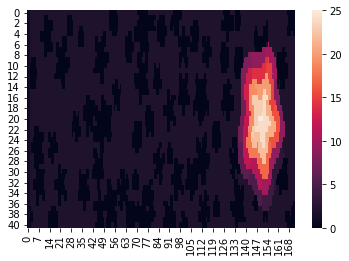

In [55]:
import seaborn as sns
sns.heatmap(data)

In [56]:
data[start_loc]

0

In [27]:
no_inspections = [0 for monkey in monkeys]
for _round in range(20):
    for monkey_no in range(len(monkeys)):
        monkey = monkeys[monkey_no]
        for item in monkey:
            old = item
            exec('item = ' + operation[monkey_no])
            item = int(item / 3)
            if item%dividor[monkey_no] == 0:
                next_monkey = if_true[monkey_no]
            else:
                next_monkey = if_false[monkey_no]
            monkeys[next_monkey] += [item]
            monkeys[monkey_no] = monkeys[monkey_no][1:]
            no_inspections[monkey_no] += 1
np.product(sorted(no_inspections)[-2:])

102399

In [29]:
no_inspections = [0 for monkey in monkeys]
for _round in tqdm(range(10000)):
    for monkey_no in range(len(monkeys)):
        monkey = monkeys[monkey_no]
        for item in monkey:
            old = item
            exec('item = ' + operation[monkey_no])
            if item%dividor[monkey_no] == 0:
                next_monkey = if_true[monkey_no]
            else:
                next_monkey = if_false[monkey_no]
            monkeys[next_monkey] += [item]
            monkeys[monkey_no] = monkeys[monkey_no][1:]
            no_inspections[monkey_no] += 1


  3%|▎         | 306/10000 [1:20:32<42:31:47, 15.79s/it]   


KeyboardInterrupt: 

In [ ]:
np.product(sorted(no_inspections)[-2:])